In [1]:
import pandas as pd
import numpy as np
import os
import sys  
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from tabrepo import EvaluationRepository, Evaluator
from tabrepo.benchmark.experiment import AGModelBagExperiment, ExperimentBatchRunner
from tabrepo.benchmark.result import ExperimentResults
from tabrepo.nips2025_utils.fetch_metadata import load_task_metadata
from tabrepo.nips2025_utils import load_results
repo_dir = "/home/ubuntu/cat_detection/repos/priordetection"
repo = EvaluationRepository.from_dir(repo_dir)

# get the local results
evaluator = Evaluator(repo=repo)
metrics: pd.DataFrame = evaluator.compare_metrics().reset_index().rename(columns={"framework": "method"})

# load the TabArena paper results
tabarena_results: pd.DataFrame = load_results()
tabarena_results = tabarena_results[[c for c in tabarena_results.columns if c in metrics.columns]]

dataset_fold_map = metrics.groupby("dataset")["fold"].apply(set)

def is_in(dataset: str, fold: int) -> bool:
    return (dataset in dataset_fold_map.index) and (fold in dataset_fold_map.loc[dataset])

# filter tabarena_results to only the dataset, fold pairs that are present in `metrics`
is_in_lst = [is_in(dataset, fold) for dataset, fold in zip(tabarena_results["dataset"], tabarena_results["fold"])]
tabarena_results = tabarena_results[is_in_lst]

metrics = pd.concat([
    metrics,
    tabarena_results,
], ignore_index=True)

new_res = pd.DataFrame({dat: {method: np.mean(metrics.loc[np.logical_and(metrics.dataset==dat, metrics.method==method), "metric_error"].values) for method in metrics.method.unique()} for dat in metrics.dataset.unique()}).transpose()
new_res


/home/ubuntu/anaconda3/envs/tabprep/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-08-05 16:55:18,033	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


start: Loading ZS Context
Loading BenchmarkContext:
	name: None
	description: None
	date: None
	folds: [0, 1, 2]
All required files are present...
Loading input files...
	configs :           /home/ubuntu/cat_detection/repos/priordetection/configs.parquet
	metadata:           /home/ubuntu/cat_detection/repos/priordetection/task_metadata.parquet
Loading baselines: baselines.parquet
Loading config hyperparameter definitions... Note: Hyperparameter definitions are only accurate for the latest version.
Loading ZS inputs:
	pred_proba:  /home/ubuntu/cat_detection/repos/priordetection/model_predictions

Aligning GroundTruth with TabularPredictions... (Dataset count 9 -> 9)
Time for Loading ZS Context: 0.2227 secs


,TabM_c1_BAG_L1,TabM_r114_BAG_L1,TabM_r124_BAG_L1,TabM_r12_BAG_L1,TabM_r130_BAG_L1,TabM_r135_BAG_L1,TabM_r136_BAG_L1,TabM_r145_BAG_L1,TabM_r155_BAG_L1,TabM_r169_BAG_L1,...,TABM (tuned),TABPFNV2 (default),TABPFNV2 (tuned + ensemble),TABPFNV2 (tuned),XGB (default),XGB (tuned + ensemble),XGB (tuned),XT (default),XT (tuned + ensemble),XT (tuned)
Bioresponse,0.136569,0.135962,0.142043,0.129692,0.137370,0.135069,0.130396,0.136389,0.136480,0.133280,...,0.131822,0.129153,0.129153,0.129153,0.124737,0.123593,0.124906,0.133445,0.129191,0.132202
Food_Delivery_Time,7.758714,7.751344,7.689158,7.987728,7.717788,7.793280,7.936019,7.760306,7.786440,7.941015,...,7.652119,7.859680,7.859680,7.859680,7.399930,7.402774,7.399930,8.205065,7.758452,7.764326
SDSS17,0.095647,0.090076,0.085870,0.108426,0.087652,0.092569,0.098402,0.089696,0.093612,0.101004,...,0.083707,0.084664,0.084756,0.084756,0.073868,0.073583,0.073868,0.131218,0.078340,0.080886
airfoil_self_noise,1.216996,1.319935,1.316930,1.482972,1.394394,1.256648,1.123120,1.111703,1.273636,1.242069,...,1.109599,1.072100,1.019399,1.065796,1.505007,1.404559,1.394594,1.759215,1.646825,1.651630
coil2000_insurance_policies,0.237145,0.237083,0.241488,0.232212,0.237915,0.233945,0.233925,0.236317,0.235263,0.236501,...,0.233836,0.248055,0.226932,0.228014,0.244815,0.240199,0.244320,0.307153,0.251766,0.253912
customer_satisfaction_in_airline,0.005050,0.004671,0.005736,0.005057,0.004848,0.004717,0.005208,0.005107,0.004730,0.005104,...,0.004972,0.007462,0.007462,0.007462,0.005823,0.005557,0.005575,0.007999,0.006101,0.006193
heloc,0.202932,0.202488,0.202833,0.201476,0.202724,0.204605,0.203584,0.203168,0.202593,0.201985,...,0.200854,0.198600,0.198260,0.198157,0.207274,0.202531,0.202560,0.207975,0.206029,0.207285
students_dropout_and_academic_success,0.544115,0.550544,0.548194,0.547692,0.551343,0.545424,0.543968,0.543035,0.546114,0.543770,...,0.544805,0.535664,0.528743,0.532339,0.554407,0.545867,0.546593,0.593985,0.567566,0.569542
superconductivity,9.378425,9.524574,9.963562,10.351344,10.138072,9.492760,9.223824,9.276369,9.595515,9.333852,...,9.249015,9.512223,9.512223,9.512223,9.324979,9.213101,9.233319,9.324600,9.283060,9.324600


In [3]:
df_results = pd.read_csv("/home/ubuntu/cat_detection/figures/catengineer/results.csv")
df_results 

FileNotFoundError: [Errno 2] No such file or directory: '/home/ubuntu/cat_detection/figures/catengineer/results.csv'

In [12]:
new_model_name = "NumInt_GBM" # FTD_GBM

In [13]:
df_results.config_type.value_counts()

config_type
CAT             1377
EBM             1377
TABPFNV2_GPU    1377
TABM_GPU        1377
MNCA_GPU        1377
XGB             1377
REALMLP         1377
RF              1377
NN_TORCH        1377
FASTAI          1377
LR              1377
GBM             1377
KNN             1377
XT              1377
NumInt_GBM      1377
TABDPT_GPU       459
TABICL_GPU       459
Name: count, dtype: int64

In [14]:
our_res = df_results.loc[df_results.method.apply(lambda x: new_model_name in x)]
our_res['imputed'].value_counts()

imputed
False    1377
Name: count, dtype: int64

In [15]:
our_res.groupby(['dataset'])['imputed'].sum()

dataset
APSFailure                                    0
Amazon_employee_access                        0
Another-Dataset-on-used-Fiat-500              0
Bank_Customer_Churn                           0
Bioresponse                                   0
Diabetes130US                                 0
E-CommereShippingData                         0
Fitness_Club                                  0
Food_Delivery_Time                            0
GiveMeSomeCredit                              0
HR_Analytics_Job_Change_of_Data_Scientists    0
Is-this-a-good-customer                       0
MIC                                           0
Marketing_Campaign                            0
NATICUSdroid                                  0
QSAR-TID-11                                   0
QSAR_fish_toxicity                            0
SDSS17                                        0
airfoil_self_noise                            0
anneal                                        0
bank-marketing                  

In [44]:
our_res.groupby(['dataset'])['imputed'].sum().index[our_res.groupby(['dataset'])['imputed'].sum()==0]

Index(['Amazon_employee_access', 'Another-Dataset-on-used-Fiat-500',
       'Bank_Customer_Churn', 'Diabetes130US', 'E-CommereShippingData',
       'Fitness_Club', 'Food_Delivery_Time',
       'HR_Analytics_Job_Change_of_Data_Scientists', 'Is-this-a-good-customer',
       'MIC', 'Marketing_Campaign', 'SDSS17', 'airfoil_self_noise', 'anneal',
       'bank-marketing', 'churn', 'coil2000_insurance_policies', 'credit-g',
       'credit_card_clients_default', 'customer_satisfaction_in_airline',
       'diamonds', 'healthcare_insurance_expenses',
       'in_vehicle_coupon_recommendation', 'kddcup09_appetency',
       'online_shoppers_intention', 'qsar-biodeg', 'seismic-bumps', 'splice',
       'students_dropout_and_academic_success', 'website_phishing'],
      dtype='object', name='dataset')

In [ ]:
dataset
APSFailure                                    27
maternal_health_risk                          27
diabetes                                      27
diamonds                                      27
hazelnut-spread-contaminant-detection         27
healthcare_insurance_expenses                 27
heloc                                         27
hiva_agnostic                                 27
houses                                        27
in_vehicle_coupon_recommendation              27
jm1                                           27
kddcup09_appetency                            27
miami_housing                                 27
credit_card_clients_default                   27
online_shoppers_intention                     27
physiochemical_protein                        27
polish_companies_bankruptcy                   27
qsar-biodeg                                   27
seismic-bumps                                 27
splice                                        27
students_dropout_and_academic_success         27
superconductivity                             27
taiwanese_bankruptcy_prediction               27
website_phishing                              27
customer_satisfaction_in_airline              27
credit-g                                      27
Amazon_employee_access                        27
concrete_compressive_strength                 27
Bank_Customer_Churn                           27
Bioresponse                                   27
Diabetes130US                                 27
E-CommereShippingData                         27
Fitness_Club                                  27
Food_Delivery_Time                            27
GiveMeSomeCredit                              27
HR_Analytics_Job_Change_of_Data_Scientists    27
Is-this-a-good-customer                       27
MIC                                           27
Marketing_Campaign                            27
NATICUSdroid                                  27
QSAR-TID-11                                   27
SDSS17                                        27
airfoil_self_noise                            27
anneal                                        27
bank-marketing                                27
blood-transfusion-service-center              27
churn                                         27
coil2000_insurance_policies                   27
wine_quality                                  27
QSAR_fish_toxicity                            24
Another-Dataset-on-used-Fiat-500              24
Name: count, dtype: int64

config_type
CAT             1377
EBM             1377
TABPFNV2_GPU    1377
TABM_GPU        1377
MNCA_GPU        1377
XGB             1377
REALMLP         1377
RF              1377
NN_TORCH        1377
FASTAI          1377
LR              1377
GBM             1377
KNN             1377
XT              1377
CSV_GBM         1377
TABDPT_GPU       459
TABICL_GPU       459
Name: count, dtype: int64

In [18]:
df_results

,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,imputed,impute_method,method_type,ta_name,ta_suite,metric_error_val,config_selected,seed,method_metadata,ensemble_weight,method_subtype,config_type
0,APSFailure,0,AutoGluon_v130_bq_4h8c,0.004791,14414.006750,33.704226,roc_auc,binary,False,NaN,baseline,AutoGluon_v130,tabarena-2025-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,APSFailure,1,AutoGluon_v130_bq_4h8c,0.008902,14421.498477,139.436083,roc_auc,binary,False,NaN,baseline,AutoGluon_v130,tabarena-2025-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,APSFailure,2,AutoGluon_v130_bq_4h8c,0.007348,14402.326607,134.433559,roc_auc,binary,False,NaN,baseline,AutoGluon_v130,tabarena-2025-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,APSFailure,3,AutoGluon_v130_bq_4h8c,0.010776,14839.043385,29.852961,roc_auc,binary,False,NaN,baseline,AutoGluon_v130,tabarena-2025-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,APSFailure,4,AutoGluon_v130_bq_4h8c,0.005168,14408.018702,147.060918,roc_auc,binary,False,NaN,baseline,AutoGluon_v130,tabarena-2025-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39979,wine_quality,7,CSV_GBM (tuned),0.628388,1653.131577,1.935866,rmse,regression,False,NaN,hpo,CSV_LightGBM,CSV_LightGBM,0.615837,NaN,NaN,"{""n_iterations"":1,""time_limit"":null,""config_ty...",NaN,tuned,CSV_GBM
39980,wine_quality,7,CSV_GBM (tuned + ensemble),0.629934,1653.131577,5.981853,rmse,regression,False,NaN,hpo,CSV_LightGBM,CSV_LightGBM,0.613239,NaN,NaN,"{""n_iterations"":40,""time_limit"":null,""config_t...",NaN,tuned_ensemble,CSV_GBM
39981,wine_quality,8,CSV_GBM (default),0.630376,7.886349,0.474094,rmse,regression,False,NaN,config,CSV_LightGBM,CSV_LightGBM,0.633193,NaN,NaN,NaN,NaN,default,CSV_GBM
39982,wine_quality,8,CSV_GBM (tuned),0.607814,1969.408352,3.898901,rmse,regression,False,NaN,hpo,CSV_LightGBM,CSV_LightGBM,0.609922,NaN,NaN,"{""n_iterations"":1,""time_limit"":null,""config_ty...",NaN,tuned,CSV_GBM


In [ ]:
# Candidates acc. to CSV-method: (Is-this-a-good-customer?), MIC, churn, qsar-biodeg, 
# Candidates acc. to detector: credit-g, customer_satisfaction_in_airline, Diabetes130US, kdd_appatency, Marketing_Campaign, online_shoppers_intention, qsar-biodeg, students_dropout_and_academic_success, MIC

# coil2000_insurance_policies: romaCatholic found ordinal - not significant. If we use all columns for mvp, we find customerSubtype tp be significant

In [90]:
df_res_lgb = df_results.loc[df_results.method=='GBM (tuned)']
times = df_res_lgb.groupby('dataset')['time_train_s'].max()/60
batch_sizes = times.apply(lambda x: 256 if x<30 else (128 if x<60 else (64 if x<90 else (32 if x<120 else (16 if x<180 else 8)))))
# times.apply(lambda x: 'done' if x<180 else x)
batch_sizes.to_dict()

{'APSFailure': 8,
 'Amazon_employee_access': 128,
 'Another-Dataset-on-used-Fiat-500': 256,
 'Bank_Customer_Churn': 256,
 'Bioresponse': 32,
 'Diabetes130US': 128,
 'E-CommereShippingData': 256,
 'Fitness_Club': 256,
 'Food_Delivery_Time': 64,
 'GiveMeSomeCredit': 16,
 'HR_Analytics_Job_Change_of_Data_Scientists': 256,
 'Is-this-a-good-customer': 256,
 'MIC': 256,
 'Marketing_Campaign': 256,
 'NATICUSdroid': 128,
 'QSAR-TID-11': 32,
 'QSAR_fish_toxicity': 256,
 'SDSS17': 16,
 'airfoil_self_noise': 256,
 'anneal': 256,
 'bank-marketing': 128,
 'blood-transfusion-service-center': 256,
 'churn': 256,
 'coil2000_insurance_policies': 256,
 'concrete_compressive_strength': 256,
 'credit-g': 256,
 'credit_card_clients_default': 128,
 'customer_satisfaction_in_airline': 8,
 'diabetes': 256,
 'diamonds': 64,
 'hazelnut-spread-contaminant-detection': 256,
 'healthcare_insurance_expenses': 256,
 'heloc': 256,
 'hiva_agnostic': 32,
 'houses': 128,
 'in_vehicle_coupon_recommendation': 128,
 'jm1': 

In [62]:
df_results['ta_name'].value_counts()

ta_name
RandomForest         1383
NeuralNetTorch       1377
TabM_GPU             1377
CatBoost             1377
ExplainableBM        1377
ExtraTrees           1377
KNeighbors           1377
LightGBM             1377
LinearModel          1377
NeuralNetFastAI      1377
TabPFNv2_GPU         1377
RealMLP              1377
XGBoost              1377
ModernNCA_GPU        1377
FTD_LightGBM         1371
TabICL_GPU            459
TabDPT_GPU            459
Portfolio-N200-4h     459
AutoGluon_v130        459
Name: count, dtype: int64

In [45]:
use_dat= ['Amazon_employee_access', 'Another-Dataset-on-used-Fiat-500',
       'Bank_Customer_Churn', 'Diabetes130US', 'E-CommereShippingData',
       'Fitness_Club', 'Food_Delivery_Time',
       'HR_Analytics_Job_Change_of_Data_Scientists', 'Is-this-a-good-customer',
       'MIC', 'Marketing_Campaign', 'SDSS17', 'airfoil_self_noise', 'anneal',
       'bank-marketing', 'churn', 'coil2000_insurance_policies', 'credit-g',
       'credit_card_clients_default', 'customer_satisfaction_in_airline',
       'diamonds', 'healthcare_insurance_expenses',
       'in_vehicle_coupon_recommendation', 'kddcup09_appetency',
       'online_shoppers_intention', 'qsar-biodeg', 'seismic-bumps', 'splice',
       'students_dropout_and_academic_success', 'website_phishing']
df_results_success = df_results.loc[df_results.dataset.apply(lambda x: x in use_dat)]
df_results_success

,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,imputed,impute_method,method_type,ta_name,ta_suite,metric_error_val,config_selected,seed,method_metadata,ensemble_weight,method_subtype,config_type
9,Amazon_employee_access,0,AutoGluon_v130_bq_4h8c,0.123072,14402.805040,41.702241,roc_auc,binary,False,NaN,baseline,AutoGluon_v130,tabarena-2025-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,Amazon_employee_access,1,AutoGluon_v130_bq_4h8c,0.111086,14406.321141,44.414292,roc_auc,binary,False,NaN,baseline,AutoGluon_v130,tabarena-2025-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,Amazon_employee_access,2,AutoGluon_v130_bq_4h8c,0.116277,11909.356290,8.547748,roc_auc,binary,False,NaN,baseline,AutoGluon_v130,tabarena-2025-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,Amazon_employee_access,3,AutoGluon_v130_bq_4h8c,0.113317,11304.507581,3.008854,roc_auc,binary,False,NaN,baseline,AutoGluon_v130,tabarena-2025-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13,Amazon_employee_access,4,AutoGluon_v130_bq_4h8c,0.113294,11596.549304,10.664165,roc_auc,binary,False,NaN,baseline,AutoGluon_v130,tabarena-2025-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22459,website_phishing,7,CatAsNum_GBM (tuned),0.278584,1639.703982,0.270505,log_loss,multiclass,False,NaN,hpo,CatAsNum_LightGBM,CatAsNum_LightGBM,0.242798,NaN,NaN,"{""n_iterations"":1,""time_limit"":null,""config_ty...",NaN,tuned,CatAsNum_GBM
22460,website_phishing,7,CatAsNum_GBM (tuned + ensemble),0.274081,1639.703982,1.633034,log_loss,multiclass,False,NaN,hpo,CatAsNum_LightGBM,CatAsNum_LightGBM,0.239807,NaN,NaN,"{""n_iterations"":40,""time_limit"":null,""config_t...",NaN,tuned_ensemble,CatAsNum_GBM
22461,website_phishing,8,CatAsNum_GBM (default),0.273314,6.038458,0.237558,log_loss,multiclass,False,NaN,config,CatAsNum_LightGBM,CatAsNum_LightGBM,0.240693,NaN,NaN,NaN,NaN,default,CatAsNum_GBM
22462,website_phishing,8,CatAsNum_GBM (tuned),0.274660,1811.895723,0.418030,log_loss,multiclass,False,NaN,hpo,CatAsNum_LightGBM,CatAsNum_LightGBM,0.225626,NaN,NaN,"{""n_iterations"":1,""time_limit"":null,""config_ty...",NaN,tuned,CatAsNum_GBM


In [16]:
tune_type = 'tuned + ensemble'
new_t = df_results_success.loc[df_results_success.method==f'{new_model_name} ({tune_type})'].groupby('dataset')['metric_error'].mean()
old_t = df_results_success.loc[df_results_success.method==f'GBM ({tune_type})'].groupby('dataset')['metric_error'].mean()
comp_df = pd.concat([old_t, new_t,],axis=1)
comp_df.columns = ['OLD', 'NEW']
comp_df[comp_df['OLD'].round(4)!=comp_df['NEW'].round(4)]

NameError: name 'df_results_success' is not defined

In [18]:
tune_type = 'tuned + ensemble'
new_t = df_results.loc[df_results.method==f'{new_model_name} ({tune_type})'].groupby('dataset')['metric_error'].mean()
old_t = df_results.loc[df_results.method==f'GBM ({tune_type})'].groupby('dataset')['metric_error'].mean()
comp_df = pd.concat([old_t, new_t,],axis=1)
comp_df.columns = ['OLD', 'NEW']
comp_df[comp_df['OLD'].round(5)!=comp_df['NEW'].round(5)]

,OLD,NEW
dataset,,
Another-Dataset-on-used-Fiat-500,732.170836,733.877518
Bank_Customer_Churn,0.132684,0.135468
Bioresponse,0.124650,0.123250
Diabetes130US,0.327728,0.332955
E-CommereShippingData,0.258586,0.255615
Fitness_Club,0.184420,0.185337
Food_Delivery_Time,7.374089,7.226185
GiveMeSomeCredit,0.133448,0.133024
HR_Analytics_Job_Change_of_Data_Scientists,0.195695,0.196595


In [11]:
old_t

,0,1,2,3,4,5,6,7,8
dataset,,,,,,,,,
APSFailure,0.005174,0.009613,0.007905,0.011166,0.005700,0.006583,0.007920,0.005273,0.009795
Amazon_employee_access,0.151358,0.130723,0.144632,0.136392,0.129327,0.152769,0.150884,0.141269,0.139581
Another-Dataset-on-used-Fiat-500,694.776723,737.296807,749.273951,736.358356,743.159877,743.357648,728.694249,729.100995,727.518919
Bank_Customer_Churn,0.125735,0.124713,0.142014,0.131849,0.148427,0.117929,0.135711,0.131951,0.135823
Bioresponse,0.109711,0.136567,0.126452,0.131250,0.123681,0.120150,0.127546,0.127073,0.119415
Diabetes130US,0.318073,0.336208,0.332098,0.314140,0.332821,0.333095,0.325725,0.324903,0.332491
E-CommereShippingData,0.258223,0.257597,0.253899,0.251246,0.255114,0.263772,0.257128,0.260536,0.269755
Fitness_Club,0.196215,0.185165,0.170800,0.159756,0.191977,0.195913,0.175639,0.175715,0.208598
Food_Delivery_Time,7.414660,7.381106,7.335204,7.419115,7.366898,7.354056,7.434998,7.263490,7.397271


In [9]:
tune_type = 'tuned + ensemble'
new_t = pd.DataFrame(df_results.loc[df_results.method==f'{new_model_name} ({tune_type})'].groupby('dataset')['metric_error'].unique().apply(lambda x: pd.Series(x)))
old_t = pd.DataFrame(df_results.loc[df_results.method==f'GBM ({tune_type})'].groupby('dataset')['metric_error'].unique().apply(lambda x: pd.Series(x)))
comp_df = pd.concat([old_t, new_t,],axis=1)
comp_df.columns = ['OLD', 'NEW']
comp_df[comp_df['OLD'].round(4)!=comp_df['NEW'].round(4)]
# np.sign(old_t.round(4)-new_t.round(4)).sum(axis=1).round(3).sort_values()


ValueError: Length mismatch: Expected axis has 10 elements, new values have 2 elements

In [52]:
np.sign(old_t-new_t).sum(axis=1).round(3).sort_values().mean()

-0.0784313725490196

In [53]:
(old_t-new_t).round(4)

,0,1,2,3,4,5,6,7,8
dataset,,,,,,,,,
APSFailure,0.0000,0.0021,0.0000,0.0001,0.0000,0.0000,0.0005,0.0000,-0.0000
Amazon_employee_access,0.0000,-0.0008,-0.0002,-0.0009,-0.0002,-0.0015,-0.0024,-0.0001,-0.0007
Another-Dataset-on-used-Fiat-500,0.0000,-12.9038,0.0000,-0.0000,-0.3341,-0.0000,0.0000,-0.0000,0.0000
Bank_Customer_Churn,-0.0001,-0.0001,-0.0000,-0.0002,-0.0000,0.0000,0.0000,-0.0003,0.0000
Bioresponse,0.0001,0.0000,0.0000,-0.0002,-0.0016,0.0000,-0.0002,-0.0000,-0.0013
Diabetes130US,0.0002,0.0017,0.0013,0.0007,0.0006,0.0006,-0.0007,-0.0003,0.0017
E-CommereShippingData,0.0000,0.0000,0.0000,0.0010,0.0000,0.0000,0.0000,0.0000,-0.0000
Fitness_Club,-0.0003,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0101
Food_Delivery_Time,-0.0150,0.0000,-0.0297,-0.0000,-0.0078,0.0000,-0.0215,-0.0110,-0.0279


In [5]:
results

{'time_train_s': 6.6701414585113525,
 'time_infer_s': 0.5617718696594238,
 'metric_error': 0.23963793232669206,
 'task_metadata': {'tid': 363712,
  'name': 'jm1',
  'fold': 0,
  'repeat': 0,
  'sample': 0,
  'split_idx': 0},
 'framework': 'LightGBM_c1_BAG_L1',
 'problem_type': 'binary',
 'metric': 'roc_auc',
 'simulation_artifacts': {'pred_proba_dict_val': {'LightGBM_c1_BAG_L1': array([0.09919029, 0.03729803, 0.13169564, ..., 0.08938268, 0.17596658,
          0.23833612], dtype=float32)},
  'y_val': array([0, 0, 0, ..., 1, 1, 1], dtype=int8),
  'eval_metric': 'roc_auc',
  'problem_type': 'binary',
  'problem_type_transform': 'binary',
  'ordered_class_labels': [False, True],
  'ordered_class_labels_transformed': [0, 1],
  'num_classes': 2,
  'label': 'defects',
  'pred_proba_dict_test': {'LightGBM_c1_BAG_L1': array([0.07159079, 0.17100428, 0.16859338, ..., 0.5796915 , 0.44432092,
          0.13891792], dtype=float32)},
  'y_test': array([0, 0, 0, ..., 1, 1, 1], dtype=int8),
  'y_test_i

In [ ]:
from tabrepo.nips2025_utils.tabarena_context import TabArenaContext
tabarena_context = TabArenaContext()
mod_configs = tabarena_context.load_configs_hyperparameters(['LightGBM'], download='auto')  # load hyperparameters for the methods


In [15]:
sorted_params = {key: float(key.split('_')[1].lstrip('r')) for key in mod_configs.keys() if key.split('_')[1]!='c1'}
sorted_params = pd.Series(sorted_params).sort_values().index.tolist()
sorted_params

['LightGBM_r1_BAG_L1',
 'LightGBM_r2_BAG_L1',
 'LightGBM_r3_BAG_L1',
 'LightGBM_r4_BAG_L1',
 'LightGBM_r5_BAG_L1',
 'LightGBM_r6_BAG_L1',
 'LightGBM_r7_BAG_L1',
 'LightGBM_r8_BAG_L1',
 'LightGBM_r9_BAG_L1',
 'LightGBM_r10_BAG_L1',
 'LightGBM_r11_BAG_L1',
 'LightGBM_r12_BAG_L1',
 'LightGBM_r13_BAG_L1',
 'LightGBM_r14_BAG_L1',
 'LightGBM_r15_BAG_L1',
 'LightGBM_r16_BAG_L1',
 'LightGBM_r17_BAG_L1',
 'LightGBM_r18_BAG_L1',
 'LightGBM_r19_BAG_L1',
 'LightGBM_r20_BAG_L1',
 'LightGBM_r21_BAG_L1',
 'LightGBM_r22_BAG_L1',
 'LightGBM_r23_BAG_L1',
 'LightGBM_r24_BAG_L1',
 'LightGBM_r25_BAG_L1',
 'LightGBM_r26_BAG_L1',
 'LightGBM_r27_BAG_L1',
 'LightGBM_r28_BAG_L1',
 'LightGBM_r29_BAG_L1',
 'LightGBM_r30_BAG_L1',
 'LightGBM_r31_BAG_L1',
 'LightGBM_r32_BAG_L1',
 'LightGBM_r33_BAG_L1',
 'LightGBM_r34_BAG_L1',
 'LightGBM_r35_BAG_L1',
 'LightGBM_r36_BAG_L1',
 'LightGBM_r37_BAG_L1',
 'LightGBM_r38_BAG_L1',
 'LightGBM_r39_BAG_L1',
 'LightGBM_r40_BAG_L1',
 'LightGBM_r41_BAG_L1',
 'LightGBM_r42_BAG_L1',
 

In [46]:
res = tabarena_context.load_config_results('LightGBM')
res = res.loc[res.dataset=="airfoil_self_noise"]
res = res.loc[res.fold==0]
res

,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,metric_error_val,imputed,impute_method,method_type,config_type,ta_name,ta_suite
57888,airfoil_self_noise,0,LightGBM_c1_BAG_L1,1.485371,11.884250,1.779816,rmse,regression,1.652822,False,None,config,GBM,LightGBM,tabarena-2025-06-12
57889,airfoil_self_noise,0,LightGBM_r100_BAG_L1,1.387637,7.561719,1.652006,rmse,regression,1.639229,False,None,config,GBM,LightGBM,tabarena-2025-06-12
57890,airfoil_self_noise,0,LightGBM_r101_BAG_L1,1.443849,8.266808,1.186353,rmse,regression,1.692075,False,None,config,GBM,LightGBM,tabarena-2025-06-12
57891,airfoil_self_noise,0,LightGBM_r102_BAG_L1,2.326881,6.178916,1.187463,rmse,regression,2.599595,False,None,config,GBM,LightGBM,tabarena-2025-06-12
57892,airfoil_self_noise,0,LightGBM_r103_BAG_L1,1.932312,8.500026,1.408578,rmse,regression,2.251546,False,None,config,GBM,LightGBM,tabarena-2025-06-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58084,airfoil_self_noise,0,LightGBM_r96_BAG_L1,1.996375,8.694938,1.969823,rmse,regression,2.364051,False,None,config,GBM,LightGBM,tabarena-2025-06-12
58085,airfoil_self_noise,0,LightGBM_r97_BAG_L1,1.783970,6.737598,1.250000,rmse,regression,2.077761,False,None,config,GBM,LightGBM,tabarena-2025-06-12
58086,airfoil_self_noise,0,LightGBM_r98_BAG_L1,1.871379,7.806643,1.463800,rmse,regression,2.113171,False,None,config,GBM,LightGBM,tabarena-2025-06-12
58087,airfoil_self_noise,0,LightGBM_r99_BAG_L1,2.769899,5.717493,1.156343,rmse,regression,2.993555,False,None,config,GBM,LightGBM,tabarena-2025-06-12


In [20]:
mod_configs[ 'LightGBM_r9_BAG_L1']['hyperparameters']

{'ag_args': {'name_suffix': '_r9'},
 'bagging_fraction': 0.9292925595304,
 'bagging_freq': 1,
 'cat_l2': 0.2043927060013,
 'cat_smooth': 2.2692497770756,
 'extra_trees': False,
 'feature_fraction': 0.4037251099523,
 'lambda_l1': 0.6257740962955,
 'lambda_l2': 1.2674881653251,
 'learning_rate': 0.0864584339434,
 'max_cat_to_onehot': 9,
 'min_data_in_leaf': 10,
 'min_data_per_group': 3,
 'num_leaves': 139,
 'ag_args_ensemble': {'ag.max_time_limit': 3600}}

In [16]:
med_ = metrics.groupby("dataset")["metric_error"].median().sort_values(ascending=False)
min_ = metrics.groupby("dataset")["metric_error"].min().sort_values(ascending=False)

In [2]:
import pandas as pd

def minmax_normalize(series: pd.Series, data_min: float, data_max: float) -> pd.Series:
    """
    Normalize a pandas Series to the [0, 1] range using a fixed known input range.

    Parameters:
        series (pd.Series): Input data to normalize.
        data_min (float): Known minimum of the original data range.
        data_max (float): Known maximum of the original data range.

    Returns:
        pd.Series: Normalized series in the [0, 1] range.
    """
    if data_max == data_min:
        raise ValueError("data_max and data_min must be different to avoid division by zero.")

    return (series - data_min) / (data_max - data_min)


med_ = metrics.groupby("dataset")["metric_error"].median().sort_values(ascending=False)
min_ = metrics.groupby("dataset")["metric_error"].min().sort_values(ascending=False)



In [4]:
default = metrics.loc[metrics["method"]=="REALMLP (default)"]
default['metric_error'].groupby(default['dataset']).mean()

dataset
Bioresponse                              0.144392
Food_Delivery_Time                       7.928126
SDSS17                                   0.103267
airfoil_self_noise                       1.162073
coil2000_insurance_policies              0.254768
customer_satisfaction_in_airline         0.005100
heloc                                    0.201347
students_dropout_and_academic_success    0.558794
superconductivity                        9.431070
Name: metric_error, dtype: float64

In [27]:
default = metrics.loc[metrics["method"]=="GBM (default)"]
default['metric_error'].groupby(default['dataset']).mean()

dataset
Bioresponse                              0.125092
Food_Delivery_Time                       7.612543
SDSS17                                   0.087134
airfoil_self_noise                       1.519199
coil2000_insurance_policies              0.250340
customer_satisfaction_in_airline         0.005641
heloc                                    0.205682
students_dropout_and_academic_success    0.554921
superconductivity                        9.267409
Name: metric_error, dtype: float64

In [9]:
method = "LightGBM"

In [10]:
from tabrepo.nips2025_utils.tabarena_context import TabArenaContext
download_results = "auto"  # results must be downloaded for the script to work
elo_bootstrap_rounds = 100  # 1 for toy, 100 for paper
save_path = "output_paper_results"  # folder to save all figures and tables
use_latex = False  # Set to True if you have the appropriate latex packages installed for nicer figure style

tabarena_context = TabArenaContext()
df_results = tabarena_context.load_results_paper(download_results=download_results)
res = tabarena_context.load_config_results(method=method)
res


,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,metric_error_val,imputed,impute_method,method_type,config_type,ta_name,ta_suite
0,APSFailure,0,LightGBM_c1_BAG_L1,0.005363,21.912855,0.792875,roc_auc,binary,0.011860,False,None,config,GBM,LightGBM,tabarena-2025-06-12
1,APSFailure,0,LightGBM_r100_BAG_L1,0.005182,41.723646,1.281091,roc_auc,binary,0.010255,False,None,config,GBM,LightGBM,tabarena-2025-06-12
2,APSFailure,0,LightGBM_r101_BAG_L1,0.005131,22.873132,0.854574,roc_auc,binary,0.011082,False,None,config,GBM,LightGBM,tabarena-2025-06-12
3,APSFailure,0,LightGBM_r102_BAG_L1,0.005115,56.923874,4.826138,roc_auc,binary,0.010909,False,None,config,GBM,LightGBM,tabarena-2025-06-12
4,APSFailure,0,LightGBM_r103_BAG_L1,0.005090,54.525089,2.060975,roc_auc,binary,0.010507,False,None,config,GBM,LightGBM,tabarena-2025-06-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164011,wine_quality,8,LightGBM_r96_BAG_L1,0.622538,13.350020,4.280685,rmse,regression,0.624238,False,None,config,GBM,LightGBM,tabarena-2025-06-12
164012,wine_quality,8,LightGBM_r97_BAG_L1,0.645354,11.050635,3.786304,rmse,regression,0.644035,False,None,config,GBM,LightGBM,tabarena-2025-06-12
164013,wine_quality,8,LightGBM_r98_BAG_L1,0.626193,8.030612,1.452405,rmse,regression,0.630136,False,None,config,GBM,LightGBM,tabarena-2025-06-12
164014,wine_quality,8,LightGBM_r99_BAG_L1,0.671965,7.857919,2.543379,rmse,regression,0.686337,False,None,config,GBM,LightGBM,tabarena-2025-06-12


In [13]:
{i: 128 for i in df_results.dataset.unique()}

{'APSFailure': 128,
 'Amazon_employee_access': 128,
 'Another-Dataset-on-used-Fiat-500': 128,
 'Bank_Customer_Churn': 128,
 'Bioresponse': 128,
 'Diabetes130US': 128,
 'E-CommereShippingData': 128,
 'Fitness_Club': 128,
 'Food_Delivery_Time': 128,
 'GiveMeSomeCredit': 128,
 'HR_Analytics_Job_Change_of_Data_Scientists': 128,
 'Is-this-a-good-customer': 128,
 'MIC': 128,
 'Marketing_Campaign': 128,
 'NATICUSdroid': 128,
 'QSAR-TID-11': 128,
 'QSAR_fish_toxicity': 128,
 'SDSS17': 128,
 'airfoil_self_noise': 128,
 'anneal': 128,
 'bank-marketing': 128,
 'blood-transfusion-service-center': 128,
 'churn': 128,
 'coil2000_insurance_policies': 128,
 'concrete_compressive_strength': 128,
 'credit-g': 128,
 'credit_card_clients_default': 128,
 'customer_satisfaction_in_airline': 128,
 'diabetes': 128,
 'diamonds': 128,
 'hazelnut-spread-contaminant-detection': 128,
 'healthcare_insurance_expenses': 128,
 'heloc': 128,
 'hiva_agnostic': 128,
 'houses': 128,
 'in_vehicle_coupon_recommendation': 12

In [ ]:
{'APSFailure': 16,
 'Amazon_employee_access': 16,
 'Another-Dataset-on-used-Fiat-500': 128,
 'Bank_Customer_Churn': 128,
 'Bioresponse': 16,
 'Diabetes130US': 128,
 'E-CommereShippingData': 128,
 'Fitness_Club': 128,
 'Food_Delivery_Time': 128,
 'GiveMeSomeCredit': 128,
 'HR_Analytics_Job_Change_of_Data_Scientists': 128,
 'Is-this-a-good-customer': 128,
 'MIC': 128,
 'Marketing_Campaign': 128,
 'NATICUSdroid': 128,
 'QSAR-TID-11': 128,
 'QSAR_fish_toxicity': 128,
 'SDSS17': 128,
 'airfoil_self_noise': 128,
 'anneal': 128,
 'bank-marketing': 128,
 'blood-transfusion-service-center': 128,
 'churn': 128,
 'coil2000_insurance_policies': 128,
 'concrete_compressive_strength': 128,
 'credit-g': 128,
 'credit_card_clients_default': 128,
 'customer_satisfaction_in_airline': 128,
 'diabetes': 128,
 'diamonds': 128,
 'hazelnut-spread-contaminant-detection': 128,
 'healthcare_insurance_expenses': 128,
 'heloc': 128,
 'hiva_agnostic': 128,
 'houses': 128,
 'in_vehicle_coupon_recommendation': 128,
 'jm1': 128,
 'kddcup09_appetency': 128,
 'maternal_health_risk': 128,
 'miami_housing': 128,
 'online_shoppers_intention': 128,
 'physiochemical_protein': 128,
 'polish_companies_bankruptcy': 128,
 'qsar-biodeg': 16,
 'seismic-bumps': 128,
 'splice': 64,
 'students_dropout_and_academic_success': 128,
 'superconductivity': 16,
 'taiwanese_bankruptcy_prediction': 64,
 'website_phishing': 128,
 'wine_quality': 128}

In [8]:
old_res = pd.DataFrame({dataset_name: {i: res.loc[np.logical_and(res.dataset == dataset_name, res.method == i),"metric_error"].iloc[:20].mean() for i in new_res.columns[:20]} for dataset_name in new_res.index}).transpose()
old_res

,TabM_c1_BAG_L1,TabM_r114_BAG_L1,TabM_r124_BAG_L1,TabM_r12_BAG_L1,TabM_r130_BAG_L1,TabM_r135_BAG_L1,TabM_r136_BAG_L1,TabM_r145_BAG_L1,TabM_r155_BAG_L1,TabM_r169_BAG_L1,TabM_r16_BAG_L1,TabM_r171_BAG_L1,TabM_r192_BAG_L1,TabM_r27_BAG_L1,TabM_r51_BAG_L1,TabM_r58_BAG_L1,TabM_r82_BAG_L1,TabM_r89_BAG_L1,TabM_r96_BAG_L1,TabM_r9_BAG_L1
Bioresponse,0.136793,0.136593,0.142345,0.133870,0.137577,0.135915,0.132093,0.137085,0.136830,0.135455,0.139047,0.134049,0.138016,0.138320,0.137221,0.137300,0.134769,0.143595,0.131349,0.139959
Food_Delivery_Time,7.761754,7.748112,7.689272,7.985171,7.711410,7.788712,7.934361,7.764016,7.786401,7.937785,7.689740,7.831758,7.749224,7.790463,7.765680,7.721587,7.930301,7.747898,7.987758,7.819444
SDSS17,0.096459,0.117531,0.094078,0.114590,0.089961,0.107994,0.107878,0.089725,0.095850,0.122562,0.085814,0.100747,0.091028,0.093118,0.095229,0.105458,0.106010,0.157936,0.111387,0.143143
airfoil_self_noise,1.256287,1.376188,1.352287,1.507809,1.420528,1.301147,1.151006,1.142581,1.301544,1.293223,1.206240,1.185004,1.148858,1.194378,1.176467,1.529557,1.331682,1.481902,1.293485,1.451676
coil2000_insurance_policies,0.239137,0.238209,0.241078,0.233509,0.238180,0.236713,0.237381,0.236600,0.237458,0.238185,0.240535,0.236193,0.238107,0.238970,0.238194,0.240110,0.235828,0.240848,0.236824,0.241758
customer_satisfaction_in_airline,0.005093,0.009131,0.007053,0.006848,0.005872,0.008375,0.008283,0.005323,0.007090,0.012945,0.005501,0.007955,0.005834,0.005335,0.008186,0.008279,0.008732,0.010800,0.006066,0.009977
heloc,0.202902,0.203056,0.203592,0.201959,0.203333,0.204098,0.203859,0.203770,0.202744,0.202198,0.204396,0.202913,0.204426,0.203408,0.204321,0.205676,0.202624,0.201485,0.202173,0.202595
students_dropout_and_academic_success,0.543586,0.550910,0.549665,0.544818,0.550364,0.545929,0.541243,0.545871,0.546556,0.541872,0.548376,0.542225,0.546951,0.543451,0.545340,0.548988,0.544417,0.545894,0.539767,0.545010
superconductivity,9.583915,10.410197,10.795889,12.090962,10.542013,10.205491,10.310099,9.619045,10.143879,11.317705,9.786533,10.260471,9.738828,9.524749,10.361611,10.902791,10.467966,11.927868,10.357276,11.743567


In [9]:
new_res[old_res.columns].min(axis=1),old_res.min(axis=1)

(Bioresponse                              0.129692
 Food_Delivery_Time                       7.689158
 SDSS17                                   0.085870
 airfoil_self_noise                       1.111703
 coil2000_insurance_policies              0.232212
 customer_satisfaction_in_airline         0.004613
 heloc                                    0.201085
 students_dropout_and_academic_success    0.541556
 superconductivity                        9.223824
 dtype: float64,
 Bioresponse                              0.131349
 Food_Delivery_Time                       7.689272
 SDSS17                                   0.085814
 airfoil_self_noise                       1.142581
 coil2000_insurance_policies              0.233509
 customer_satisfaction_in_airline         0.005093
 heloc                                    0.201485
 students_dropout_and_academic_success    0.539767
 superconductivity                        9.524749
 dtype: float64)

In [11]:
old_res = pd.DataFrame({dat: minmax_normalize(old_res.loc[dat], min_[dat], med_[dat]) for dat in old_res.index}).transpose()
new_res = pd.DataFrame({dat: minmax_normalize(new_res.loc[dat], min_[dat], med_[dat]) for dat in old_res.index}).transpose()

<Axes: >

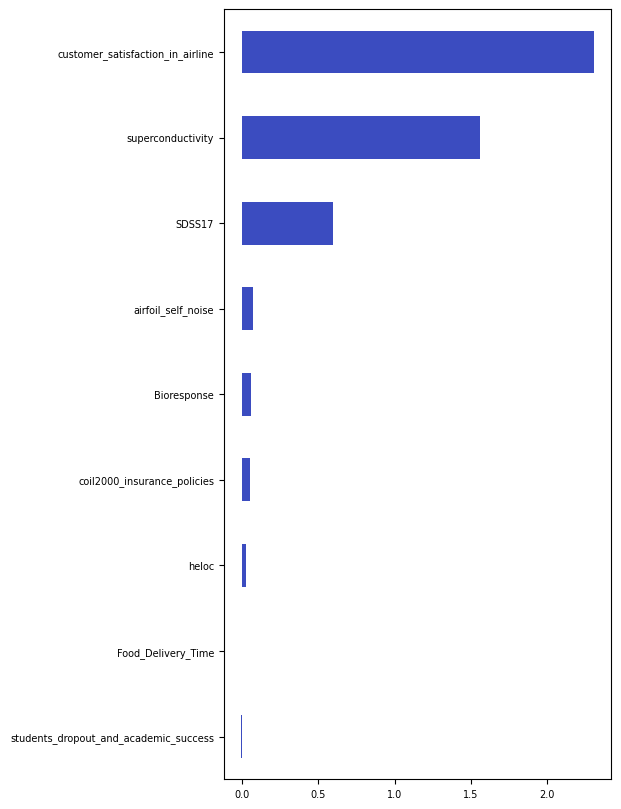

In [12]:
(old_res-new_res[old_res.columns]).mean(axis=1).sort_values().plot(kind='barh', figsize=(5, 10), colormap='coolwarm')

<Axes: >

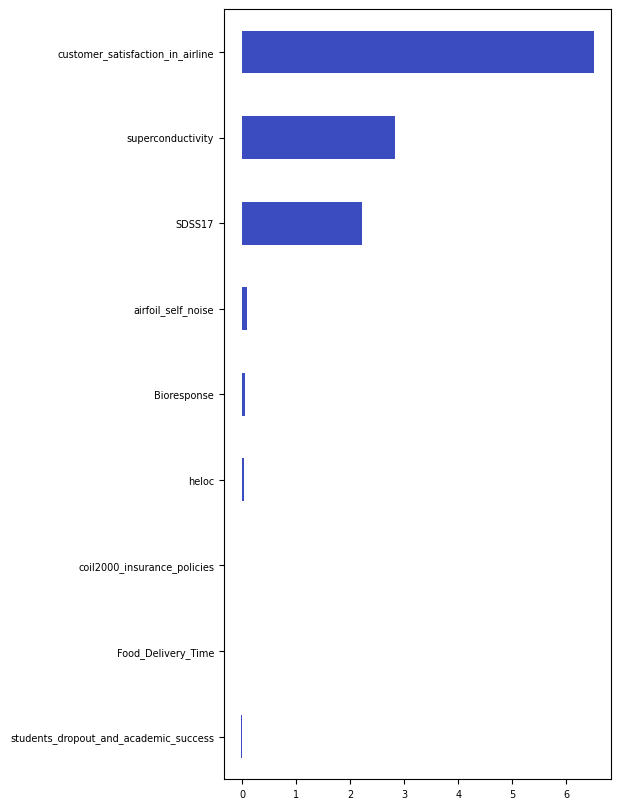

In [14]:
(old_res.max(axis=1)-new_res[old_res.columns].max(axis=1)).sort_values().plot(kind='barh', figsize=(5, 10), colormap='coolwarm')

In [58]:
old_res.max()

CatBoost_r110_BAG_L1    1.174771
CatBoost_r111_BAG_L1    0.940914
CatBoost_r126_BAG_L1    1.138050
CatBoost_r128_BAG_L1    0.940295
CatBoost_r147_BAG_L1    1.134035
CatBoost_r149_BAG_L1    1.481539
CatBoost_r172_BAG_L1    0.942237
CatBoost_r173_BAG_L1    1.149671
CatBoost_r174_BAG_L1    1.303558
CatBoost_r17_BAG_L1     1.160221
CatBoost_r199_BAG_L1    1.307670
CatBoost_r23_BAG_L1     1.109443
CatBoost_r24_BAG_L1     1.187805
CatBoost_r32_BAG_L1     1.411573
CatBoost_r36_BAG_L1     1.248985
CatBoost_r58_BAG_L1     1.205497
CatBoost_r62_BAG_L1     1.389821
CatBoost_r71_BAG_L1     2.158362
CatBoost_r79_BAG_L1     1.120227
CatBoost_r95_BAG_L1     1.974707
dtype: float64

In [7]:
openml.tasks.get_task(363684).get_dataset().name


'Marketing_Campaign'

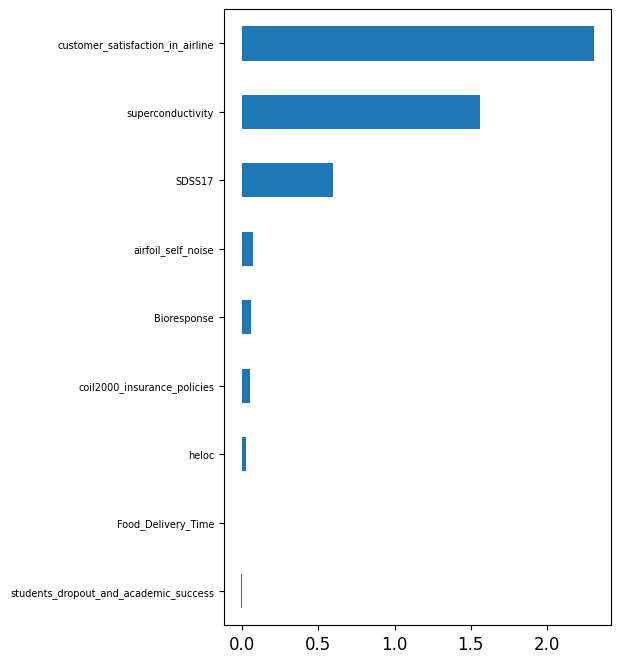

In [13]:
import matplotlib.pyplot as plt

(old_res - new_res[old_res.columns]).mean(axis=1).sort_values().plot(kind='barh', figsize=(5,8))
plt.xticks(fontsize=12)  # You can change 12 to any size you prefer
plt.show()


<Axes: >

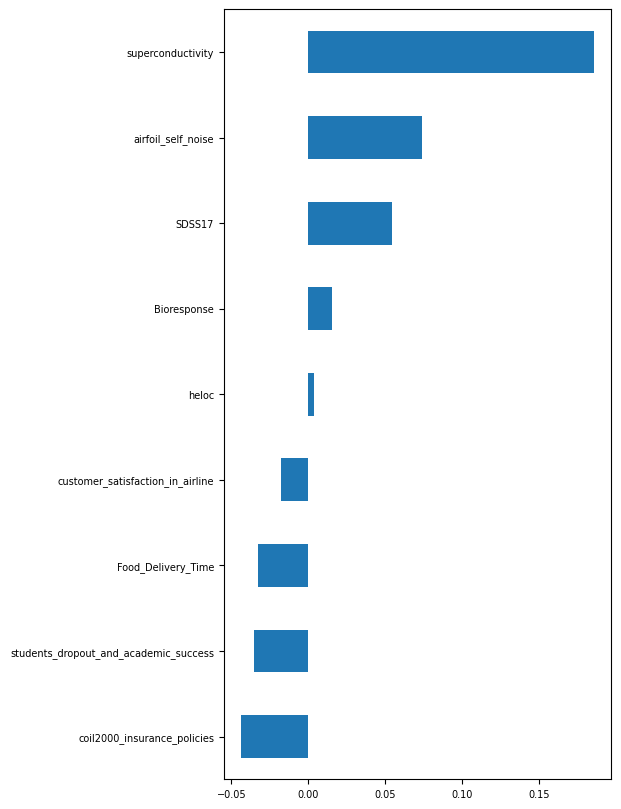

In [51]:
(old_res.max(axis=1)-new_res[old_res.columns].max(axis=1)).sort_values().plot(kind='barh', figsize=(5, 10))

In [70]:
new_res[old_res.columns].max(axis=1)

Bioresponse                              1.314309
Food_Delivery_Time                       1.614031
SDSS17                                   2.162189
airfoil_self_noise                       1.190093
coil2000_insurance_policies              0.870114
customer_satisfaction_in_airline         1.308179
heloc                                    1.090212
students_dropout_and_academic_success    0.982459
dtype: float64

In [44]:
np.sign(old_res-new_res[old_res.columns]).mean(axis=1),np.sign(old_res-new_res[old_res.columns]).mean(axis=1).mean()

(Bioresponse                             -0.1
 Food_Delivery_Time                      -1.0
 SDSS17                                   1.0
 airfoil_self_noise                       1.0
 coil2000_insurance_policies             -0.5
 customer_satisfaction_in_airline        -0.9
 heloc                                    0.7
 students_dropout_and_academic_success   -0.7
 superconductivity                        1.0
 dtype: float64,
 np.float64(0.05555555555555555))

In [11]:
old_res.min(axis=1)-new_res[old_res.columns].min(axis=1)

Bioresponse                             -0.000126
Food_Delivery_Time                      -0.000520
SDSS17                                   0.000231
airfoil_self_noise                       0.052513
coil2000_insurance_policies             -0.000939
customer_satisfaction_in_airline        -0.000012
heloc                                    0.000317
students_dropout_and_academic_success   -0.000417
superconductivity                        0.122811
dtype: float64

In [12]:
old_res.min(axis=1),new_res[old_res.columns].min(axis=1)

(Bioresponse                              0.123949
 Food_Delivery_Time                       7.366354
 SDSS17                                   0.073684
 airfoil_self_noise                       1.391148
 coil2000_insurance_policies              0.238189
 customer_satisfaction_in_airline         0.005401
 heloc                                    0.201717
 students_dropout_and_academic_success    0.540719
 superconductivity                        9.341475
 dtype: float64,
 Bioresponse                              0.124075
 Food_Delivery_Time                       7.366874
 SDSS17                                   0.073453
 airfoil_self_noise                       1.338634
 coil2000_insurance_policies              0.239128
 customer_satisfaction_in_airline         0.005413
 heloc                                    0.201400
 students_dropout_and_academic_success    0.541136
 superconductivity                        9.218664
 dtype: float64)

In [38]:
ours = res_df["LightGBM_r103_BAG_L1"].copy()
ours.name = "ours"
comparison = pd.concat([old_res["LightGBM_r103_BAG_L1"], ours], axis=1)

diff = comparison.diff(axis=1).iloc[:, 1]
print(f'Agreement: {sum(diff==0)}')
print(f'Detection worse: {sum(diff>0)}')
print(f'Detection better: {sum(diff<0)}')

KeyError: 'LightGBM_r103_BAG_L1'

In [17]:
diff

airfoil_self_noise   -0.001755
Name: ours, dtype: float64

In [1]:
res_df

NameError: name 'res_df' is not defined

In [28]:
comparison = {}

consistently_better = set()
consistently_worse = set()
equal = set()

for num, param in enumerate(res_df.columns[:20]):
    print(param)
    ours = res_df[param].copy()
    ours.name = "ours"
    comparison[param] = pd.concat([old_res[param], ours], axis=1)

    diff = comparison[param].diff(axis=1).iloc[:, 1]
    print(f'Agreement: {sum(diff==0)}')
    print(f'Detection worse: {sum(diff>0)}')
    print(f'Detection better: {sum(diff<0)}')

    if num == 0:
        consistently_better = set(diff[diff < 0].index)
        consistently_worse = set(diff[diff > 0].index)
    else:
        consistently_better = consistently_better.intersection(set(diff[diff < 0].index))
        consistently_worse = consistently_worse.intersection(set(diff[diff > 0].index))
        equal = set(diff.index)-consistently_better-consistently_worse


print("--"*20)
print(f'Consistently better: {len(consistently_better)}')
print(f'Consistently worse: {len(consistently_worse)}')
print(f'Equal: {len(equal)}')

LightGBM_r101_BAG_L1
Agreement: 0
Detection worse: 3
Detection better: 6
LightGBM_r103_BAG_L1
Agreement: 0
Detection worse: 2
Detection better: 7
LightGBM_r133_BAG_L1
Agreement: 0
Detection worse: 3
Detection better: 6
LightGBM_r143_BAG_L1
Agreement: 0
Detection worse: 6
Detection better: 3
LightGBM_r146_BAG_L1
Agreement: 0
Detection worse: 3
Detection better: 6
LightGBM_r14_BAG_L1
Agreement: 0
Detection worse: 4
Detection better: 5
LightGBM_r151_BAG_L1
Agreement: 0
Detection worse: 4
Detection better: 5
LightGBM_r16_BAG_L1
Agreement: 0
Detection worse: 2
Detection better: 7
LightGBM_r173_BAG_L1
Agreement: 0
Detection worse: 4
Detection better: 5
LightGBM_r176_BAG_L1
Agreement: 0
Detection worse: 4
Detection better: 5
LightGBM_r190_BAG_L1
Agreement: 0
Detection worse: 2
Detection better: 7
LightGBM_r31_BAG_L1
Agreement: 0
Detection worse: 2
Detection better: 7
LightGBM_r3_BAG_L1
Agreement: 0
Detection worse: 5
Detection better: 4
LightGBM_r59_BAG_L1
Agreement: 0
Detection worse: 2
Dete

In [46]:
consistently_worse

{'Bioresponse',
 'anneal',
 'online_shoppers_intention',
 'students_dropout_and_academic_success'}

In [34]:
diff[diff>0].sort_values().index

Index(['Is-this-a-good-customer', 'online_shoppers_intention',
       'E-CommereShippingData', 'Amazon_employee_access',
       'coil2000_insurance_policies', 'qsar-biodeg', 'Bioresponse',
       'students_dropout_and_academic_success', 'anneal'],
      dtype='object')

In [42]:
param = res_df.columns[0]
diff = comparison[param].diff(axis=1).iloc[:, 1]
comparison[param].loc[diff[diff>0].sort_values().index]

,LightGBM_r14_BAG_L1_catdetect,ours
online_shoppers_intention,0.068345,0.068350
HR_Analytics_Job_Change_of_Data_Scientists,0.200793,0.200849
Fitness_Club,0.185518,0.185670
maternal_health_risk,0.528340,0.528516
Bioresponse,0.131478,0.132748
anneal,0.054357,0.056532
students_dropout_and_academic_success,0.547991,0.555235


In [41]:
param = res_df.columns[1]
diff = comparison[param].diff(axis=1).iloc[:, 1]
comparison[param].loc[diff[diff>0].sort_values().index]

,LightGBM_r173_BAG_L1_catdetect,ours
Is-this-a-good-customer,0.249205,0.249207
online_shoppers_intention,0.071038,0.071099
E-CommereShippingData,0.256530,0.256594
Amazon_employee_access,0.152897,0.153117
coil2000_insurance_policies,0.243229,0.243849
qsar-biodeg,0.065041,0.065865
Bioresponse,0.132027,0.133200
students_dropout_and_academic_success,0.555062,0.557006
anneal,0.064650,0.067312


In [27]:
res_df

,LightGBM_r14_BAG_L1_catdetect,LightGBM_r173_BAG_L1_catdetect,AutoGluon 1.3 (4h),CAT (default),CAT (tuned + ensemble),CAT (tuned),EBM (default),EBM (tuned + ensemble),EBM (tuned),FASTAI (default),...,TABM (tuned),TABPFNV2 (default),TABPFNV2 (tuned + ensemble),TABPFNV2 (tuned),XGB (default),XGB (tuned + ensemble),XGB (tuned),XT (default),XT (tuned + ensemble),XT (tuned)
Food_Delivery_Time,7.461884,7.504568,7.365483,7.377622,7.369584,7.368665,7.428226,7.41107,7.432078,8.183454,...,7.652119,7.85968,7.85968,7.85968,7.39993,7.402774,7.39993,8.205065,7.758452,7.764326


### S3 stuff

In [ ]:
# import sys 
# import os
# exp_name = 'ftd'
# redownload = True  # Set to True if you want to redownload the results
# if not os.path.exists("results"):
#     os.mkdir("results")
# if not os.path.exists(f"results/{exp_name}") or redownload:
#     os.system(f"aws s3 cp --recursive s3://prateek-ag/{exp_name}/ results/{exp_name}/")
# else:
#     print(f"Results for {exp_name} already exist in results/{exp_name}. No need to download again.")

download: s3://prateek-ag/ftd/config/tasks/Anot-r0-f0-LightGBM-r10-464-20250723-212044-2970_tasks.json to results/ftd/config/tasks/Anot-r0-f0-LightGBM-r10-464-20250723-212044-2970_tasks.json
download: s3://prateek-ag/ftd/config/tasks/Anot-r0-f0-LightGBM-r14-469-20250723-212052-2785_tasks.json to results/ftd/config/tasks/Anot-r0-f0-LightGBM-r14-469-20250723-212052-2785_tasks.json
download: s3://prateek-ag/ftd/config/tasks/Anot-r0-f0-LightGBM-c1-451-20250723-212024-9765_tasks.json to results/ftd/config/tasks/Anot-r0-f0-LightGBM-c1-451-20250723-212024-9765_tasks.json
download: s3://prateek-ag/ftd/config/tasks/Anot-r0-f0-LightGBM-r12-467-20250723-212049-1415_tasks.json to results/ftd/config/tasks/Anot-r0-f0-LightGBM-r12-467-20250723-212049-1415_tasks.json
download: s3://prateek-ag/ftd/config/methods_config.yaml to results/ftd/config/methods_config.yaml
download: s3://prateek-ag/ftd/config/tasks/Anot-r0-f0-LightGBM-r13-468-20250723-212051-5932_tasks.json to results/ftd/config/tasks/Anot-r0-

cancelled: ctrl-c received                                                            


In [72]:
def get_val_test_corr(tids, model_names=['LightGBM', 'CatBoost', 'XGBoost', 'TabPFNv2_GPU', 'RealMLP', 'TabM_GPU']):
    res_mean = pd.DataFrame(columns=model_names)
    res_std = pd.DataFrame(columns=model_names)
    res_all = {}
    for tid, did in zip(tids, dids):
        res_all[tid] = {}
        task = openml.tasks.get_task(tid)  # to check if the datasets are available
        data = openml.datasets.get_dataset(did)  # to check if the datasets are available
        for model_name in model_names:
            res_all[tid][model_name] = {}
            res = tabarena_context.load_config_results(model_name)
            res = res.loc[res.dataset==data.name]
            cor_lst = []
            for fold in res.fold.unique():
                res_use = res.loc[res.fold==fold].copy()
                cor_lst.append(res_use[['metric_error','metric_error_val']].corr('spearman').iloc[0,1])

            res_mean.loc[data.name, model_name] = np.mean(cor_lst)
            res_std.loc[data.name, model_name] = np.std(cor_lst)
            res_all[tid][model_name][data.name] = cor_lst
    return res_mean, res_std, res_all

res_mean, res_std, res_all = get_val_test_corr(tids)

In [76]:
res_mean.median()

LightGBM        0.830695
CatBoost        0.637635
XGBoost         0.755284
TabPFNv2_GPU    0.712729
RealMLP         0.553057
TabM_GPU        0.626706
dtype: object

In [73]:
res_mean.astype(float).round(4).astype(str) + " ± " + res_std.astype(float).round(4).astype(str)

,LightGBM,CatBoost,XGBoost,TabPFNv2_GPU,RealMLP,TabM_GPU
airfoil_self_noise,0.9844 ± 0.0063,0.9421 ± 0.0195,0.9041 ± 0.0486,0.9153 ± 0.0292,0.8505 ± 0.0595,0.9248 ± 0.0343
Amazon_employee_access,0.8974 ± 0.0524,0.9398 ± 0.0203,0.9624 ± 0.0151,nan ± nan,-0.0358 ± 0.0708,-0.2481 ± 0.2215
anneal,0.8171 ± 0.1708,0.5639 ± 0.2062,0.9879 ± 0.0227,0.4007 ± 0.1636,0.2596 ± 0.2122,0.4012 ± 0.2636
Another-Dataset-on-used-Fiat-500,0.2692 ± 0.2531,0.0578 ± 0.2897,0.1844 ± 0.2849,0.681 ± 0.0619,0.0281 ± 0.1714,0.2781 ± 0.2873
APSFailure,0.1417 ± 0.2258,0.6207 ± 0.0835,-0.2041 ± 0.1635,nan ± nan,0.0722 ± 0.0981,-0.2784 ± 0.1739
bank-marketing,0.6513 ± 0.1284,0.5582 ± 0.1011,0.4112 ± 0.159,nan ± nan,0.4186 ± 0.0962,-0.051 ± 0.1032
Bank_Customer_Churn,0.8052 ± 0.053,0.8485 ± 0.0908,0.7343 ± 0.0833,0.9019 ± 0.0158,0.7262 ± 0.0869,0.7091 ± 0.0888
Bioresponse,0.8863 ± 0.0308,0.6045 ± 0.1439,0.6955 ± 0.1411,nan ± nan,0.7162 ± 0.0351,0.7262 ± 0.0633
blood-transfusion-service-center,0.6332 ± 0.1967,0.331 ± 0.292,0.0962 ± 0.351,0.7085 ± 0.0882,0.0814 ± 0.1196,-0.2139 ± 0.2538
churn,0.7107 ± 0.1109,-0.1212 ± 0.2588,0.1219 ± 0.308,-0.0269 ± 0.0965,0.4279 ± 0.1028,0.2969 ± 0.1979


In [88]:
res = tabarena_context.load_config_results('TabPFNv2_GPU')
res = res.loc[res.dataset=='airfoil_self_noise']
res.loc[res.groupby('fold')['metric_error_val'].idxmin(), 'metric_error'].mean()

1.1119253854963813

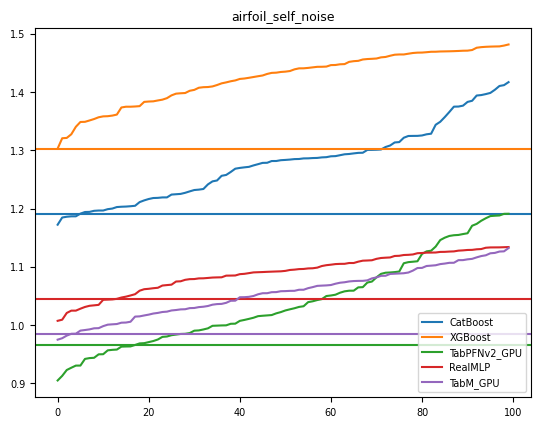

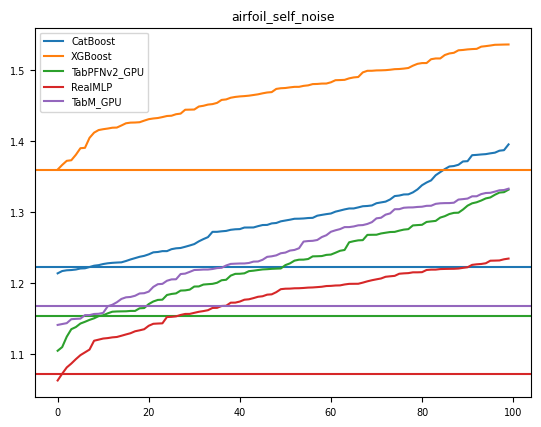

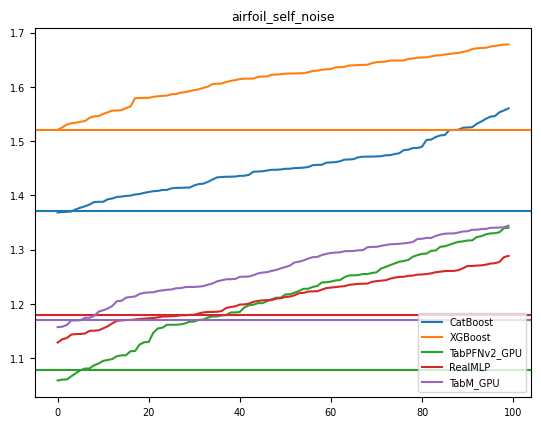

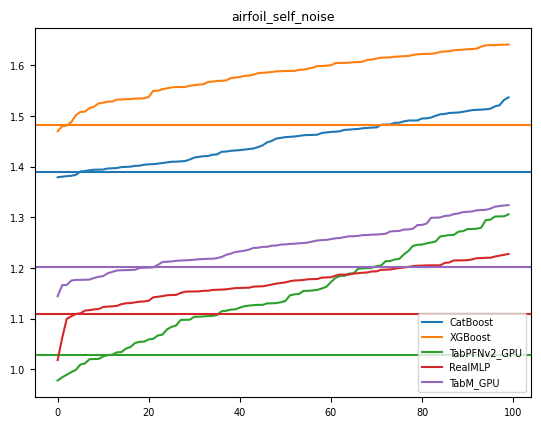

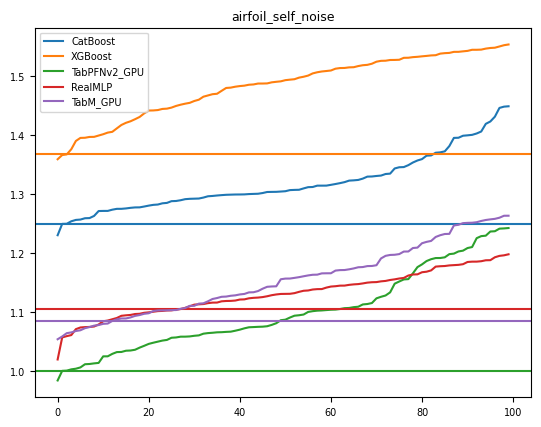

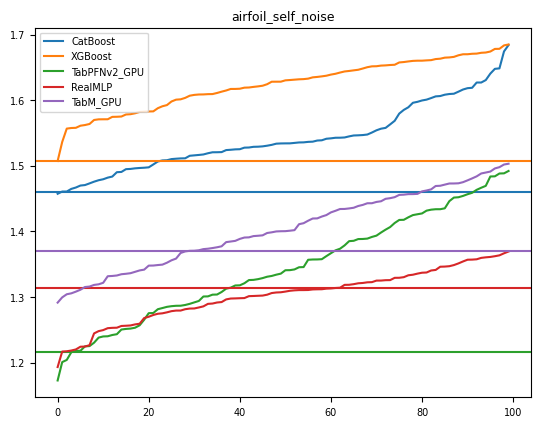

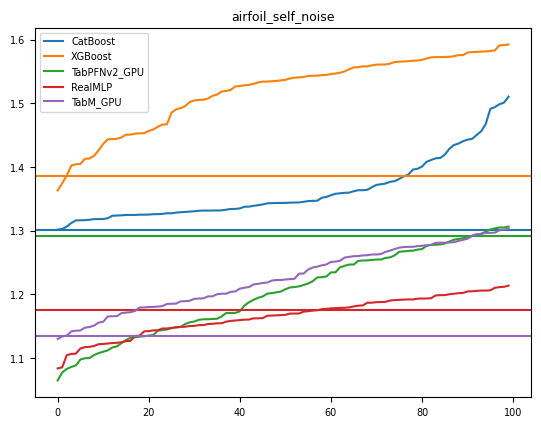

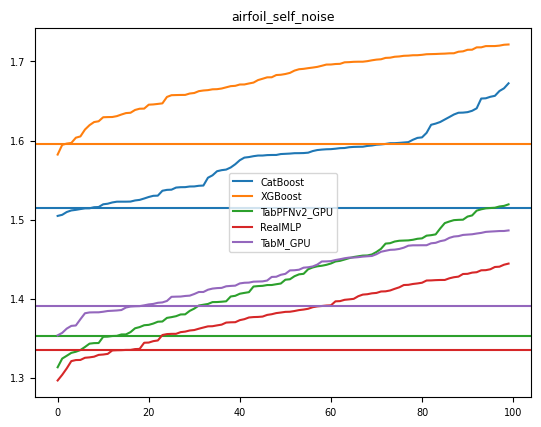

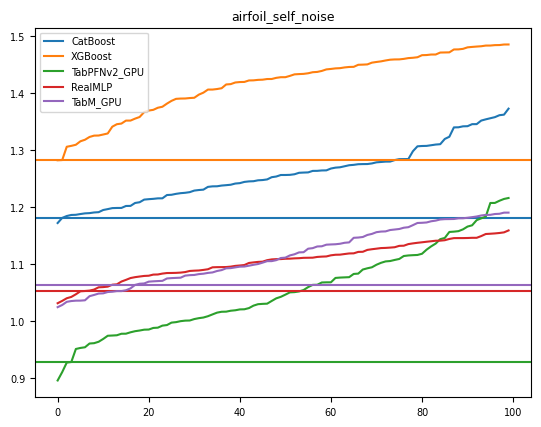

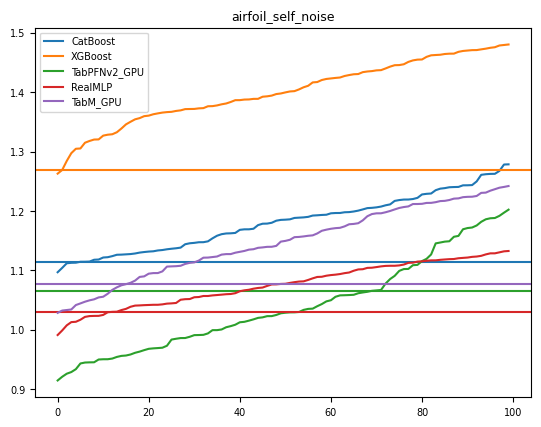

In [83]:
def plot_trial_performance(tids, 
                           model_names=['LightGBM', 'CatBoost', 'XGBoost', 'TabPFNv2_GPU', 'RealMLP', 'TabM_GPU'],
                           method = 'fold', # ['fold', 'average']
                           fold = 0,
                           ):
    for tid, did in zip(tids, dids):
        task = openml.tasks.get_task(tid)  # to check if the datasets are available
        data = openml.datasets.get_dataset(did)  # to check if the datasets are available
        for model_name in ['CatBoost', 'XGBoost', 'TabPFNv2_GPU', 'RealMLP', 'TabM_GPU']:
            res = tabarena_context.load_config_results(model_name)
            res = res.loc[res.dataset==data.name]
            # res = res.loc[res.fold==0]

            if method == 'average':
                perf = res.groupby('method')['metric_error'].mean()
                perf = perf.reset_index(drop=True)
                perf_val = res.groupby('method')['metric_error_val'].mean()
                perf_val = perf_val.reset_index(drop=True)
                line, = plt.plot(perf.sort_values().values[:100], label=model_name)
                col = line.get_color()
                plt.axhline(perf[perf_val.idxmin()], color=col)
            elif method == 'fold':
                res = res.loc[res.fold==fold]
                perf = pd.Series({method: res.loc[res.method==method, 'metric_error'].values[0] for method in res.method.unique()})
                perf = perf.reset_index(drop=True)
                line, = plt.plot(perf.sort_values().values[:100], label=model_name)
                col = line.get_color()
                plt.axhline(res.loc[res['metric_error_val'].idxmin(),'metric_error'], color=col)
        plt.title(data.name)
        plt.legend()
        plt.show()
for fold in range(10):
    plot_trial_performance(tids[:1], fold = fold)

In [53]:
res.groupby('method')['metric_error'].mean()

method
TabM_GPU_c1_BAG_L1      0.256350
TabM_GPU_r100_BAG_L1    0.255902
TabM_GPU_r101_BAG_L1    0.255230
TabM_GPU_r102_BAG_L1    0.257658
TabM_GPU_r103_BAG_L1    0.256675
                          ...   
TabM_GPU_r96_BAG_L1     0.257923
TabM_GPU_r97_BAG_L1     0.257566
TabM_GPU_r98_BAG_L1     0.256072
TabM_GPU_r99_BAG_L1     0.256647
TabM_GPU_r9_BAG_L1      0.256795
Name: metric_error, Length: 201, dtype: float64

In [ ]:
for tid, did in zip(tids, dids):
    task = openml.tasks.get_task(tid)  # to check if the datasets are available
    data = openml.datasets.get_dataset(did)  # to check if the datasets are available
    for model_name in ['CatBoost', 'XGBoost', 'TabPFNv2_GPU', 'RealMLP', 'TabM_GPU']:
        res = tabarena_context.load_config_results(model_name)
        res = res.loc[res.dataset==data.name]
        print(f"{data.name}|{model_name}: {res[['metric_error','metric_error_val']].corr('spearman').iloc[0,1]}")
        # res = res.loc[res.fold==0]

        best_by_val = res.loc[res['metric_error_val'].idxmin(),'metric_error']
        perf = res.groupby('method')['metric_error'].mean()
        perf = perf.reset_index(drop=True)
        perf_val = res.groupby('method')['metric_error_val'].mean()
        perf_val = perf_val.reset_index(drop=True)
        line, = plt.plot(perf.sort_values().values[:100], label=model_name)
        col = line.get_color()
        plt.axhline(perf[perf_val.idxmin()], color=col)

    plt.title(data.name)
    plt.legend()
    plt.show()
    

In [5]:
import openml
from tabprep.utils import get_benchmark_dataIDs
import pandas as pd

exp_name = 'catengineer'  

tids, dids = get_benchmark_dataIDs('TabArena')
perf_dict = {}
perf_dict_val = {}
final_perf_ta = {}
final_perf_rep = {}
repeat = 2
fold = 2
for tid, did in zip(tids, dids):
    task = openml.tasks.get_task(tid)  # to check if the datasets are available
    data = openml.datasets.get_dataset(did)  # to check if the datasets are available
    perf_dict[data.name] = {}
    perf_dict_val[data.name] = {}
    final_perf_rep[data.name] = {}
    final_perf_ta[data.name] = {}
    try:
        with open(f"../results/{exp_name}/data/LightGBM_c1_BAG_L1/{tid}/{repeat}_{fold}/results.pkl", "rb") as f:
            results = pd.read_pickle(f)
            perf_dict[data.name][f"LightGBM_c1_BAG_L1"] = results['metric_error']
        for r in range(1,200):
            with open(f"../results/{exp_name}/data/LightGBM_r{r}_BAG_L1/{tid}/{repeat}_{fold}/results.pkl", "rb") as f:
                results = pd.read_pickle(f)
                perf_dict[data.name][f"LightGBM_r{r}_BAG_L1"] = results['metric_error']
                perf_dict_val[data.name][f"LightGBM_r{r}_BAG_L1"] = results['metric_error_val']
    except FileNotFoundError:
        print(f"Results for {data.name} not found in ../results/{exp_name}/data/LightGBM_c1_BAG_L1/{tid}/{repeat}_{fold}/results.pkl")
        continue
    break

In [6]:
perf_dict


{'airfoil_self_noise': {'LightGBM_c1_BAG_L1': 1.353589955770648,
  'LightGBM_r1_BAG_L1': 3.935755310107325,
  'LightGBM_r2_BAG_L1': 4.64642607368015,
  'LightGBM_r3_BAG_L1': 2.0424871183778293,
  'LightGBM_r4_BAG_L1': 1.8157782316817137,
  'LightGBM_r5_BAG_L1': 4.555872999882091,
  'LightGBM_r6_BAG_L1': 1.6485975090775495,
  'LightGBM_r7_BAG_L1': 1.8668266921949697,
  'LightGBM_r8_BAG_L1': 2.03280875546647,
  'LightGBM_r9_BAG_L1': 1.864483252950626,
  'LightGBM_r10_BAG_L1': 2.7871959215022257,
  'LightGBM_r11_BAG_L1': 4.668052664229663,
  'LightGBM_r12_BAG_L1': 1.733030377900773,
  'LightGBM_r13_BAG_L1': 4.5889861181957174,
  'LightGBM_r14_BAG_L1': 1.864704674861363,
  'LightGBM_r15_BAG_L1': 3.1052759491935236,
  'LightGBM_r16_BAG_L1': 1.323343591315514,
  'LightGBM_r17_BAG_L1': 2.749000292776757,
  'LightGBM_r18_BAG_L1': 2.055453802166226,
  'LightGBM_r19_BAG_L1': 1.806617913105486,
  'LightGBM_r20_BAG_L1': 3.586809493446125,
  'LightGBM_r21_BAG_L1': 2.6489634606593357,
  'LightGBM_r2

In [19]:
for rep in range(3):
    for fold in range(3):

        print(fold+(3*rep))

0
1
2
3
4
5
6
7
8


In [24]:
results['task_metadata']['fold']+(3*results['task_metadata']['repeat'])

8

In [29]:
np.array(tids)

array([363612, 363613, 363614, 363615, 363616, 363618, 363619, 363620,
       363621, 363623, 363624, 363625, 363626, 363627, 363628, 363629,
       363630, 363631, 363632, 363671, 363672, 363673, 363674, 363675,
       363676, 363677, 363678, 363679, 363681, 363682, 363683, 363684,
       363685, 363686, 363689, 363691, 363693, 363694, 363696, 363697,
       363698, 363699, 363700, 363702, 363704, 363705, 363706, 363707,
       363708, 363711, 363712])

In [47]:
ta_results = tabarena_context.load_config_results('TabPFNv2_GPU')
res = ta_results.loc[ta_results.dataset==data.name]
res = res.loc[res['fold']==0]
res[['dataset', 'fold', 'method', 'metric_error', 'time_train_s',
       'time_infer_s', 'metric', 'problem_type', 'metric_error_val',
       'method_type', 'config_type', 'ta_name', 'ta_suite']]

,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,metric_error_val,method_type,config_type,ta_name,ta_suite
124218,jm1,0,TabPFNv2_GPU_c1_BAG_L1,0.250894,11.732800,0.909484,roc_auc,binary,0.273161,config,TABPFNV2_GPU,TabPFNv2_GPU,tabarena-2025-06-12
124219,jm1,0,TabPFNv2_GPU_r100_BAG_L1,0.238037,274.931417,38.546667,roc_auc,binary,0.252158,config,TABPFNV2_GPU,TabPFNv2_GPU,tabarena-2025-06-12
124220,jm1,0,TabPFNv2_GPU_r101_BAG_L1,0.248286,202.921378,25.351130,roc_auc,binary,0.260465,config,TABPFNV2_GPU,TabPFNv2_GPU,tabarena-2025-06-12
124221,jm1,0,TabPFNv2_GPU_r102_BAG_L1,0.238870,215.628611,33.861793,roc_auc,binary,0.254871,config,TABPFNV2_GPU,TabPFNv2_GPU,tabarena-2025-06-12
124222,jm1,0,TabPFNv2_GPU_r103_BAG_L1,0.240238,475.804826,58.940528,roc_auc,binary,0.254011,config,TABPFNV2_GPU,TabPFNv2_GPU,tabarena-2025-06-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
124414,jm1,0,TabPFNv2_GPU_r96_BAG_L1,0.243250,166.626076,19.557659,roc_auc,binary,0.246821,config,TABPFNV2_GPU,TabPFNv2_GPU,tabarena-2025-06-12
124415,jm1,0,TabPFNv2_GPU_r97_BAG_L1,0.247159,33.062046,3.932149,roc_auc,binary,0.263654,config,TABPFNV2_GPU,TabPFNv2_GPU,tabarena-2025-06-12
124416,jm1,0,TabPFNv2_GPU_r98_BAG_L1,0.245245,372.199589,43.376566,roc_auc,binary,0.251648,config,TABPFNV2_GPU,TabPFNv2_GPU,tabarena-2025-06-12
124417,jm1,0,TabPFNv2_GPU_r99_BAG_L1,0.239402,142.600175,17.592587,roc_auc,binary,0.254240,config,TABPFNV2_GPU,TabPFNv2_GPU,tabarena-2025-06-12


In [4]:
import openml
from tabprep.utils import get_benchmark_dataIDs
from tabrepo.nips2025_utils.tabarena_context import TabArenaContext
tabarena_context = TabArenaContext()

exp_name = 'numint'
repeats = 3
# use_datasets = ['hiva_agnostic', 'Bioresponse', 'kddcup09_appetency', 'MIC','Diabetes130US', 'anneal', 'qsar-biodeg']
trials = 200

tids, dids = get_benchmark_dataIDs('TabArena')
ta_results = tabarena_context.load_config_results('LightGBM')
new_entries = []
results_lst = []
for tid, did in zip(tids, dids):
    task = openml.tasks.get_task(tid)  # to check if the datasets are available
    data = openml.datasets.get_dataset(did)  # to check if the datasets are available
    # if data.name not in use_datasets:
    #     continue
    for repeat in range(repeats):
        for fold in range(3):
            new_res_found = False
            try:
                path = f"../results/{exp_name}/data/LightGBM_c1_BAG_L1/{tid}/{repeat}_{fold}/results.pkl"
                with open(path, "rb") as f:
                    results = pd.read_pickle(f)
                    new_entry = pd.Series({
                        'dataset': results['task_metadata']['name'],
                        'fold': results['task_metadata']['fold']+(3*results['task_metadata']['repeat']),
                        'method': results['framework'],
                        'metric_error': float(results['metric_error']),
                        'time_train_s': float(results['time_train_s']),
                        'time_infer_s': float(results['time_infer_s']),
                        'metric': results['metric'],
                        'problem_type': results['problem_type'],
                        'metric_error_val': float(results['metric_error_val']),
                        'method_type': 'config',
                        'config_type': results['framework'].split('_')[0]+'(CSV)',
                        'ta_name': 'CSV',
                        'ta_suite': 'CSV',
                    })
                    new_entries.append(new_entry)
                    results['framework'] += 'CSV'
                    results_lst.append(results)
                    new_res_found = True

                for r in range(1,trials+1):
                    path = f"../results/{exp_name}/data/LightGBM_r{r}_BAG_L1/{tid}/{repeat}_{fold}/results.pkl"
                    with open(path, "rb") as f:
                        results = pd.read_pickle(f)
                        new_entry = pd.Series({
                            'dataset': results['task_metadata']['name'],
                            'fold': results['task_metadata']['fold']+(3*results['task_metadata']['repeat']),
                            'method': results['framework'],
                            'metric_error': results['metric_error'],
                            'time_train_s': results['time_train_s'],
                            'time_infer_s': results['time_infer_s'],
                            'metric': results['metric'],
                            'problem_type': results['problem_type'],
                            'metric_error_val': results['metric_error_val'],
                            'method_type': 'config',
                            'config_type': results['framework'].split('_')[0]+'(CSV)',
                            'ta_name': 'CSV',
                            'ta_suite': 'CSV',
                        })
                        new_entries.append(new_entry)
                        results['framework'] += 'CSV'
                        results_lst.append(results)
                        new_res_found = True

            except FileNotFoundError:
                print(f"Results for {data.name} at {path} not found. Fill with TabArena results.")
                # res = ta_results.loc[ta_results.dataset==data.name]
                # res.loc[res.groupby('fold')['metric_error_val'].idxmin(), 'metric_error'].mean()
            if not new_res_found:
                rep_fold = fold+(3*repeat)
                res = ta_results.loc[ta_results.dataset==data.name]
                res = res.loc[res['fold']==rep_fold]
                new_entry = res[['dataset', 'fold', 'method', 'metric_error', 'time_train_s',
                    'time_infer_s', 'metric', 'problem_type', 'metric_error_val',
                    'method_type', 'config_type', 'ta_name', 'ta_suite']]
                new_entry.loc[:, 'config_type'] = new_entry['method'].apply(lambda x: x.split('_')[0] + '(CSV)')
                new_entry.loc[:, 'ta_name'] = 'CSV'
                new_entry.loc[:, 'ta_suite'] = 'CSV'
                new_entries += [new_entry.loc[i] for i in new_entry.index]
model_results = pd.concat(new_entries, ignore_index=True,axis=1).T
model_results

/home/ubuntu/anaconda3/envs/tabprep/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-08-05 22:37:13,944	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Results for airfoil_self_noise at ../results/numint/data/LightGBM_r200_BAG_L1/363612/0_0/results.pkl not found. Fill with TabArena results.
Results for airfoil_self_noise at ../results/numint/data/LightGBM_r200_BAG_L1/363612/0_1/results.pkl not found. Fill with TabArena results.
Results for airfoil_self_noise at ../results/numint/data/LightGBM_r200_BAG_L1/363612/0_2/results.pkl not found. Fill with TabArena results.
Results for airfoil_self_noise at ../results/numint/data/LightGBM_r200_BAG_L1/363612/1_0/results.pkl not found. Fill with TabArena results.
Results for airfoil_self_noise at ../results/numint/data/LightGBM_r200_BAG_L1/363612/1_1/results.pkl not found. Fill with TabArena results.
Results for airfoil_self_noise at ../results/numint/data/LightGBM_r200_BAG_L1/363612/1_2/results.pkl not found. Fill with TabArena results.
Results for airfoil_self_noise at ../results/numint/data/LightGBM_r200_BAG_L1/363612/2_0/results.pkl not found. Fill with TabArena results.
Results for airfoil_

,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,metric_error_val,method_type,config_type,ta_name,ta_suite
0,airfoil_self_noise,0,LightGBM_c1_BAG_L1,1.608522,12.558299,0.944866,rmse,regression,1.902661,config,LightGBM(CSV),CSV,CSV
1,airfoil_self_noise,0,LightGBM_r1_BAG_L1,2.916654,5.880078,0.895405,rmse,regression,3.148063,config,LightGBM(CSV),CSV,CSV
2,airfoil_self_noise,0,LightGBM_r2_BAG_L1,3.780259,4.944783,0.291733,rmse,regression,3.83465,config,LightGBM(CSV),CSV,CSV
3,airfoil_self_noise,0,LightGBM_r3_BAG_L1,1.675458,7.238402,1.068615,rmse,regression,2.007029,config,LightGBM(CSV),CSV,CSV
4,airfoil_self_noise,0,LightGBM_r4_BAG_L1,1.637191,7.275203,0.98952,rmse,regression,1.930014,config,LightGBM(CSV),CSV,CSV
...,...,...,...,...,...,...,...,...,...,...,...,...,...
91795,jm1,8,LightGBM_r195_BAG_L1,0.253318,251.196549,1.401841,roc_auc,binary,0.262808,config,LightGBM(CSV),CSV,CSV
91796,jm1,8,LightGBM_r196_BAG_L1,0.236322,672.108088,0.948989,roc_auc,binary,0.245961,config,LightGBM(CSV),CSV,CSV
91797,jm1,8,LightGBM_r197_BAG_L1,0.242772,398.27873,1.23929,roc_auc,binary,0.248022,config,LightGBM(CSV),CSV,CSV
91798,jm1,8,LightGBM_r198_BAG_L1,0.24541,271.018795,1.150972,roc_auc,binary,0.254755,config,LightGBM(CSV),CSV,CSV


In [3]:
model_results

,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,metric_error_val,method_type,config_type,ta_name,ta_suite
0,airfoil_self_noise,0,LightGBM_c1_BAG_L1,1.480939,13.610598,1.442351,rmse,regression,1.645666,config,LightGBM(CSV),CSV,CSV
1,airfoil_self_noise,0,LightGBM_r1_BAG_L1,4.12351,6.914768,0.763892,rmse,regression,4.279381,config,LightGBM(CSV),CSV,CSV
2,airfoil_self_noise,0,LightGBM_r2_BAG_L1,4.558797,5.801075,0.124035,rmse,regression,4.703179,config,LightGBM(CSV),CSV,CSV
3,airfoil_self_noise,0,LightGBM_r3_BAG_L1,1.977664,8.675381,1.25643,rmse,regression,2.33634,config,LightGBM(CSV),CSV,CSV
4,airfoil_self_noise,0,LightGBM_r4_BAG_L1,1.788038,8.582732,1.206042,rmse,regression,2.054566,config,LightGBM(CSV),CSV,CSV
...,...,...,...,...,...,...,...,...,...,...,...,...,...
91795,jm1,8,LightGBM_r195_BAG_L1,0.262172,7.180384,0.438957,roc_auc,binary,0.270232,config,LightGBM(CSV),CSV,CSV
91796,jm1,8,LightGBM_r196_BAG_L1,0.248854,7.807618,0.150247,roc_auc,binary,0.25761,config,LightGBM(CSV),CSV,CSV
91797,jm1,8,LightGBM_r197_BAG_L1,0.254908,6.974319,0.535029,roc_auc,binary,0.259524,config,LightGBM(CSV),CSV,CSV
91798,jm1,8,LightGBM_r198_BAG_L1,0.259176,5.938135,0.245482,roc_auc,binary,0.264139,config,LightGBM(CSV),CSV,CSV


In [8]:
model_results.method.unique().shape

(200,)

In [7]:
ta_results = tabarena_context.load_config_results('LightGBM')
ta_results.method.unique().shape

(201,)

In [5]:
tabarena_context.load_config_results('LightGBM')['fold'].max()

29

In [21]:
model_results.groupby('dataset')['fold'].count()

dataset
Bioresponse           603
Diabetes130US         603
MIC                   603
anneal                603
hiva_agnostic         603
kddcup09_appetency    603
qsar-biodeg           603
Name: fold, dtype: int64

In [13]:
model_results.loc[model_results.groupby(['dataset', 'fold']).apply(lambda x: x['metric_error_val'].idxmin()).values]

/tmp/ipykernel_284230/1042537259.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  model_results.loc[model_results.groupby(['dataset', 'fold']).apply(lambda x: x['metric_error_val'].idxmin()).values]


,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,metric_error_val,method_type,config_type,ta_name,ta_suite
7259,APSFailure,0,LightGBM_r59_BAG_L1,0.005129,53.184672,1.877129,roc_auc,binary,0.009876,config,LightGBM(CSV),CSV,CSV
7419,APSFailure,1,LightGBM_r19_BAG_L1,0.010135,206.184519,17.130649,roc_auc,binary,0.006104,config,LightGBM(CSV),CSV,CSV
7626,APSFailure,2,LightGBM_r26_BAG_L1,0.008239,22.074436,0.53996,roc_auc,binary,0.007444,config,LightGBM(CSV),CSV,CSV
7948,APSFailure,3,LightGBM_r148_BAG_L1,0.011388,125.242116,5.067109,roc_auc,binary,0.005881,config,LightGBM(CSV),CSV,CSV
8058,APSFailure,4,LightGBM_r58_BAG_L1,0.006847,40.062384,1.087757,roc_auc,binary,0.009194,config,LightGBM(CSV),CSV,CSV
...,...,...,...,...,...,...,...,...,...,...,...,...,...
87346,wine_quality,4,LightGBM_r163_BAG_L1,0.571678,19.457855,2.597998,rmse,regression,0.63378,config,LightGBM(CSV),CSV,CSV
87546,wine_quality,5,LightGBM_r163_BAG_L1,0.603867,12.984742,1.939395,rmse,regression,0.623331,config,LightGBM(CSV),CSV,CSV
87746,wine_quality,6,LightGBM_r163_BAG_L1,0.598267,20.136209,2.877541,rmse,regression,0.621957,config,LightGBM(CSV),CSV,CSV
87946,wine_quality,7,LightGBM_r163_BAG_L1,0.629099,11.511501,1.902189,rmse,regression,0.616685,config,LightGBM(CSV),CSV,CSV


In [ ]:
default['method'] = 'LightGBM(CSV)'
default['config_type'] = 'default'

,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,metric_error_val,method_type,config_type,ta_name,ta_suite
0,airfoil_self_noise,0,LightGBM_c1_BAG_L1,1.524684,12.857257,1.280079,rmse,regression,1.805879,config,LightGBM(CSV),CSV,CSV
200,airfoil_self_noise,1,LightGBM_c1_BAG_L1,1.533426,9.415721,0.574364,rmse,regression,1.797918,config,LightGBM(CSV),CSV,CSV
400,airfoil_self_noise,2,LightGBM_c1_BAG_L1,1.605573,11.284406,0.748883,rmse,regression,1.650773,config,LightGBM(CSV),CSV,CSV
600,airfoil_self_noise,3,LightGBM_c1_BAG_L1,1.602593,13.165989,0.919916,rmse,regression,1.631519,config,LightGBM(CSV),CSV,CSV
800,airfoil_self_noise,4,LightGBM_c1_BAG_L1,1.590215,12.260588,0.572537,rmse,regression,1.752095,config,LightGBM(CSV),CSV,CSV
...,...,...,...,...,...,...,...,...,...,...,...,...,...
91124,jm1,4,LightGBM_c1_BAG_L1,0.248098,8.776767,0.25952,roc_auc,binary,0.255623,config,LightGBM(CSV),CSV,CSV
91324,jm1,5,LightGBM_c1_BAG_L1,0.254691,8.844761,0.222423,roc_auc,binary,0.257504,config,LightGBM(CSV),CSV,CSV
91524,jm1,6,LightGBM_c1_BAG_L1,0.2529,8.838746,0.188236,roc_auc,binary,0.257097,config,LightGBM(CSV),CSV,CSV
91724,jm1,7,LightGBM_c1_BAG_L1,0.249731,8.757392,0.330665,roc_auc,binary,0.257536,config,LightGBM(CSV),CSV,CSV


In [9]:
default = model_results.loc[model_results['method'].apply(lambda x: 'c1' in x)]
default['method'] = 'LightGBM(CSV)'
default['config_type'] = 'default'
tuned = model_results.loc[model_results.groupby(['dataset', 'fold']).apply(lambda x: x['metric_error_val'].idxmin()).values]
tuned['method'] = 'LightGBM(CSV)'
tuned['config_type'] = 'tuned'
tuned_ensemble = model_results.loc[model_results.groupby(['dataset', 'fold']).apply(lambda x: x['metric_error_val'].idxmin()).values]
tuned_ensemble['method'] = 'LightGBM(CSV)'
tuned_ensemble['config_type'] = 'tuned + ensemble'

/tmp/ipykernel_902634/1133380496.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  default['method'] = 'LightGBM(CSV)'
/tmp/ipykernel_902634/1133380496.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  default['config_type'] = 'default'
/tmp/ipykernel_902634/1133380496.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False`

In [10]:
dataset_name = 'maternal_health_risk'
for dataset_name in model_results.dataset.unique():
    ta_results = tabarena_context.load_config_results('LightGBM')
    my = model_results.loc[model_results.dataset==dataset_name]
    ta = ta_results.loc[ta_results.dataset==dataset_name]
    merged = pd.merge(my, ta, on=['dataset', 'fold', 'method'], suffixes=('_my', '_ta'))
    merged[['fold','method', 'metric_error_my', 'metric_error_ta']]
    print(dataset_name, sum(merged[['metric_error_my', 'metric_error_ta']].diff(axis=1).iloc[:,1]>0))

airfoil_self_noise 1326
Amazon_employee_access 0
anneal 550
Another-Dataset-on-used-Fiat-500 1257
APSFailure 0
bank-marketing 390
Bank_Customer_Churn 158
Bioresponse 1444
blood-transfusion-service-center 996
churn 1423
coil2000_insurance_policies 365
concrete_compressive_strength 1117
credit-g 459
credit_card_clients_default 1713
customer_satisfaction_in_airline 124
diabetes 454
Diabetes130US 918
diamonds 590
E-CommereShippingData 1127
Fitness_Club 900
Food_Delivery_Time 1800
GiveMeSomeCredit 1335
hazelnut-spread-contaminant-detection 1709
healthcare_insurance_expenses 562
heloc 513
hiva_agnostic 0
houses 1378
HR_Analytics_Job_Change_of_Data_Scientists 222
in_vehicle_coupon_recommendation 0
Is-this-a-good-customer 202
kddcup09_appetency 1163
Marketing_Campaign 484
maternal_health_risk 1649
miami_housing 610
NATICUSdroid 0
online_shoppers_intention 905
physiochemical_protein 1793
polish_companies_bankruptcy 1800
qsar-biodeg 1424
QSAR-TID-11 0
QSAR_fish_toxicity 1341
SDSS17 1800
seismic-

In [ ]:
ta_results = tabarena_context.load_config_results('LightGBM')
ta_results = ta_results[ta_results.fold<=8]
ta_default = ta_results.loc[ta_results['method'].apply(lambda x: 'default' in x)]
ta_default['method'] = 'LightGBM'
ta_default['config_type'] = 'default'
ta_tuned = ta_results.loc[ta_results.groupby(['dataset', 'fold']).apply(lambda x: x['metric_error_val'].idxmin()).values]
ta_tuned['method'] = 'LightGBM'
ta_tuned['config_type'] = 'tuned'
ta_tuned_ensemble = ta_results.loc[ta_results.groupby(['dataset', 'fold']).apply(lambda x: x['metric_error_val'].idxmin()).values]
ta_tuned_ensemble['method'] = 'LightGBM'
ta_tuned_ensemble['config_type'] = 'tuned + ensemble'

/tmp/ipykernel_902634/2554396885.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ta_tuned = ta_results.loc[ta_results.groupby(['dataset', 'fold']).apply(lambda x: x['metric_error_val'].idxmin()).values]
/tmp/ipykernel_902634/2554396885.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ta_tuned_ensemble = ta_results.loc[ta_results.groupby(['dataset', 'fold']).apply(lambda x: x['metric_error_val'].idxmi

In [26]:
ag_results = tabarena_context.load_config_results('AutoGluon_v130')
ag_results = ag_results[ag_results.fold<=8]
# ag_tuned_ensemble = ag_results.loc[ag_results.groupby(['dataset', 'fold']).apply(lambda x: x['metric_error_val'].idxmin()).values]
# ag_tuned_ensemble['method'] = 'AutoGluon'
# ag_tuned_ensemble['config_type'] = 'tuned + ensemble'

In [27]:
ag_results

,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,imputed,impute_method,method_type,ta_name,ta_suite
0,APSFailure,0,AutoGluon_v130_bq_4h8c,0.004791,14414.006750,33.704226,roc_auc,binary,False,None,baseline,AutoGluon_v130,tabarena-2025-06-12
1,APSFailure,1,AutoGluon_v130_bq_4h8c,0.008902,14421.498477,139.436083,roc_auc,binary,False,None,baseline,AutoGluon_v130,tabarena-2025-06-12
2,APSFailure,2,AutoGluon_v130_bq_4h8c,0.007348,14402.326607,134.433559,roc_auc,binary,False,None,baseline,AutoGluon_v130,tabarena-2025-06-12
3,APSFailure,3,AutoGluon_v130_bq_4h8c,0.010776,14839.043385,29.852961,roc_auc,binary,False,None,baseline,AutoGluon_v130,tabarena-2025-06-12
4,APSFailure,4,AutoGluon_v130_bq_4h8c,0.005168,14408.018702,147.060918,roc_auc,binary,False,None,baseline,AutoGluon_v130,tabarena-2025-06-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
811,wine_quality,4,AutoGluon_v130_bq_4h8c,0.562474,6958.436579,12.626278,rmse,regression,False,None,baseline,AutoGluon_v130,tabarena-2025-06-12
812,wine_quality,5,AutoGluon_v130_bq_4h8c,0.591714,6701.988835,8.041703,rmse,regression,False,None,baseline,AutoGluon_v130,tabarena-2025-06-12
813,wine_quality,6,AutoGluon_v130_bq_4h8c,0.593223,6740.717545,8.198749,rmse,regression,False,None,baseline,AutoGluon_v130,tabarena-2025-06-12
814,wine_quality,7,AutoGluon_v130_bq_4h8c,0.622929,7161.099234,6.688873,rmse,regression,False,None,baseline,AutoGluon_v130,tabarena-2025-06-12


In [32]:
comp_df = pd.concat([
    ag_results.groupby('dataset')['metric_error'].mean(),
    ta_tuned.groupby('dataset')['metric_error'].mean(),
    tuned.groupby('dataset')['metric_error'].mean()],axis=1)
    # ta_default.groupby('dataset')['metric_error'].mean(),
    # default.groupby('dataset')['metric_error'].mean()
comp_df.columns = ['AutoGluon', 'TabArena', 'New']
comp_df.style.highlight_min(axis=1)

,AutoGluon,TabArena,New
dataset,,,
APSFailure,0.007370,0.007986,0.007986
Amazon_employee_access,0.118243,0.149974,0.149974
Another-Dataset-on-used-Fiat-500,729.674666,743.759538,738.098988
Bank_Customer_Churn,0.131187,0.133547,0.135229
Bioresponse,0.122390,0.125649,0.125269
Diabetes130US,0.326668,0.332262,0.340271
E-CommereShippingData,0.262409,0.259963,0.254860
Fitness_Club,0.186617,0.183952,0.186882
Food_Delivery_Time,7.362037,7.378250,7.225764


In [26]:
comp_df = pd.concat([
    ta_tuned.groupby('dataset')['metric_error'].mean(),
    tuned.groupby('dataset')['metric_error'].mean()],axis=1)
comp_df.diff(axis=1).iloc[:,1]

dataset
APSFailure                                       0.000305
Amazon_employee_access                          -0.009417
Another-Dataset-on-used-Fiat-500                12.476962
Bank_Customer_Churn                              0.000579
Bioresponse                                      0.000858
Diabetes130US                                    0.006171
E-CommereShippingData                            0.001154
Fitness_Club                                     0.000743
Food_Delivery_Time                                  0.003
GiveMeSomeCredit                                 0.000153
HR_Analytics_Job_Change_of_Data_Scientists       0.001055
Is-this-a-good-customer                          0.010184
MIC                                             -0.004087
Marketing_Campaign                              -0.004159
NATICUSdroid                                     0.000022
QSAR-TID-11                                      0.002293
QSAR_fish_toxicity                               0.006863
SDSS17

In [25]:
comp_df.diff(axis=1).iloc[:,1]

dataset
APSFailure                                       0.000305
Amazon_employee_access                          -0.009417
Another-Dataset-on-used-Fiat-500                12.476962
Bank_Customer_Churn                              0.000579
Bioresponse                                      0.000858
Diabetes130US                                    0.006171
E-CommereShippingData                            0.001154
Fitness_Club                                     0.000743
Food_Delivery_Time                                  0.003
GiveMeSomeCredit                                 0.000153
HR_Analytics_Job_Change_of_Data_Scientists       0.001055
Is-this-a-good-customer                          0.010184
MIC                                             -0.004087
Marketing_Campaign                              -0.004159
NATICUSdroid                                     0.000022
QSAR-TID-11                                      0.002293
QSAR_fish_toxicity                               0.006863
SDSS17

In [54]:
pd.concat([default, tuned, tuned_ensemble], ignore_index=True)

,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,metric_error_val,method_type,config_type,ta_name,ta_suite
0,airfoil_self_noise,0,LightGBM(CSV),1.524684,12.857257,1.280079,rmse,regression,1.805879,config,default,CSV,CSV
1,airfoil_self_noise,1,LightGBM(CSV),1.533426,9.415721,0.574364,rmse,regression,1.797918,config,default,CSV,CSV
2,airfoil_self_noise,2,LightGBM(CSV),1.605573,11.284406,0.748883,rmse,regression,1.650773,config,default,CSV,CSV
3,airfoil_self_noise,3,LightGBM(CSV),1.602593,13.165989,0.919916,rmse,regression,1.631519,config,default,CSV,CSV
4,airfoil_self_noise,4,LightGBM(CSV),1.590215,12.260588,0.572537,rmse,regression,1.752095,config,default,CSV,CSV
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1372,wine_quality,4,LightGBM(CSV),0.571296,20.354512,3.775377,rmse,regression,0.632795,config,tuned + ensemble,CSV,CSV
1373,wine_quality,5,LightGBM(CSV),0.60399,11.679828,1.618322,rmse,regression,0.622926,config,tuned + ensemble,CSV,CSV
1374,wine_quality,6,LightGBM(CSV),0.598805,20.305549,3.283659,rmse,regression,0.622544,config,tuned + ensemble,CSV,CSV
1375,wine_quality,7,LightGBM(CSV),0.628389,12.277495,2.165851,rmse,regression,0.615838,config,tuned + ensemble,CSV,CSV


In [8]:
model_results[['metric_error', 'time_train_s', 'time_infer_s', 'metric_error_val']] = model_results[['metric_error', 'time_train_s', 'time_infer_s', 'metric_error_val']].astype(float)
model_results['method'] = model_results['method'].apply(lambda x: '_'.join([x.split('_')[0]+'(CSV)']+x.split('_')[1:]))
hpo_results = model_results.copy()
hpo_results['method_subtype'] = 'default'

In [69]:
default = model_results.loc[model_results['method'].apply(lambda x: 'c1' in x)]
default.loc[:, 'method'] = 'LightGBM(CSV)'
default.loc[:, 'config_type'] = 'default'
tuned = model_results.loc[model_results.groupby(['dataset', 'fold']).apply(lambda x: x['metric_error_val'].idxmin(), include_groups=False).values]
tuned.loc[:, 'method'] = 'LightGBM(CSV)'
tuned.loc[:, 'config_type'] = 'tuned'
tuned_ensemble = model_results.loc[model_results.groupby(['dataset', 'fold']).apply(lambda x: x['metric_error_val'].idxmin(), include_groups=False).values]
tuned_ensemble.loc[:, 'method'] = 'LightGBM(CSV)'
tuned_ensemble.loc[:, 'config_type'] = 'tuned + ensemble'

hpo_results = pd.concat([default, tuned, tuned_ensemble], ignore_index=True)
# hpo_results['method_subtype'] = hpo_results['config_type']
hpo_results[['metric_error', 'time_train_s', 'time_infer_s', 'metric_error_val']] = hpo_results[['metric_error', 'time_train_s', 'time_infer_s', 'metric_error_val']].astype(float)

In [71]:
hpo_results

,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,metric_error_val,method_type,config_type,ta_name,ta_suite
0,airfoil_self_noise,0,LightGBM(CSV),1.524684,12.857257,1.280079,rmse,regression,1.805879,config,default,CSV,CSV
1,airfoil_self_noise,1,LightGBM(CSV),1.533426,9.415721,0.574364,rmse,regression,1.797918,config,default,CSV,CSV
2,airfoil_self_noise,2,LightGBM(CSV),1.605573,11.284406,0.748883,rmse,regression,1.650773,config,default,CSV,CSV
3,airfoil_self_noise,3,LightGBM(CSV),1.602593,13.165989,0.919916,rmse,regression,1.631519,config,default,CSV,CSV
4,airfoil_self_noise,4,LightGBM(CSV),1.590215,12.260588,0.572537,rmse,regression,1.752095,config,default,CSV,CSV
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1372,wine_quality,4,LightGBM(CSV),0.571296,20.354512,3.775377,rmse,regression,0.632795,config,tuned + ensemble,CSV,CSV
1373,wine_quality,5,LightGBM(CSV),0.603990,11.679828,1.618322,rmse,regression,0.622926,config,tuned + ensemble,CSV,CSV
1374,wine_quality,6,LightGBM(CSV),0.598805,20.305549,3.283659,rmse,regression,0.622544,config,tuned + ensemble,CSV,CSV
1375,wine_quality,7,LightGBM(CSV),0.628389,12.277495,2.165851,rmse,regression,0.615838,config,tuned + ensemble,CSV,CSV


In [70]:
from tabrepo.nips2025_utils.end_to_end import EndToEndResults
end_to_end_results = EndToEndResults(method_metadata=None, model_results=model_results, hpo_results=hpo_results)
leaderboard = end_to_end_results.compare_on_tabarena(output_dir='figures/')
print(leaderboard)

Model for which results were imputed: ['TabPFNv2', 'LightGBM(CSV)', 'TabICL']
Unused columns: ['impute_method', 'method_type', 'ta_name', 'ta_suite', 'metric_error_val', 'config_selected', 'seed', 'method_metadata', 'ensemble_weight', 'method_subtype', 'config_type', 'normalized-error-dataset']


bootstrap: 100%|██████████| 100/100 [00:13<00:00,  7.52it/s]


Evaluating with 51 datasets... | problem_types=None, folds=None
                             method  time_train_s  time_infer_s  time_train_s_per_1K  time_infer_s_per_1K  normalized-error  normalized-error-task   imputed  champ_delta  loss_rescaled  time_train_s_rescaled  time_infer_s_rescaled       rank  median_metric_error  median_time_train_s  median_time_infer_s  median_time_train_s_per_1K  median_time_infer_s_per_1K  median_normalized-error  median_normalized-error-task  median_imputed  median_champ_delta  median_loss_rescaled  median_time_train_s_rescaled  median_time_infer_s_rescaled  median_rank  rank=1_count  rank=2_count  rank=3_count  rank>3_count     elo  elo+  elo-   winrate       mrr
0                AutoGluon 1.3 (4h)   8462.983490     33.138287          2912.124292             4.391016          0.383409               0.393800  0.000000     0.058227       0.038656           43301.569733             539.396907   8.411765              0.20550          7367.614226          

In [17]:
from tabrepo.nips2025_utils.fetch_metadata import load_task_metadata
task_metadata = load_task_metadata()
experiment_results = ExperimentResults(task_metadata=task_metadata)

# Convert the run artifacts into an EvaluationRepository
repo: EvaluationRepository = experiment_results.repo_from_results(results_lst=results_lst)
repo.print_info()

KeyError: 'LightGBM_c1_BAG_L1CSV'

In [14]:
from tabrepo.nips2025_utils.fetch_metadata import load_task_metadata
task_metadata = load_task_metadata()
experiment_results = ExperimentResults(task_metadata=task_metadata)

# Convert the run artifacts into an EvaluationRepository
repo: EvaluationRepository = experiment_results.repo_from_results(results_lst=results_lst)
repo.print_info()

repo.to_dir(path=repo_dir)  # Load the repo later via `EvaluationRepository.from_dir(repo_dir)`

print(f"New Configs Hyperparameters: {repo.configs_hyperparameters()}")

# get the local results
evaluator = Evaluator(repo=repo)
metrics: pd.DataFrame = evaluator.compare_metrics().reset_index().rename(columns={"framework": "method"})

# load the TabArena paper results
tabarena_results: pd.DataFrame = load_results()
tabarena_results = tabarena_results[[c for c in tabarena_results.columns if c in metrics.columns]]

dataset_fold_map = metrics.groupby("dataset")["fold"].apply(set)

def is_in(dataset: str, fold: int) -> bool:
    return (dataset in dataset_fold_map.index) and (fold in dataset_fold_map.loc[dataset])

# filter tabarena_results to only the dataset, fold pairs that are present in `metrics`
is_in_lst = [is_in(dataset, fold) for dataset, fold in zip(tabarena_results["dataset"], tabarena_results["fold"])]
tabarena_results = tabarena_results[is_in_lst]

metrics = pd.concat([
    metrics,
    tabarena_results,
], ignore_index=True)

res_df = pd.DataFrame({dat: {method: np.mean(metrics.loc[np.logical_and(metrics.dataset==dat, metrics.method==method), "metric_error"].values) for method in metrics.method.unique()} for dat in metrics.dataset.unique()}).transpose()
print(res_df.transpose())
# if new_model_name in ["RealMLP", "RealMLP_priordetect", "RealMLP-original"]:
#     print(res_df[[f"{new_model_name}", "REALMLP (default)",  "AutoGluon 1.3 (4h)",  "CAT (default)"]])
# elif new_model_name in ["TabM", "TabM_priordetect", "TabM-original"]:
#     print(res_df[[f"{new_model_name}", "TABM (default)",  "AutoGluon 1.3 (4h)",  "CAT (default)"]])
# elif new_model_name in ["LightGBM", "LightGBM_priordetect", "LightGBM-original"]:
#     print(res_df[[f"{new_model_name}", "GBM (default)",  "AutoGluon 1.3 (4h)",  "CAT (default)"]])
# elif new_model_name in ["CatBoost", "CatBoost_priordetect", "CatBoost-original"]:
#     print(res_df[[f"{new_model_name}", "CAT (default)",  "AutoGluon 1.3 (4h)",  "TABM (default)"]])

with pd.option_context("display.max_rows", None, "display.max_columns", None, "display.width", 1000):
    print(f"Results:\n{metrics.head(100)}")

calibration_framework = "RF (default)"

from tabrepo.tabarena.tabarena import TabArena
tabarena = TabArena(
    method_col="method",
    task_col="dataset",
    seed_column="fold",
    error_col="metric_error",
    columns_to_agg_extra=[
        "time_train_s",
        "time_infer_s",
    ],
    groupby_columns=[
        "metric",
        "problem_type",
    ]
)

leaderboard = tabarena.leaderboard(
    data=metrics,
    include_elo=True if configs['benchmark']['name'] == "TabArena" else False,
    elo_kwargs={
        "calibration_framework": calibration_framework,
    },
)

with pd.option_context("display.max_rows", None, "display.max_columns", None, "display.width", 1000):
    print(leaderboard)




KeyboardInterrupt: 

In [10]:
leaderboard

,method,time_train_s,time_infer_s,time_train_s_per_1K,time_infer_s_per_1K,normalized-error,normalized-error-task,imputed,champ_delta,loss_rescaled,...,median_rank,rank=1_count,rank=2_count,rank=3_count,rank>3_count,elo,elo+,elo-,winrate,mrr
0,AutoGluon 1.3 (4h),8462.983490,33.138287,2912.124292,4.391016,0.226954,0.393800,0.000000,0.058227,0.038656,...,5.0,8,6,2,35,1589.7,23.3,27.4,0.831551,0.324350
1,REALMLP (tuned + ensemble),82918.859382,50.755388,8669.653795,17.385571,0.253900,0.489805,0.000000,0.066265,0.044290,...,7.0,0,5,4,42,1564.6,27.5,23.0,0.814840,0.176888
2,TABM_GPU (tuned + ensemble),36462.583371,8.791583,5017.258422,3.180206,0.302094,0.523405,0.000000,0.069770,0.063418,...,8.0,3,2,3,43,1543.9,26.8,21.9,0.798351,0.205996
3,GBM (tuned + ensemble),3088.283495,22.058381,771.292509,4.080657,0.310162,0.569759,0.000000,0.085576,0.059109,...,10.0,1,1,2,47,1526.2,23.7,23.4,0.781194,0.152001
4,CAT (tuned + ensemble),20021.349803,3.148215,4130.291159,0.979241,0.314217,0.576254,0.000000,0.079329,0.052771,...,11.0,0,1,4,46,1484.5,18.5,25.4,0.741533,0.121468
5,CAT (tuned),20021.349803,0.459181,4130.291159,0.132693,0.324384,0.589755,0.000000,0.081235,0.053451,...,12.5,1,3,2,45,1470.5,17.3,22.3,0.728164,0.143760
6,TABM_GPU (tuned),36462.583371,0.969128,5017.258422,0.354350,0.370913,0.589510,0.000000,0.080054,0.079181,...,14.0,1,3,2,45,1452.9,20.0,26.7,0.711453,0.139038
7,GBM (tuned),3088.283495,3.280152,771.292509,0.700899,0.365335,0.633683,0.000000,0.092822,0.069572,...,12.0,0,0,0,51,1447.5,22.7,26.1,0.705660,0.085274
8,XGB (tuned + ensemble),6066.175010,8.000446,1229.099137,3.120952,0.359254,0.643496,0.000000,0.093528,0.068952,...,13.0,0,1,1,49,1438.7,20.3,19.4,0.698307,0.101041
9,MNCA_GPU (tuned + ensemble),50831.511927,408.702457,6035.484437,41.810485,0.339268,0.550519,0.000000,0.087123,0.068973,...,11.0,3,3,5,40,1433.8,23.6,26.7,0.692068,0.190387


In [52]:
model_results

,dataset,fold,method,metric_error,time_train_s,time_infer_s,metric,problem_type,metric_error_val,method_type,...,162398,162399,162400,162401,162402,162403,162404,162405,162406,162407
0,airfoil_self_noise,6,LightGBM_c1_BAG_L1,1.528342,12.496515,0.790269,rmse,regression,1.745129,config,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,airfoil_self_noise,6,LightGBM_r1_BAG_L1,3.565203,7.648267,0.934384,rmse,regression,3.663773,config,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,airfoil_self_noise,6,LightGBM_r2_BAG_L1,4.595921,6.418945,0.267695,rmse,regression,4.556051,config,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,airfoil_self_noise,6,LightGBM_r3_BAG_L1,2.070251,8.791517,1.457122,rmse,regression,2.138796,config,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,airfoil_self_noise,6,LightGBM_r4_BAG_L1,1.942778,8.596937,1.432311,rmse,regression,1.931182,config,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31207,jm1,8,LightGBM_r195_BAG_L1,0.262172,9.135291,0.417721,roc_auc,binary,0.270232,config,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31208,jm1,8,LightGBM_r196_BAG_L1,0.248854,9.216698,0.290575,roc_auc,binary,0.25761,config,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31209,jm1,8,LightGBM_r197_BAG_L1,0.254908,8.802826,0.541724,roc_auc,binary,0.259524,config,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31210,jm1,8,LightGBM_r198_BAG_L1,0.259176,8.055274,0.299252,roc_auc,binary,0.264139,config,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [45]:
pd.concat(new_entries, ignore_index=True, axis=1).transpose().columns

Index(['dataset', 'fold', 'method', 'metric_error', 'time_train_s',
       'time_infer_s', 'metric', 'problem_type', 'metric_error_val',
       'method_type', 'config_type', 'ta_name', 'ta_suite'],
      dtype='object')

In [45]:
res[['metric_error','metric_error_val']].corr('spearman').iloc[0,1]

-0.20915002011247186

CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU
Results for Amazon_employee_access not found in ../results/csv/data/LightGBM_c1_BAG_L1/363613/2_2/results.pkl
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU
Results for Another-Dataset-on-used-Fiat-500 not found in ../results/csv/data/LightGBM_c1_BAG_L1/363615/2_2/results.pkl
Results for APSFailure not found in ../results/csv/data/LightGBM_c1_BAG_L1/363616/2_2/results.pkl
Results for bank-marketing not found in ../results/csv/data/LightGBM_c1_BAG_L1/363618/2_2/results.pkl
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU
Results for Bioresponse not found in ../results/csv/data/LightGBM_c1_BAG_L1/363620/2_2/results.pkl
Results for blood-transfusion-service-center not found in ../results/csv/data/LightGBM_c1_BAG_L1/363621/2_2/results.pkl
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU
Results for coil2000_insurance_policies not found in ../results/csv/data/LightGBM_c1_BAG_L1/363624/2_2/results.pkl
Results for concrete_compressive_strength not fo

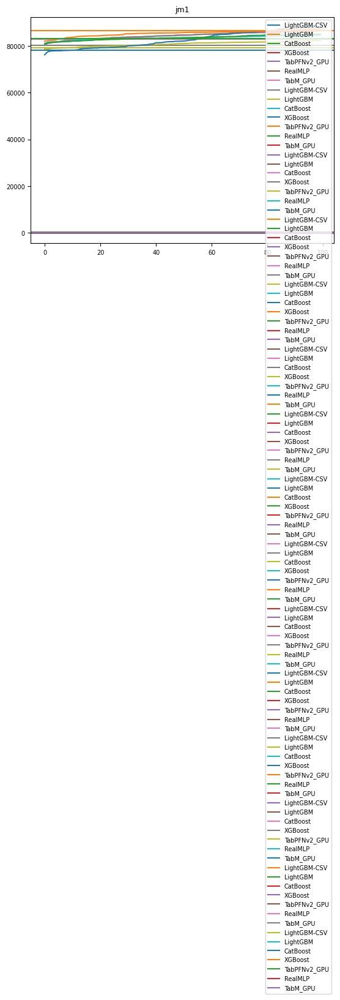

In [12]:
import openml

exp_name = 'csv'
from tabrepo.nips2025_utils.tabarena_context import TabArenaContext
tabarena_context = TabArenaContext()
mod_configs = tabarena_context.load_configs_hyperparameters(['LightGBM'], download='auto')  # load hyperparameters for the methods

perf_dict = {}
perf_dict_val = {}
final_perf_ta = {}
final_perf_rep = {}
repeat = 2
fold = 2
for tid, did in zip(tids, dids):
    task = openml.tasks.get_task(tid)  # to check if the datasets are available
    data = openml.datasets.get_dataset(did)  # to check if the datasets are available
    perf_dict[data.name] = {}
    perf_dict_val[data.name] = {}
    final_perf_rep[data.name] = {}
    final_perf_ta[data.name] = {}
    try:
        with open(f"../results/{exp_name}/data/LightGBM_c1_BAG_L1/{tid}/{repeat}_{fold}/results.pkl", "rb") as f:
            results = pd.read_pickle(f)
            perf_dict[data.name][f"LightGBM_c1_BAG_L1"] = results['metric_error']
        for r in range(1,200):
            with open(f"../results/{exp_name}/data/LightGBM_r{r}_BAG_L1/{tid}/{repeat}_{fold}/results.pkl", "rb") as f:
                results = pd.read_pickle(f)
                perf_dict[data.name][f"LightGBM_r{r}_BAG_L1"] = results['metric_error']
                perf_dict_val[data.name][f"LightGBM_r{r}_BAG_L1"] = results['metric_error_val']
    except FileNotFoundError:
        print(f"Results for {data.name} not found in ../results/{exp_name}/data/LightGBM_c1_BAG_L1/{tid}/{repeat}_{fold}/results.pkl")
        continue


    res = tabarena_context.load_config_results('LightGBM')
    res = res.loc[res.dataset==data.name]
    res = res.loc[res.fold==fold]

    perf_reproduce = pd.Series(perf_dict[data.name])
    perf_reproduce_val = pd.Series(perf_dict_val[data.name])

    perf_tabarena = pd.Series({method: res.loc[res.method==method, 'metric_error'].values[0] for method in res.method.unique()})
    perf_tabarena = perf_tabarena.loc[perf_reproduce.index]
    perf_tabarena_val = pd.Series({method: res.loc[res.method==method, 'metric_error_val'].values[0] for method in res.method.unique()})
    perf_tabarena_val = perf_tabarena_val.loc[perf_reproduce.index]

    line, = plt.plot(perf_reproduce.sort_values().values[:100], label='LightGBM-CSV')
    line2, = plt.plot(perf_tabarena.sort_values().values[:100], label='LightGBM')
 
    final_perf_ta[data.name] = perf_tabarena.loc[perf_tabarena_val.idxmin()]
    final_perf_rep[data.name] = perf_reproduce.loc[perf_reproduce_val.idxmin()]
    plt.axhline(final_perf_rep[data.name], color=line.get_color())
    plt.axhline(final_perf_ta[data.name], color=line2.get_color())

    for model_name in ['CatBoost', 'XGBoost', 'TabPFNv2_GPU', 'RealMLP', 'TabM_GPU']:
        print(model_name)
        res = tabarena_context.load_config_results(model_name)
        res = res.loc[res.dataset==data.name]
        res = res.loc[res.fold==0]
        best_by_val = res.loc[res['metric_error_val'].idxmin(),'metric_error']
        perf = pd.Series({method: res.loc[res.method==method, 'metric_error'].values[0] for method in res.method.unique()})
        perf = perf.reset_index(drop=True)
        line, = plt.plot(perf.sort_values().values[:100], label=model_name)
        col = line.get_color()
        plt.axhline(res.loc[res['metric_error_val'].idxmin(),'metric_error'], color=col)

    plt.title(data.name)
    plt.legend()
    # plt.show()
    

CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


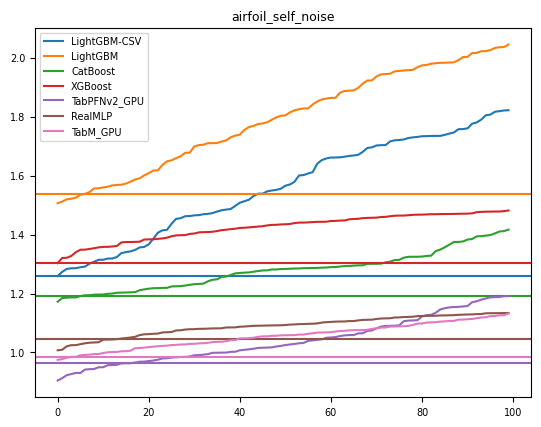

Results for Amazon_employee_access not found in results/csv/data/LightGBM_c1_BAG_L1/363613/2_2/results.pkl
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


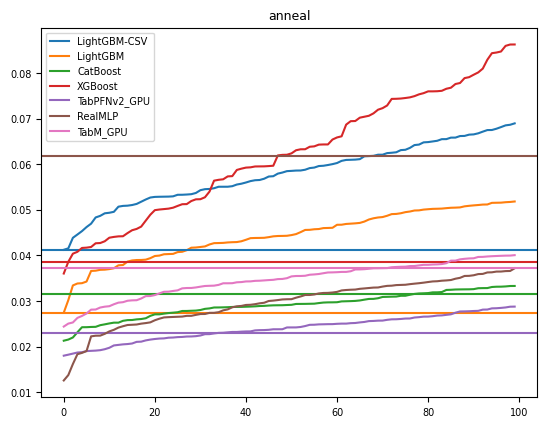

Results for Another-Dataset-on-used-Fiat-500 not found in results/csv/data/LightGBM_c1_BAG_L1/363615/2_2/results.pkl
Results for APSFailure not found in results/csv/data/LightGBM_c1_BAG_L1/363616/2_2/results.pkl
Results for bank-marketing not found in results/csv/data/LightGBM_c1_BAG_L1/363618/2_2/results.pkl
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


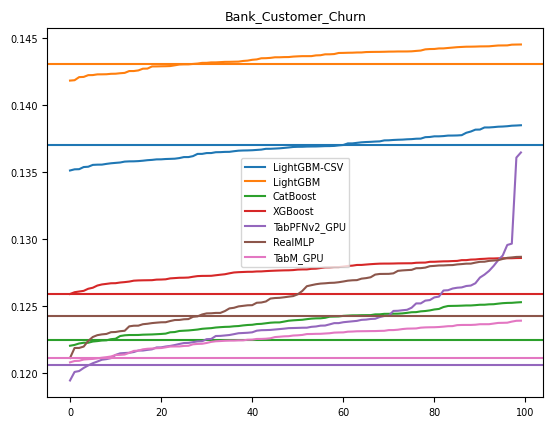

Results for Bioresponse not found in results/csv/data/LightGBM_c1_BAG_L1/363620/2_2/results.pkl
Results for blood-transfusion-service-center not found in results/csv/data/LightGBM_c1_BAG_L1/363621/2_2/results.pkl
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


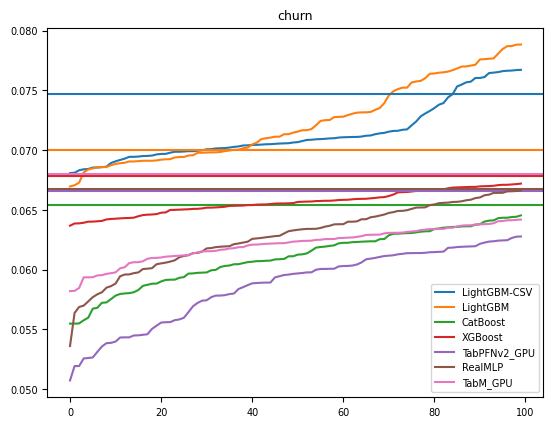

Results for coil2000_insurance_policies not found in results/csv/data/LightGBM_c1_BAG_L1/363624/2_2/results.pkl
Results for concrete_compressive_strength not found in results/csv/data/LightGBM_c1_BAG_L1/363625/2_2/results.pkl
Results for credit-g not found in results/csv/data/LightGBM_c1_BAG_L1/363626/2_2/results.pkl
Results for credit_card_clients_default not found in results/csv/data/LightGBM_c1_BAG_L1/363627/2_2/results.pkl
Results for customer_satisfaction_in_airline not found in results/csv/data/LightGBM_c1_BAG_L1/363628/2_2/results.pkl
Results for diabetes not found in results/csv/data/LightGBM_c1_BAG_L1/363629/2_2/results.pkl
Results for Diabetes130US not found in results/csv/data/LightGBM_c1_BAG_L1/363630/2_2/results.pkl
Results for diamonds not found in results/csv/data/LightGBM_c1_BAG_L1/363631/2_2/results.pkl
Results for E-CommereShippingData not found in results/csv/data/LightGBM_c1_BAG_L1/363632/2_2/results.pkl
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


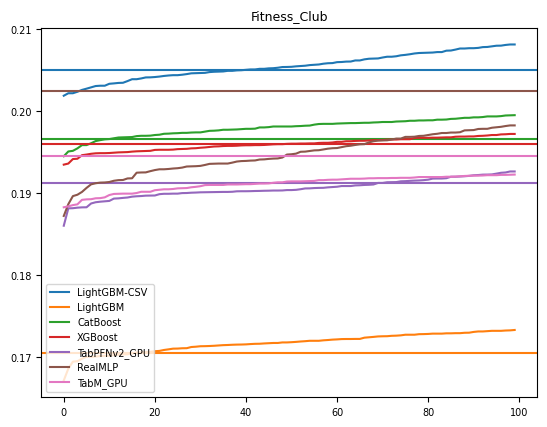

Results for Food_Delivery_Time not found in results/csv/data/LightGBM_c1_BAG_L1/363672/2_2/results.pkl
Results for GiveMeSomeCredit not found in results/csv/data/LightGBM_c1_BAG_L1/363673/2_2/results.pkl
Results for hazelnut-spread-contaminant-detection not found in results/csv/data/LightGBM_c1_BAG_L1/363674/2_2/results.pkl
Results for healthcare_insurance_expenses not found in results/csv/data/LightGBM_c1_BAG_L1/363675/2_2/results.pkl
Results for heloc not found in results/csv/data/LightGBM_c1_BAG_L1/363676/2_2/results.pkl
Results for hiva_agnostic not found in results/csv/data/LightGBM_c1_BAG_L1/363677/2_2/results.pkl
Results for houses not found in results/csv/data/LightGBM_c1_BAG_L1/363678/2_2/results.pkl
Results for HR_Analytics_Job_Change_of_Data_Scientists not found in results/csv/data/LightGBM_c1_BAG_L1/363679/2_2/results.pkl
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


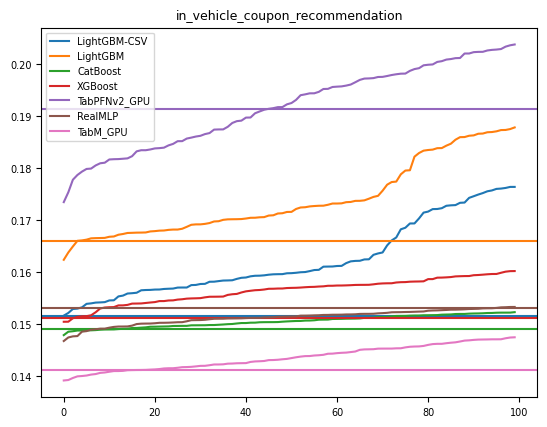

CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


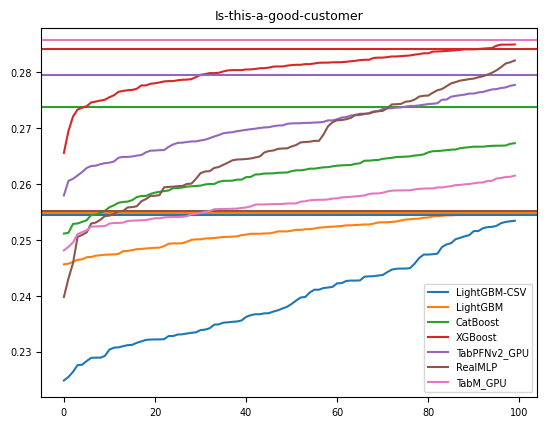

Results for kddcup09_appetency not found in results/csv/data/LightGBM_c1_BAG_L1/363683/2_2/results.pkl
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


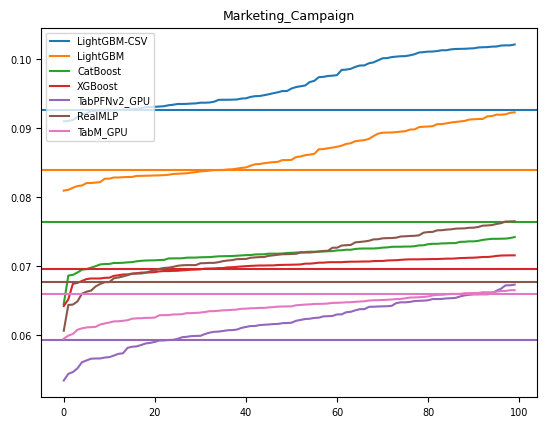

Results for maternal_health_risk not found in results/csv/data/LightGBM_c1_BAG_L1/363685/2_2/results.pkl
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


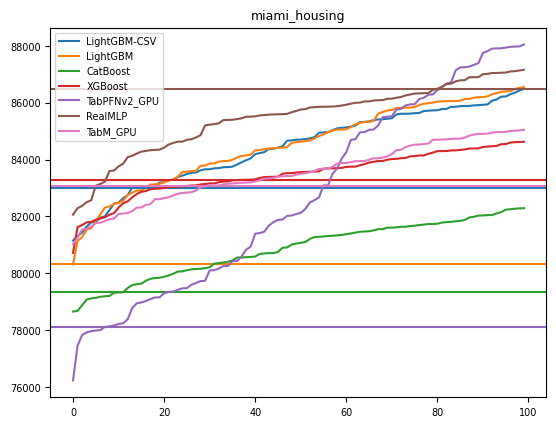

CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


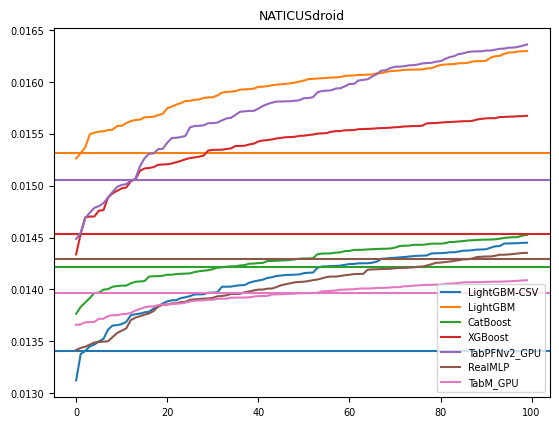

CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


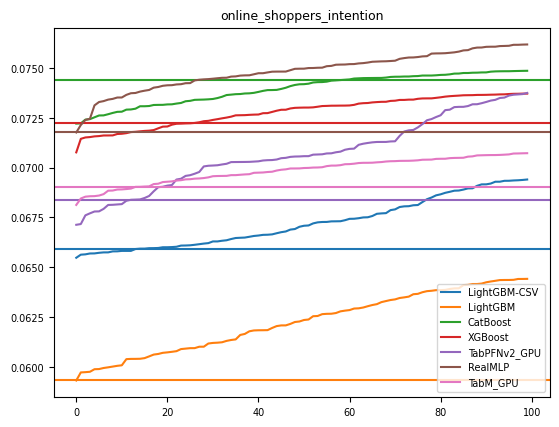

Results for physiochemical_protein not found in results/csv/data/LightGBM_c1_BAG_L1/363693/2_2/results.pkl
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


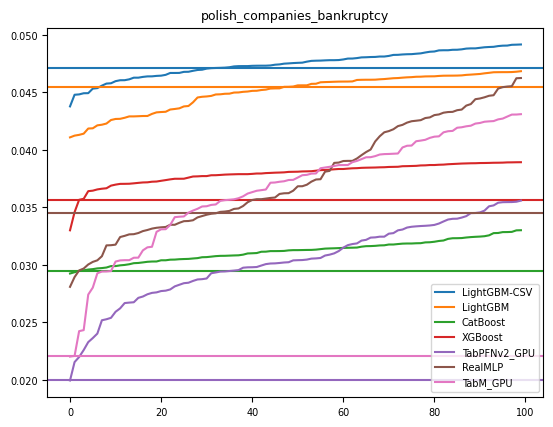

CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


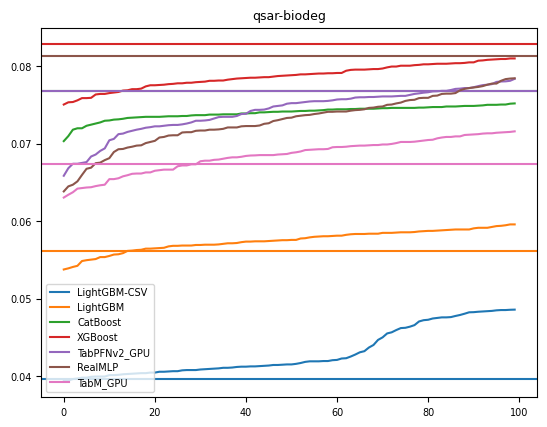

Results for QSAR-TID-11 not found in results/csv/data/LightGBM_c1_BAG_L1/363697/2_2/results.pkl
Results for QSAR_fish_toxicity not found in results/csv/data/LightGBM_c1_BAG_L1/363698/2_2/results.pkl
Results for SDSS17 not found in results/csv/data/LightGBM_c1_BAG_L1/363699/2_2/results.pkl
Results for seismic-bumps not found in results/csv/data/LightGBM_c1_BAG_L1/363700/2_2/results.pkl
Results for splice not found in results/csv/data/LightGBM_c1_BAG_L1/363702/2_2/results.pkl
Results for students_dropout_and_academic_success not found in results/csv/data/LightGBM_c1_BAG_L1/363704/2_2/results.pkl
Results for superconductivity not found in results/csv/data/LightGBM_c1_BAG_L1/363705/2_2/results.pkl
Results for taiwanese_bankruptcy_prediction not found in results/csv/data/LightGBM_c1_BAG_L1/363706/2_2/results.pkl
Results for website_phishing not found in results/csv/data/LightGBM_c1_BAG_L1/363707/2_2/results.pkl
Results for wine_quality not found in results/csv/data/LightGBM_c1_BAG_L1/363708

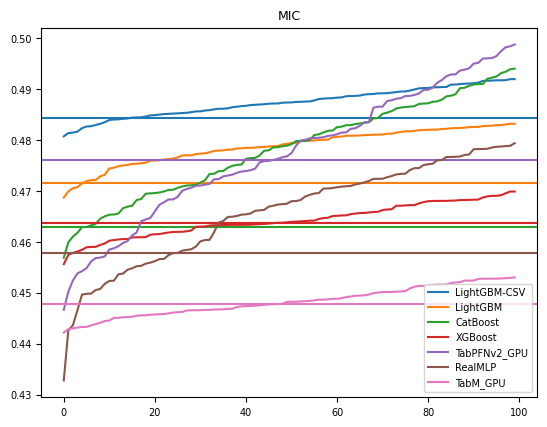

CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


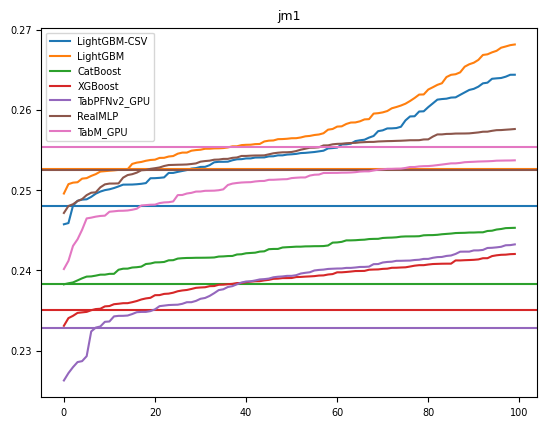

In [36]:
import openml
perf_dict = {}
perf_dict_val = {}
final_perf_ta = {}
final_perf_rep = {}
repeat = 2
fold = 2
for tid, did in zip(tids, dids):
    task = openml.tasks.get_task(tid)  # to check if the datasets are available
    data = openml.datasets.get_dataset(did)  # to check if the datasets are available
    perf_dict[data.name] = {}
    perf_dict_val[data.name] = {}
    final_perf_rep[data.name] = {}
    final_perf_ta[data.name] = {}
    try:
        with open(f"results/{exp_name}/data/LightGBM_c1_BAG_L1/{tid}/{repeat}_{fold}/results.pkl", "rb") as f:
            results = pd.read_pickle(f)
            perf_dict[data.name][f"LightGBM_c1_BAG_L1"] = results['metric_error']
        for r in range(1,200):
            with open(f"results/{exp_name}/data/LightGBM_r{r}_BAG_L1/{tid}/{repeat}_{fold}/results.pkl", "rb") as f:
                results = pd.read_pickle(f)
                perf_dict[data.name][f"LightGBM_r{r}_BAG_L1"] = results['metric_error']
                perf_dict_val[data.name][f"LightGBM_r{r}_BAG_L1"] = results['metric_error_val']
    except FileNotFoundError:
        print(f"Results for {data.name} not found in results/{exp_name}/data/LightGBM_c1_BAG_L1/{tid}/{repeat}_{fold}/results.pkl")
        continue


    res = tabarena_context.load_config_results('LightGBM')
    res = res.loc[res.dataset==data.name]
    res = res.loc[res.fold==fold]

    perf_reproduce = pd.Series(perf_dict[data.name])
    perf_reproduce_val = pd.Series(perf_dict_val[data.name])

    perf_tabarena = pd.Series({method: res.loc[res.method==method, 'metric_error'].values[0] for method in res.method.unique()})
    perf_tabarena = perf_tabarena.loc[perf_reproduce.index]
    perf_tabarena_val = pd.Series({method: res.loc[res.method==method, 'metric_error_val'].values[0] for method in res.method.unique()})
    perf_tabarena_val = perf_tabarena_val.loc[perf_reproduce.index]

    line, = plt.plot(perf_reproduce.sort_values().values[:100], label='LightGBM-CSV')
    line2, = plt.plot(perf_tabarena.sort_values().values[:100], label='LightGBM')
 
    final_perf_ta[data.name] = perf_tabarena.loc[perf_tabarena_val.idxmin()]
    final_perf_rep[data.name] = perf_reproduce.loc[perf_reproduce_val.idxmin()]
    plt.axhline(final_perf_rep[data.name], color=line.get_color())
    plt.axhline(final_perf_ta[data.name], color=line2.get_color())

    for model_name in ['CatBoost', 'XGBoost', 'TabPFNv2_GPU', 'RealMLP', 'TabM_GPU']:
        print(model_name)
        res = tabarena_context.load_config_results(model_name)
        res = res.loc[res.dataset==data.name]
        res = res.loc[res.fold==0]
        best_by_val = res.loc[res['metric_error_val'].idxmin(),'metric_error']
        perf = pd.Series({method: res.loc[res.method==method, 'metric_error'].values[0] for method in res.method.unique()})
        perf = perf.reset_index(drop=True)
        line, = plt.plot(perf.sort_values().values[:100], label=model_name)
        col = line.get_color()
        plt.axhline(res.loc[res['metric_error_val'].idxmin(),'metric_error'], color=col)

    plt.title(data.name)
    plt.legend()
    plt.show()
    

In [5]:
exp_name

'ftd'

In [ ]:
import openml
from tabprep.tabprep.utils import get_benchmark_dataIDs
tids, dids = get_benchmark_dataIDs('TabArena')

perf_dict = {}
perf_dict_val = {}
final_perf_ta = {}
final_perf_rep = {}
for tid, did in zip(tids, dids):
    task = openml.tasks.get_task(tid)  # to check if the datasets are available
    data = openml.datasets.get_dataset(did)  # to check if the datasets are available
    perf_dict[data.name] = {}
    perf_dict_val[data.name] = {}
    final_perf_rep[data.name] = {}
    final_perf_ta[data.name] = {}
    try:
        with open(f"results/{exp_name}/data/LightGBM_c1_BAG_L1/{tid}/0_0/results.pkl", "rb") as f:
            results = pd.read_pickle(f)
            perf_dict[data.name][f"LightGBM_c1_BAG_L1"] = results['metric_error']
        for r in range(1,200):
            with open(f"results/{exp_name}/data/LightGBM_r{r}_BAG_L1/{tid}/0_0/results.pkl", "rb") as f:
                results = pd.read_pickle(f)
                perf_dict[data.name][f"LightGBM_r{r}_BAG_L1"] = results['metric_error']
                perf_dict_val[data.name][f"LightGBM_r{r}_BAG_L1"] = results['metric_error_val']
    except FileNotFoundError:
        print(f"Results for {data.name} not found in results/{exp_name}/data/LightGBM_c1_BAG_L1/{tid}/0_0/results.pkl")
        continue


    res = tabarena_context.load_config_results('LightGBM')
    res = res.loc[res.dataset==data.name]
    res = res.loc[res.fold==0]

    perf_reproduce = pd.Series(perf_dict[data.name])
    perf_reproduce_val = pd.Series(perf_dict_val[data.name])

    perf_tabarena = pd.Series({method: res.loc[res.method==method, 'metric_error'].values[0] for method in res.method.unique()})
    perf_tabarena = perf_tabarena.loc[perf_reproduce.index]
    perf_tabarena_val = pd.Series({method: res.loc[res.method==method, 'metric_error_val'].values[0] for method in res.method.unique()})
    perf_tabarena_val = perf_tabarena_val.loc[perf_reproduce.index]

    line, = plt.plot(perf_reproduce.sort_values().values[:100], label='LightGBM-CSV')
    line2, = plt.plot(perf_tabarena.sort_values().values[:100], label='LightGBM')
 
    final_perf_ta[data.name] = perf_tabarena.loc[perf_tabarena_val.idxmin()]
    final_perf_rep[data.name] = perf_reproduce.loc[perf_reproduce_val.idxmin()]
    plt.axhline(final_perf_rep[data.name], color=line.get_color())
    plt.axhline(final_perf_ta[data.name], color=line2.get_color())

    for model_name in ['CatBoost', 'XGBoost', 'TabPFNv2_GPU', 'RealMLP', 'TabM_GPU']:
        print(model_name)
        res = tabarena_context.load_config_results(model_name)
        res = res.loc[res.dataset==data.name]
        res = res.loc[res.fold==0]
        best_by_val = res.loc[res['metric_error_val'].idxmin(),'metric_error']
        perf = pd.Series({method: res.loc[res.method==method, 'metric_error'].values[0] for method in res.method.unique()})
        perf = perf.reset_index(drop=True)
        line, = plt.plot(perf.sort_values().values[:100], label=model_name)
        col = line.get_color()
        plt.axhline(res.loc[res['metric_error_val'].idxmin(),'metric_error'], color=col)

    plt.title(data.name)
    plt.legend()
    plt.show()
    

Results for airfoil_self_noise not found in results/ftd/data/LightGBM_c1_BAG_L1/363612/0_0/results.pkl
Results for Amazon_employee_access not found in results/ftd/data/LightGBM_c1_BAG_L1/363613/0_0/results.pkl
Results for anneal not found in results/ftd/data/LightGBM_c1_BAG_L1/363614/0_0/results.pkl
Results for Another-Dataset-on-used-Fiat-500 not found in results/ftd/data/LightGBM_c1_BAG_L1/363615/0_0/results.pkl
Results for APSFailure not found in results/ftd/data/LightGBM_c1_BAG_L1/363616/0_0/results.pkl
Results for bank-marketing not found in results/ftd/data/LightGBM_c1_BAG_L1/363618/0_0/results.pkl
Results for Bank_Customer_Churn not found in results/ftd/data/LightGBM_c1_BAG_L1/363619/0_0/results.pkl
Results for Bioresponse not found in results/ftd/data/LightGBM_c1_BAG_L1/363620/0_0/results.pkl
Results for blood-transfusion-service-center not found in results/ftd/data/LightGBM_c1_BAG_L1/363621/0_0/results.pkl
Results for churn not found in results/ftd/data/LightGBM_c1_BAG_L1/3636

In [ ]:
        best_by_val = res.loc[res['metric_error_val'].idxmin(),'metric_error']
        perf = pd.Series({method: res.loc[res.method==method, 'metric_error'].values[0] for method in res.method.unique()})
        perf = perf.reset_index(drop=True)
        line, = plt.plot(perf.sort_values().values[:100], label=model_name)
        col = line.get_color()
        plt.axhline(res.loc[res['metric_error_val'].idxmin(),'metric_error'], color=col)
    plt.legend()
    plt.title(f"Performance on {dataset_name}")
    plt.show()


,airfoil_self_noise,Amazon_employee_access,anneal,Another-Dataset-on-used-Fiat-500,APSFailure,bank-marketing,Bank_Customer_Churn,Bioresponse,blood-transfusion-service-center,churn,...,SDSS17,seismic-bumps,splice,students_dropout_and_academic_success,superconductivity,taiwanese_bankruptcy_prediction,website_phishing,wine_quality,MIC,jm1
LightGBM_c1_BAG_L1,1.524684,1.524684,1.524684,1.524684,1.524684,1.524684,1.524684,1.524684,1.524684,1.524684,...,1.524684,1.524684,1.524684,1.524684,1.524684,1.524684,1.524684,1.524684,1.524684,1.524684
LightGBM_r1_BAG_L1,3.537329,3.537329,3.537329,3.537329,3.537329,3.537329,3.537329,3.537329,3.537329,3.537329,...,3.537329,3.537329,3.537329,3.537329,3.537329,3.537329,3.537329,3.537329,3.537329,3.537329
LightGBM_r2_BAG_L1,4.545563,4.545563,4.545563,4.545563,4.545563,4.545563,4.545563,4.545563,4.545563,4.545563,...,4.545563,4.545563,4.545563,4.545563,4.545563,4.545563,4.545563,4.545563,4.545563,4.545563
LightGBM_r3_BAG_L1,1.996099,1.996099,1.996099,1.996099,1.996099,1.996099,1.996099,1.996099,1.996099,1.996099,...,1.996099,1.996099,1.996099,1.996099,1.996099,1.996099,1.996099,1.996099,1.996099,1.996099
LightGBM_r4_BAG_L1,1.825561,1.825561,1.825561,1.825561,1.825561,1.825561,1.825561,1.825561,1.825561,1.825561,...,1.825561,1.825561,1.825561,1.825561,1.825561,1.825561,1.825561,1.825561,1.825561,1.825561
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LightGBM_r195_BAG_L1,2.301648,2.301648,2.301648,2.301648,2.301648,2.301648,2.301648,2.301648,2.301648,2.301648,...,2.301648,2.301648,2.301648,2.301648,2.301648,2.301648,2.301648,2.301648,2.301648,2.301648
LightGBM_r196_BAG_L1,1.393676,1.393676,1.393676,1.393676,1.393676,1.393676,1.393676,1.393676,1.393676,1.393676,...,1.393676,1.393676,1.393676,1.393676,1.393676,1.393676,1.393676,1.393676,1.393676,1.393676
LightGBM_r197_BAG_L1,1.757214,1.757214,1.757214,1.757214,1.757214,1.757214,1.757214,1.757214,1.757214,1.757214,...,1.757214,1.757214,1.757214,1.757214,1.757214,1.757214,1.757214,1.757214,1.757214,1.757214
LightGBM_r198_BAG_L1,1.647021,1.647021,1.647021,1.647021,1.647021,1.647021,1.647021,1.647021,1.647021,1.647021,...,1.647021,1.647021,1.647021,1.647021,1.647021,1.647021,1.647021,1.647021,1.647021,1.647021


In [107]:
res = tabarena_context.load_config_results('LightGBM')
res = res.loc[res.dataset=="airfoil_self_noise"]
res = res.loc[res.fold==0]

perf_reproduce = pd.Series(perf_dict)
perf_reproduce_val = pd.Series(perf_dict_val)

perf_tabarena = pd.Series({method: res.loc[res.method==method, 'metric_error'].values[0] for method in res.method.unique()})
perf_tabarena = perf_tabarena.loc[perf_reproduce.index]
perf_tabarena_val = pd.Series({method: res.loc[res.method==method, 'metric_error_val'].values[0] for method in res.method.unique()})
perf_tabarena_val = perf_tabarena_val.loc[perf_reproduce.index]


In [ ]:
res

In [105]:
perf_reproduce

LightGBM_c1_BAG_L1      1.524684
LightGBM_r1_BAG_L1      3.537329
LightGBM_r2_BAG_L1      4.545563
LightGBM_r3_BAG_L1      1.996099
LightGBM_r4_BAG_L1      1.825561
                          ...   
LightGBM_r195_BAG_L1    2.301648
LightGBM_r196_BAG_L1    1.393676
LightGBM_r197_BAG_L1    1.757214
LightGBM_r198_BAG_L1    1.647021
LightGBM_r199_BAG_L1    1.952872
Length: 200, dtype: float64

In [101]:
(perf_reproduce==perf_tabarena).all()

False

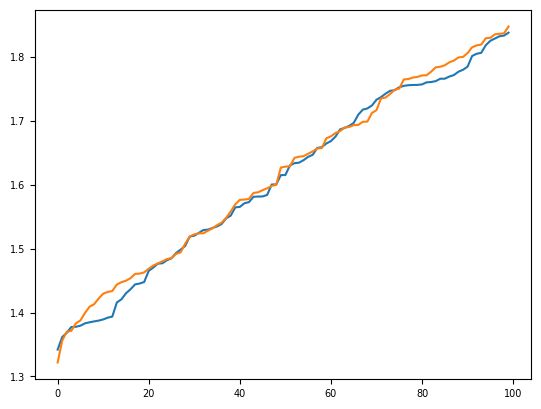

In [ ]:
line, = plt.plot(perf_reproduce.sort_values().values[:100], label='CSV')
line2, = plt.plot(perf_tabarena.sort_values().values[:100], label='TabArena')
plt.axhline()

In [103]:
perf_tabarena.loc[perf_reproduce.index]

LightGBM_c1_BAG_L1      1.485371
LightGBM_r1_BAG_L1      4.029108
LightGBM_r2_BAG_L1      4.545551
LightGBM_r3_BAG_L1      1.912135
LightGBM_r4_BAG_L1      1.818343
                          ...   
LightGBM_r195_BAG_L1    2.117297
LightGBM_r196_BAG_L1    1.383032
LightGBM_r197_BAG_L1    1.835638
LightGBM_r198_BAG_L1    1.594586
LightGBM_r199_BAG_L1    1.996576
Length: 200, dtype: float64

In [ ]:
# perf = pd.Series({method: res.loc[res.method==method, 'metric_error'].values[0] for method in res.method.unique()})
# best_by_val = perf.sort_values().index[0]
best_by_val = res.loc[res['metric_error_val'].idxmin(),'metric_error']

0.6074090003967285

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


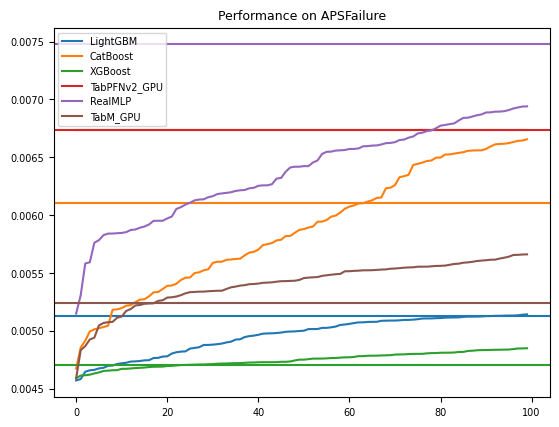

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


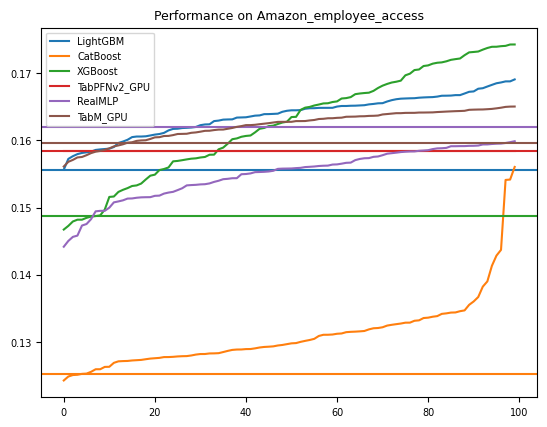

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


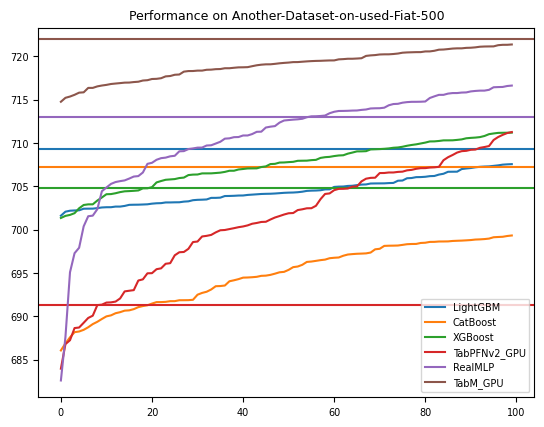

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


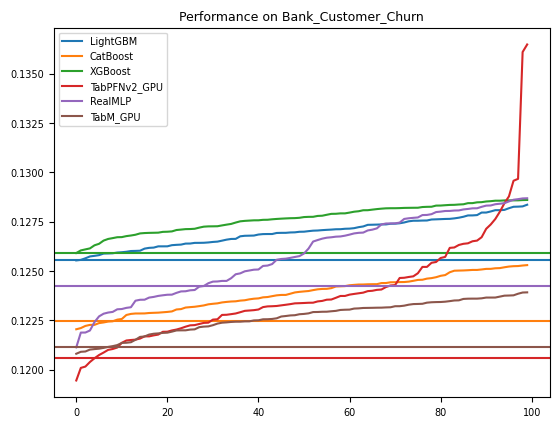

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


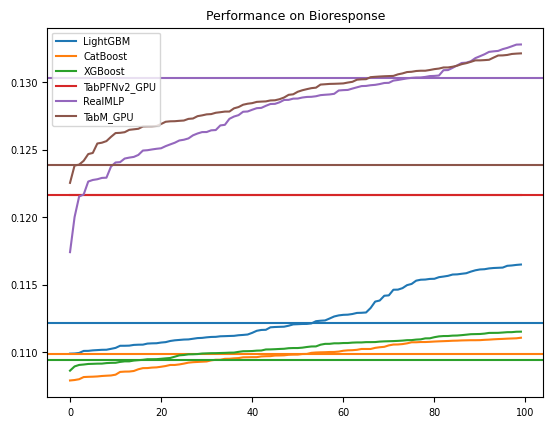

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


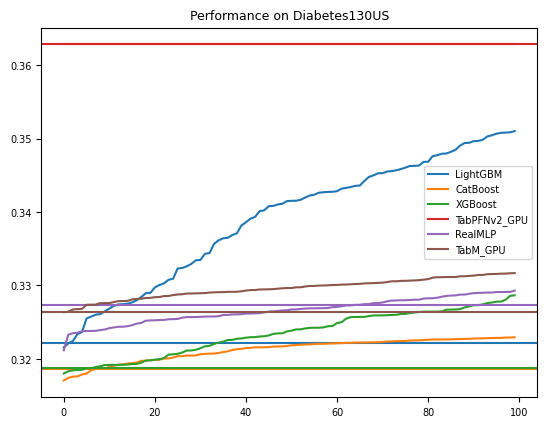

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


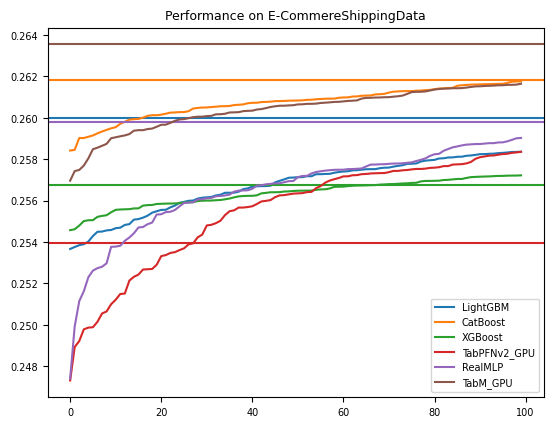

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


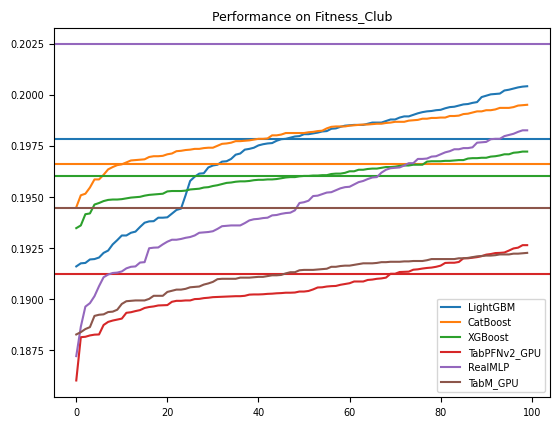

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


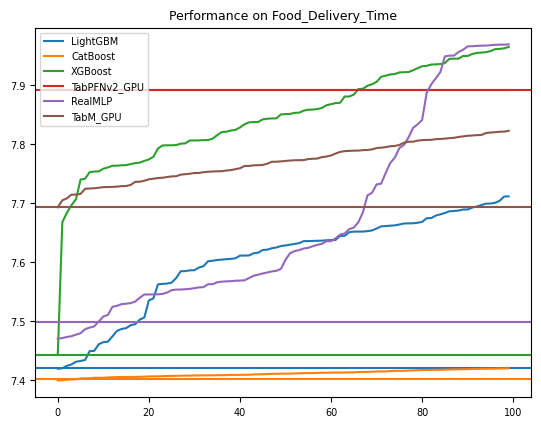

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


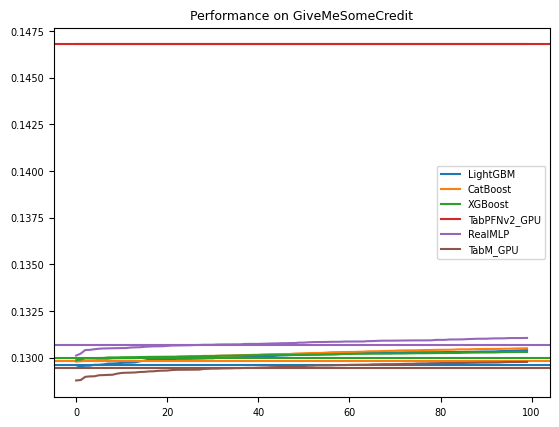

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


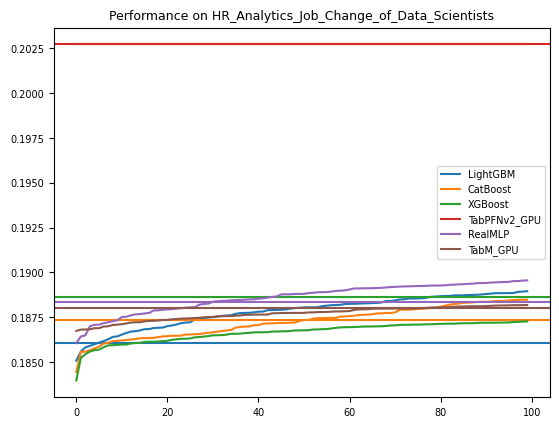

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


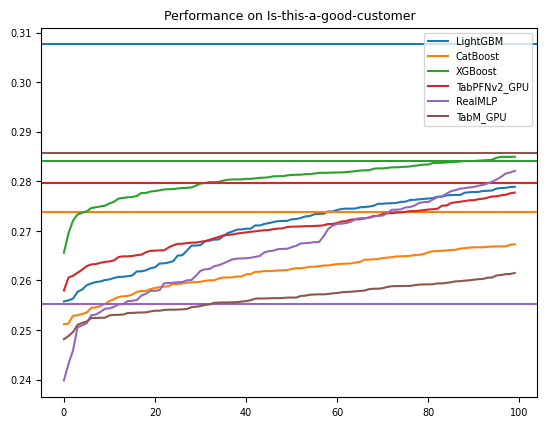

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


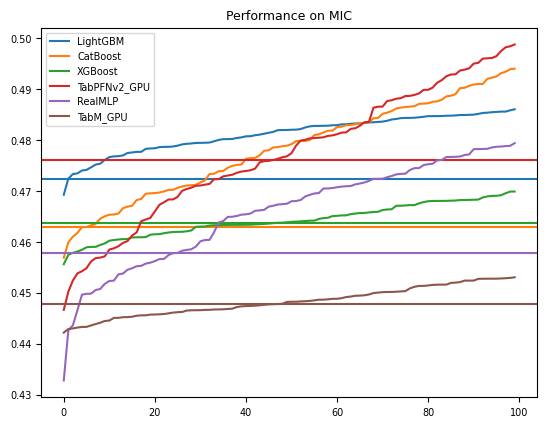

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


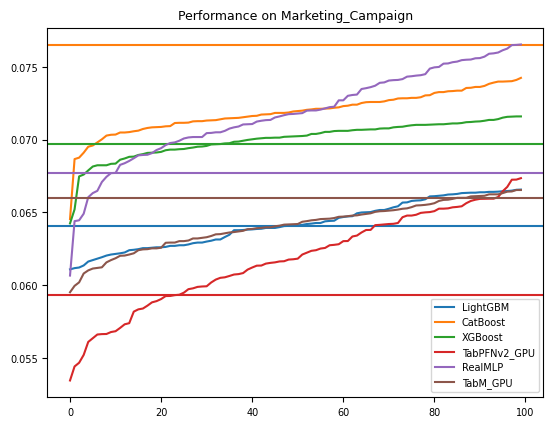

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


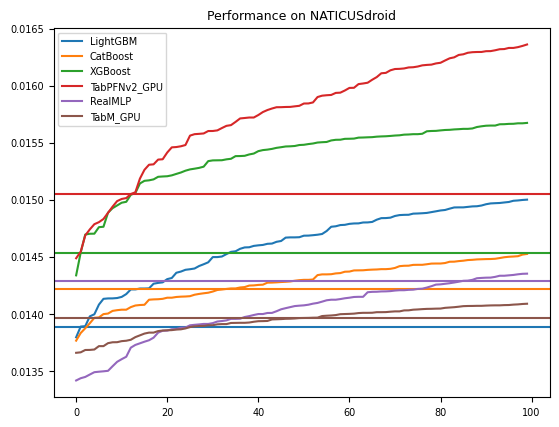

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


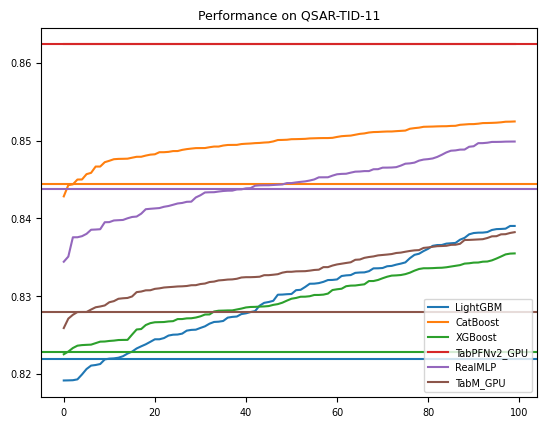

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


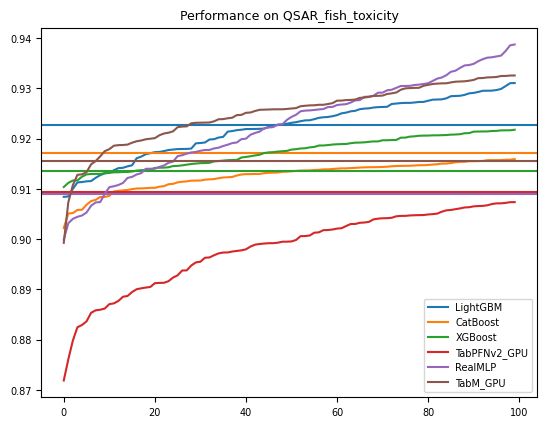

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


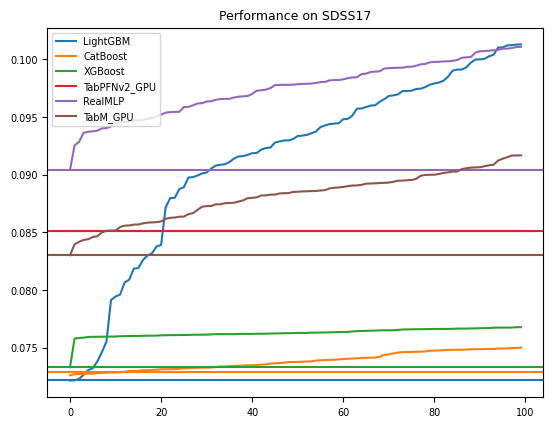

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


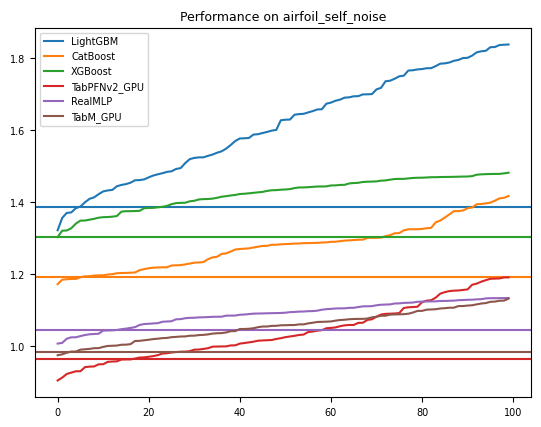

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


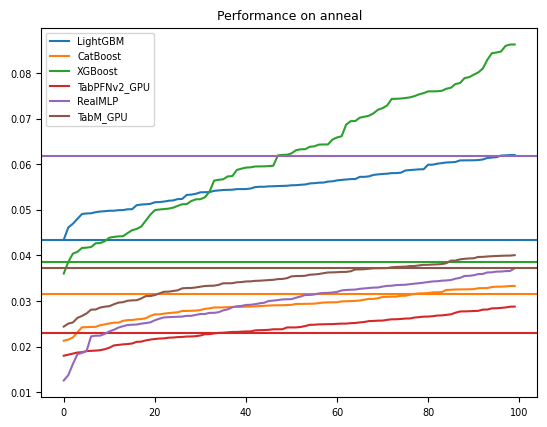

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


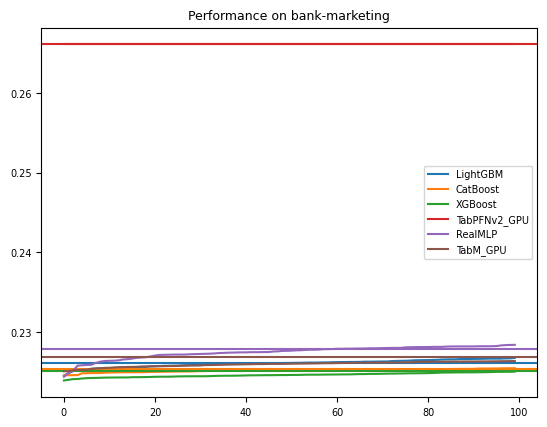

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


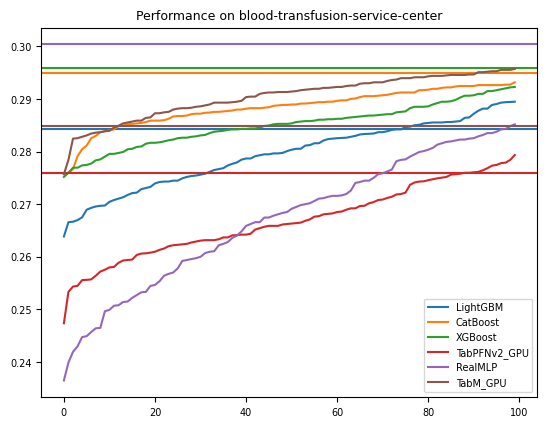

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


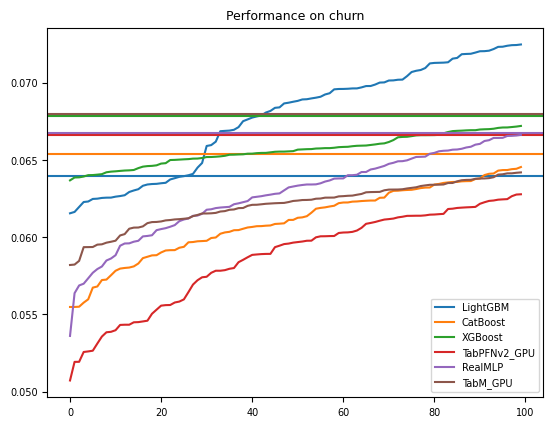

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


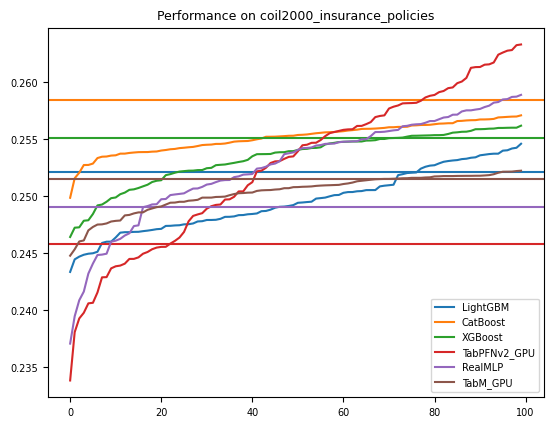

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


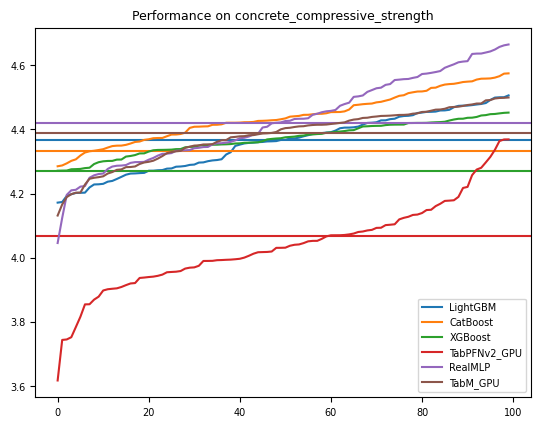

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


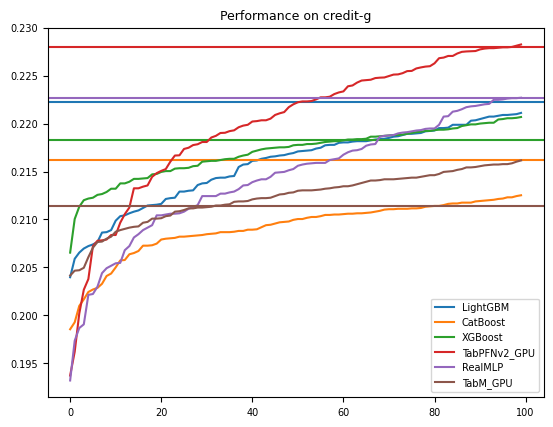

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


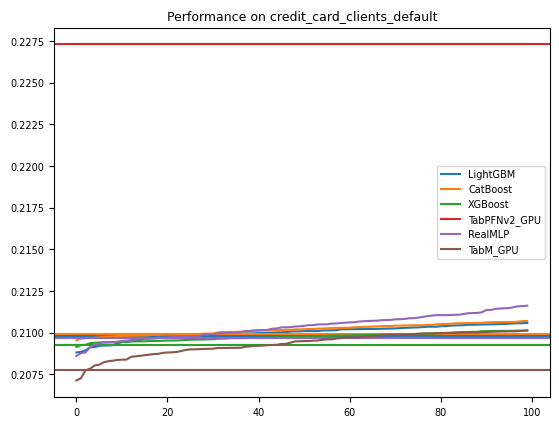

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


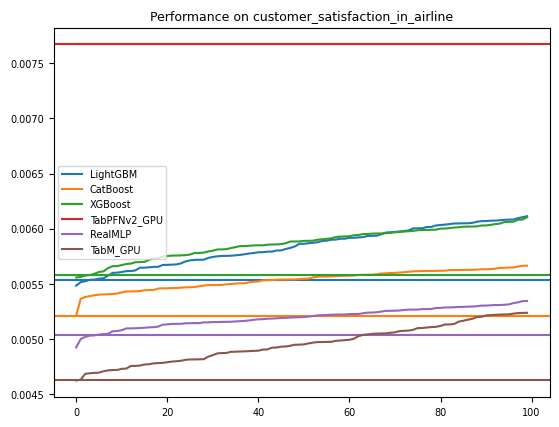

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


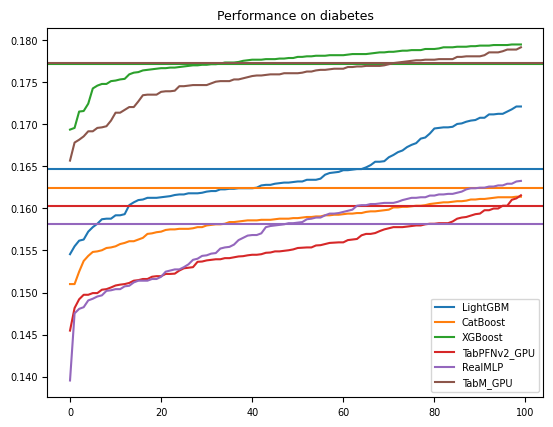

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


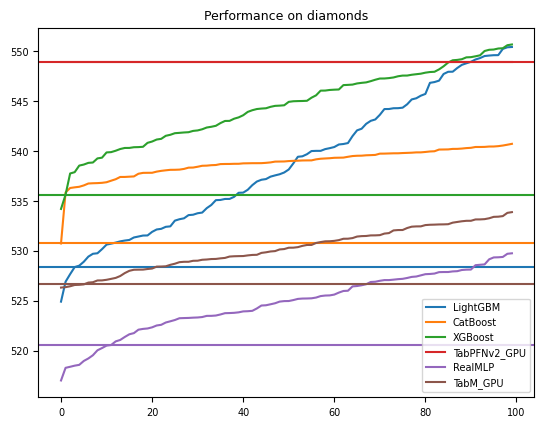

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


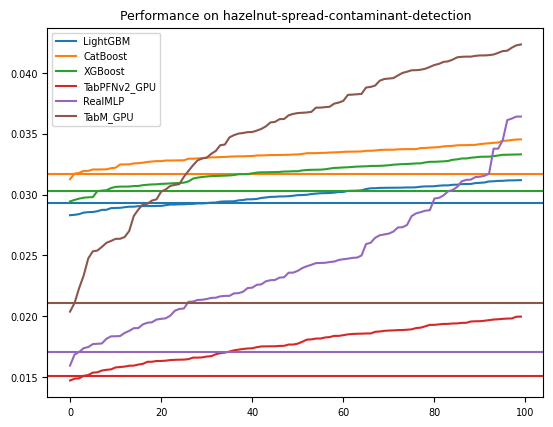

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


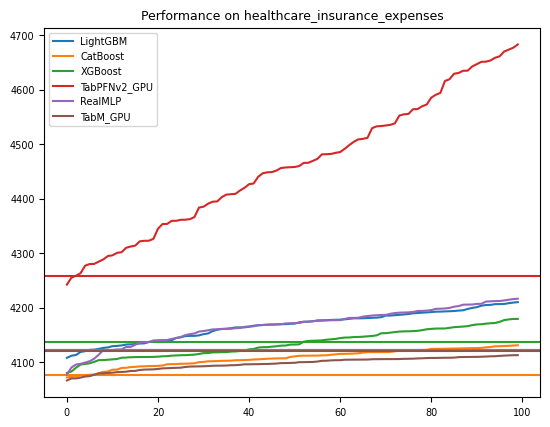

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


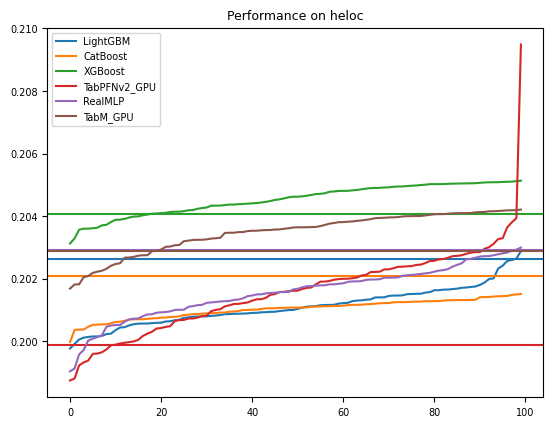

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


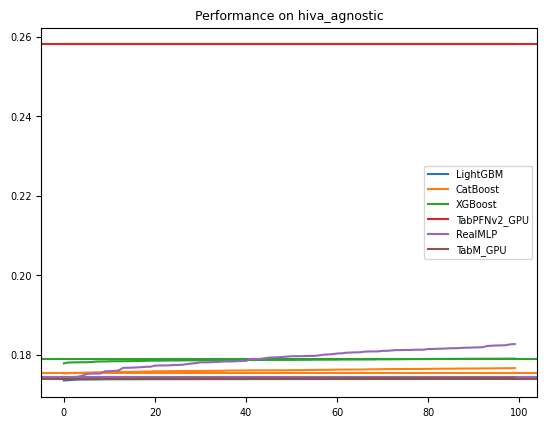

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


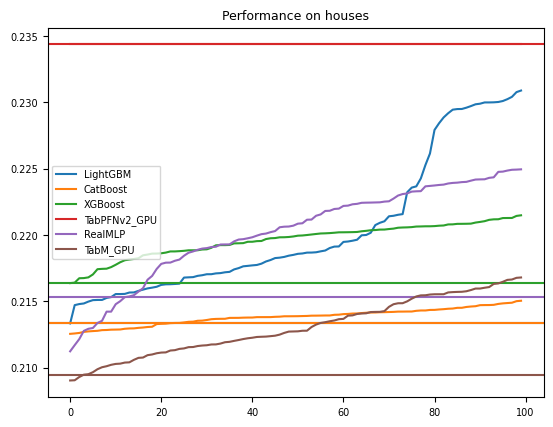

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


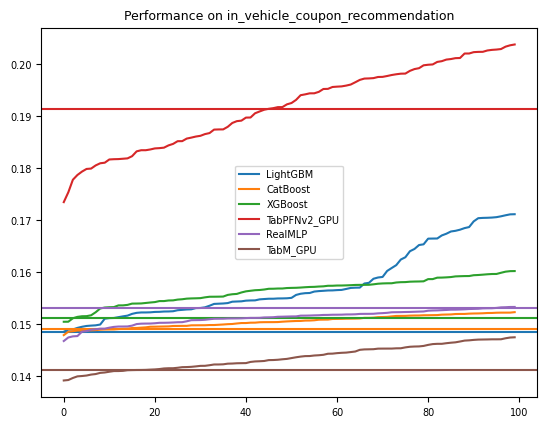

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


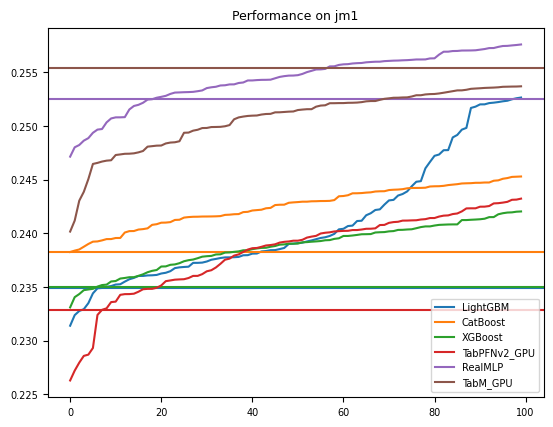

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


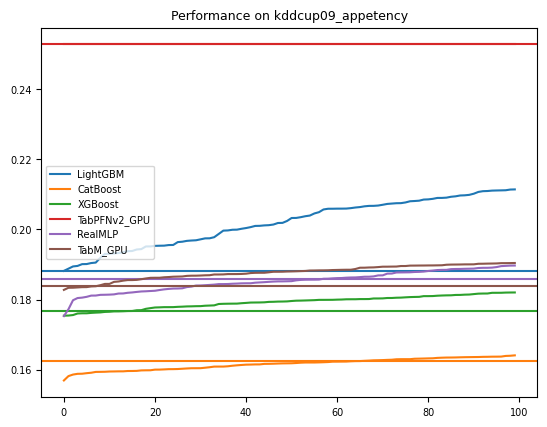

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


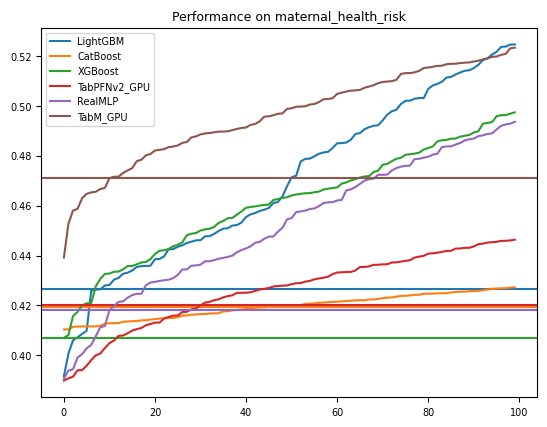

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


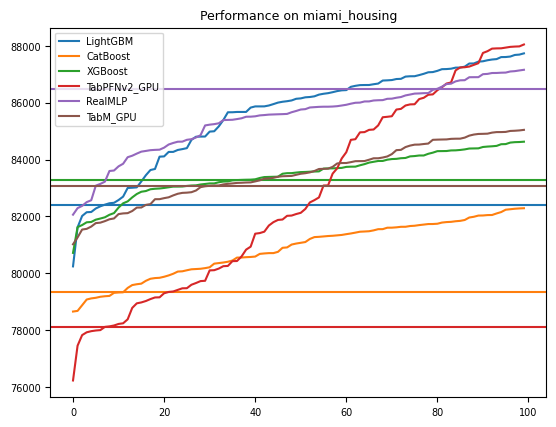

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


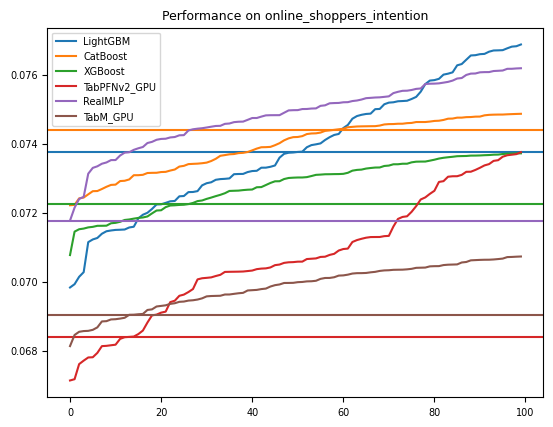

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


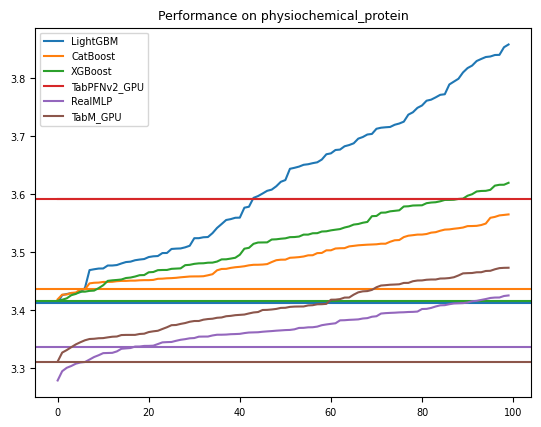

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


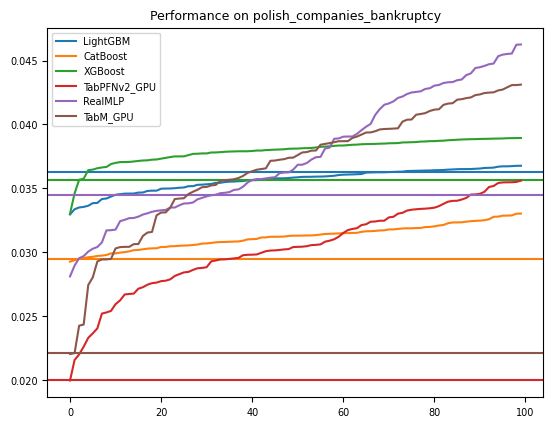

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


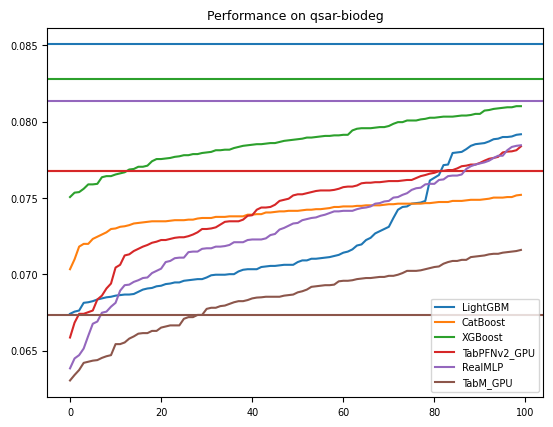

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


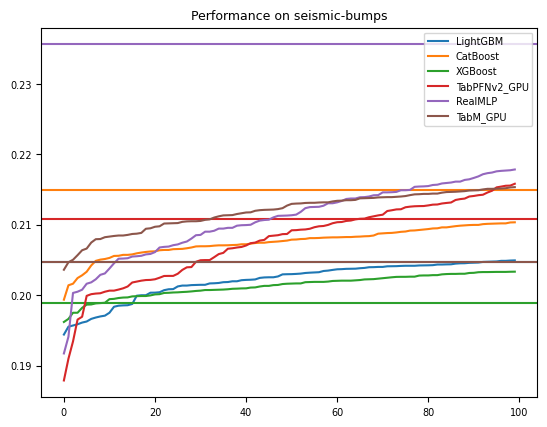

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


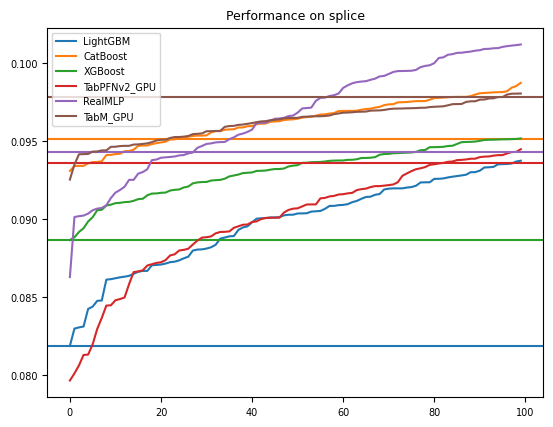

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


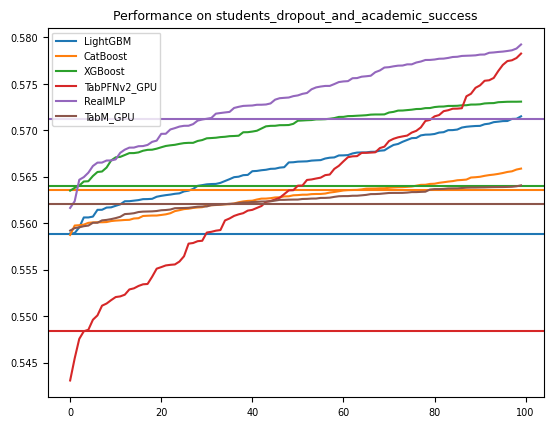

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


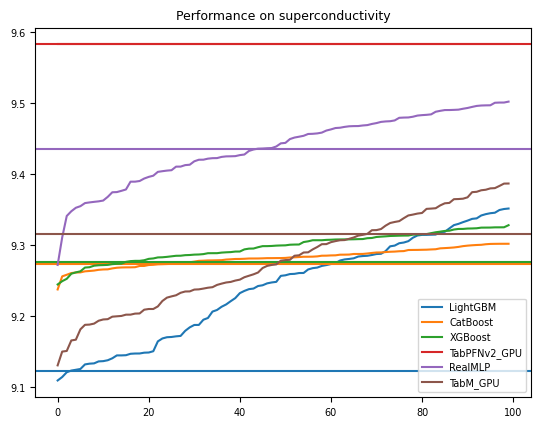

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


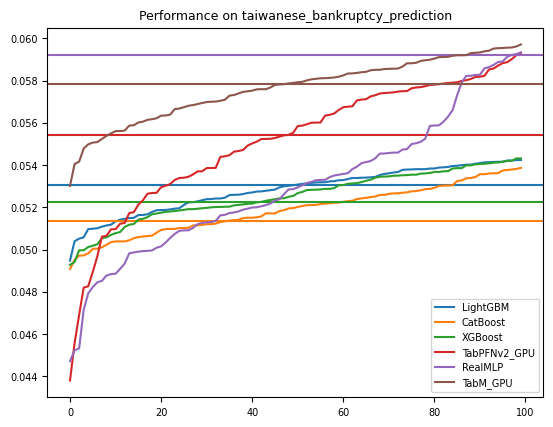

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


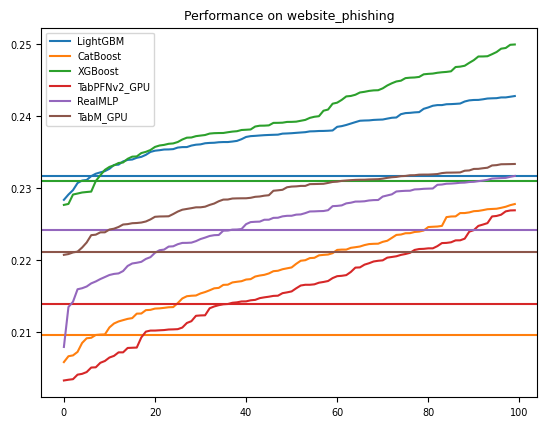

LightGBM
CatBoost
XGBoost
TabPFNv2_GPU
RealMLP
TabM_GPU


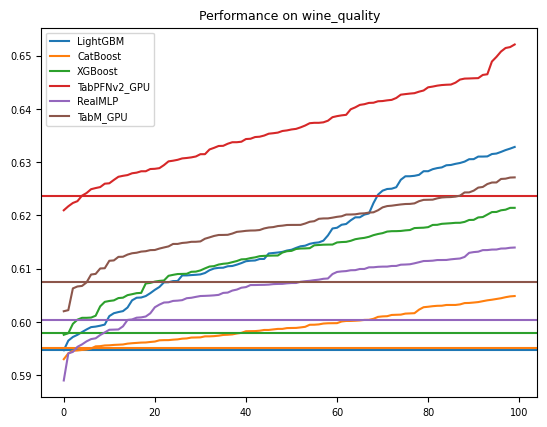

In [96]:
res = tabarena_context.load_config_results('LightGBM')
for dataset_name in res.dataset.unique():
    for model_name in ['LightGBM', 'CatBoost', 'XGBoost', 'TabPFNv2_GPU', 'RealMLP', 'TabM_GPU']:
        print(model_name)
        res = tabarena_context.load_config_results(model_name)
        res = res.loc[res.dataset==dataset_name]
        res = res.loc[res.fold==0]
        best_by_val = res.loc[res['metric_error_val'].idxmin(),'metric_error']
        perf = pd.Series({method: res.loc[res.method==method, 'metric_error'].values[0] for method in res.method.unique()})
        perf = perf.reset_index(drop=True)
        line, = plt.plot(perf.sort_values().values[:100], label=model_name)
        col = line.get_color()
        plt.axhline(res.loc[res['metric_error_val'].idxmin(),'metric_error'], color=col)
    plt.legend()
    plt.title(f"Performance on {dataset_name}")
    plt.show()


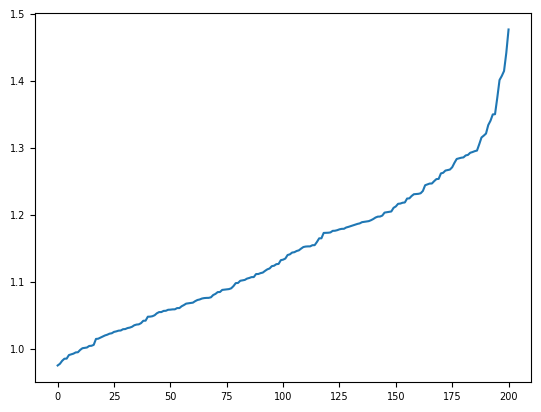

In [88]:
plt.plot(perf.sort_values().values)

In [86]:
perf

0      1.087800
1      1.246483
2      1.063409
3      1.075950
4      1.072738
         ...   
196    1.076784
197    1.143525
198    1.189408
199    1.111524
200    1.262594
Length: 201, dtype: float64

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [39]:
res_df = pd.read_csv('../arr_int.csv',index_col=0)
res_df.columns

Index(['LightGBM_c1_BAG_L1', 'AutoGluon 1.3 (4h)', 'CAT (default)',
       'CAT (tuned + ensemble)', 'CAT (tuned)', 'EBM (default)',
       'EBM (tuned + ensemble)', 'EBM (tuned)', 'FASTAI (default)',
       'FASTAI (tuned + ensemble)', 'FASTAI (tuned)', 'GBM (default)',
       'GBM (tuned + ensemble)', 'GBM (tuned)', 'KNN (default)',
       'KNN (tuned + ensemble)', 'KNN (tuned)', 'LR (default)',
       'LR (tuned + ensemble)', 'LR (tuned)', 'MNCA (default)',
       'MNCA (tuned + ensemble)', 'MNCA (tuned)', 'NN_TORCH (default)',
       'NN_TORCH (tuned + ensemble)', 'NN_TORCH (tuned)',
       'Portfolio-N200 (ensemble) (4h)', 'REALMLP (default)',
       'REALMLP (tuned + ensemble)', 'REALMLP (tuned)', 'RF (default)',
       'RF (tuned + ensemble)', 'RF (tuned)', 'TABDPT (default)',
       'TABICL (default)', 'TABM (default)', 'TABM (tuned + ensemble)',
       'TABM (tuned)', 'TABPFNV2 (default)', 'TABPFNV2 (tuned + ensemble)',
       'TABPFNV2 (tuned)', 'XGB (default)', 'XGB (tuned +

In [41]:
sub = res_df[['LightGBM_c1_BAG_L1','GBM (default)', 'AutoGluon 1.3 (4h)', 'TABPFNV2 (tuned + ensemble)']]
sub.columns = ['LightGBM-NUMINT', 'LightGBM', 'AutoGluon 1.3 (4h)', 'TABPFNV2 (tuned + ensemble)']

sub.style.highlight_min(axis=1)

,LightGBM-NUMINT,LightGBM,AutoGluon 1.3 (4h),TABPFNV2 (tuned + ensemble)
APSFailure,0.005201,0.005363,0.004791,0.006740
Amazon_employee_access,0.163403,0.163403,0.123072,0.158460
Another-Dataset-on-used-Fiat-500,713.245372,727.096140,691.637071,684.473929
Bank_Customer_Churn,0.131765,0.130638,0.125632,0.120885
Bioresponse,0.112635,0.111204,0.110944,0.121663
Diabetes130US,0.341080,0.342632,0.314741,0.362827
E-CommereShippingData,0.258223,0.259072,0.257930,0.255349
Fitness_Club,0.218268,0.206897,0.197047,0.191697
Food_Delivery_Time,7.294664,7.661070,7.394508,7.891133
GiveMeSomeCredit,0.130417,0.130767,0.129674,0.146788


In [43]:
res_df.idxmin(axis=1).value_counts()

Portfolio-N200 (ensemble) (4h)    9
TABPFNV2 (tuned + ensemble)       8
AutoGluon 1.3 (4h)                5
TABICL (default)                  4
TABPFNV2 (default)                3
MNCA (tuned + ensemble)           3
XGB (tuned)                       2
LightGBM_c1_BAG_L1                2
REALMLP (tuned + ensemble)        2
MNCA (tuned)                      1
CAT (default)                     1
XT (tuned + ensemble)             1
EBM (tuned)                       1
TABM (tuned + ensemble)           1
TABM (default)                    1
LR (tuned + ensemble)             1
EBM (default)                     1
XGB (default)                     1
MNCA (default)                    1
XGB (tuned + ensemble)            1
TABPFNV2 (tuned)                  1
TABDPT (default)                  1
Name: count, dtype: int64

In [23]:
sum(sub.iloc[:,0]<sub.iloc[:,1]),sum(sub.iloc[:,0]<=sub.iloc[:,1])

(32, 37)

In [31]:
sub_good = sub.loc[sub.iloc[:,0]<sub.iloc[:,2]]
sub_good.style.highlight_min(axis=1)

,LightGBM-NUMINT,LightGBM,AutoGluon 1.3 (4h)
Food_Delivery_Time,7.294664,7.661070,7.394508
churn,0.065993,0.071300,0.066363
coil2000_insurance_policies,0.257208,0.252046,0.261003
hiva_agnostic,0.174316,0.174316,0.174556
jm1,0.228394,0.239638,0.228472
maternal_health_risk,0.403021,0.452020,0.406321
polish_companies_bankruptcy,0.002835,0.037138,0.025174
seismic-bumps,0.208783,0.220312,0.216890
taiwanese_bankruptcy_prediction,0.050660,0.054153,0.051189


In [37]:
sub_others = sub.loc[sub.iloc[:,0]>sub.iloc[:,2]]
sub_others = sub_others.loc[sub_others.iloc[:,0]<sub_others.iloc[:,1]]
sub_others.style.highlight_min(axis=1)

,LightGBM-NUMINT,LightGBM,AutoGluon 1.3 (4h)
APSFailure,0.005201,0.005363,0.004791
Another-Dataset-on-used-Fiat-500,713.245372,727.096140,691.637071
Diabetes130US,0.341080,0.342632,0.314741
E-CommereShippingData,0.258223,0.259072,0.257930
GiveMeSomeCredit,0.130417,0.130767,0.129674
Marketing_Campaign,0.074048,0.076300,0.062589
QSAR-TID-11,0.834514,0.837941,0.820566
QSAR_fish_toxicity,0.918090,0.921947,0.914983
SDSS17,0.081281,0.087973,0.066498
airfoil_self_noise,1.375112,1.485371,1.160724


In [21]:
ag_decrease = (pd.concat([sub_bad.iloc[:,0]-sub_bad.iloc[:,1], sub_bad.iloc[:,0]-sub_bad.iloc[:,2]], axis=1)*-1)
ag_decrease.columns = ['diff-LightGBM', 'diff-AutoGluon']
ag_decrease.style.highlight_min(axis=1)

,diff-LightGBM,diff-AutoGluon
Bank_Customer_Churn,-0.001127,-0.006133
Bioresponse,-0.001431,-0.001691
Fitness_Club,-0.011371,-0.021221
HR_Analytics_Job_Change_of_Data_Scientists,-0.000367,-0.004152
Is-this-a-good-customer,-0.003334,-0.046407
MIC,-0.010375,-0.064314
anneal,-0.009688,-0.045188
coil2000_insurance_policies,-0.005162,0.003795
credit-g,-0.018632,-0.026709
customer_satisfaction_in_airline,-0.000564,-0.001902


In [22]:
sub_bad = sub.loc[sub.iloc[:,0]>sub.iloc[:,1]]

In [11]:
res_df[['LightGBM_c1_BAG_L1','GBM (default)', 'AutoGluon 1.3 (4h)']].style.highlight_min(axis=1)

,LightGBM_c1_BAG_L1,GBM (default),AutoGluon 1.3 (4h)
APSFailure,0.005201,0.005363,0.004791
Amazon_employee_access,0.163403,0.163403,0.123072
Another-Dataset-on-used-Fiat-500,713.245372,727.096140,691.637071
Bank_Customer_Churn,0.131765,0.130638,0.125632
Bioresponse,0.112635,0.111204,0.110944
Diabetes130US,0.341080,0.342632,0.314741
E-CommereShippingData,0.258223,0.259072,0.257930
Fitness_Club,0.218268,0.206897,0.197047
Food_Delivery_Time,7.294664,7.661070,7.394508
GiveMeSomeCredit,0.130417,0.130767,0.129674


In [9]:
(res_df['LightGBM_c1_BAG_L1']- res_df['GBM (default)'])/res_df['GBM (default)']

APSFailure                                   -0.030133
Amazon_employee_access                        0.000000
Another-Dataset-on-used-Fiat-500             -0.019049
Bank_Customer_Churn                           0.008628
Bioresponse                                   0.012870
Diabetes130US                                -0.004530
E-CommereShippingData                        -0.003277
Fitness_Club                                  0.054962
Food_Delivery_Time                           -0.047827
GiveMeSomeCredit                             -0.002674
HR_Analytics_Job_Change_of_Data_Scientists    0.001951
Is-this-a-good-customer                       0.010791
MIC                                           0.019869
Marketing_Campaign                           -0.029518
NATICUSdroid                                  0.000000
QSAR-TID-11                                  -0.004090
QSAR_fish_toxicity                           -0.004183
SDSS17                                       -0.076067
airfoil_se

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
df_all_cols = pd.DataFrame()
res = {}
res_std = {}
# for benchmark in ["TabArena", 'Grinsztajn']:
for benchmark in ["TabArena"]:#, 'Grinsztajn']:
    exp_name = f"../EXP_cat_treat_{benchmark}"
    with open(f"{exp_name}.pkl", "rb") as f:
        results = pickle.load(f)
    results.keys()

    for dataset_name in results['performance'].keys():
        if dataset_name=='MIC':
            continue
        try:
            # res[dataset_name] = {c: np.mean(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            # res_std[dataset_name] = {c: np.std(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            df_res = pd.DataFrame([results['significances'][dataset_name]]).transpose()
            df_res.columns = ['significance']
            df_res['benchmark'] = benchmark
            df_res['performance'] = pd.DataFrame(results['performance'][dataset_name]).transpose().apply(lambda x: np.mean(np.mean(x)),axis=1)
            df_res['dataset'] = dataset_name
            res

            df_all_cols = pd.concat([df_all_cols, df_res], axis=0)
        except:
            print(f"Error processing dataset {dataset_name} in benchmark {benchmark}")
df_all_cols.shape

(276, 4)

In [14]:
ser = pd.Series(results['reassign'])
ser.loc[ser.apply(lambda x: len(x)>0)].index

Index(['coil2000_insurance_policies', 'Diabetes130US', 'Food_Delivery_Time',
       'healthcare_insurance_expenses',
       'HR_Analytics_Job_Change_of_Data_Scientists', 'Is-this-a-good-customer',
       'kddcup09_appetency', 'Marketing_Campaign', 'qsar-biodeg', 'splice',
       'students_dropout_and_academic_success', 'MIC'],
      dtype='object')

In [12]:
ser = pd.Series(results['reassign'])
ser.loc[ser.apply(lambda x: len(x)>0)].index

Index(['coil2000_insurance_policies', 'Diabetes130US', 'Food_Delivery_Time',
       'HR_Analytics_Job_Change_of_Data_Scientists', 'kddcup09_appetency',
       'Marketing_Campaign', 'qsar-biodeg',
       'students_dropout_and_academic_success', 'MIC'],
      dtype='object')

In [ ]:
Index(['coil2000_insurance_policies', 'Diabetes130US', 'Food_Delivery_Time',
       'HR_Analytics_Job_Change_of_Data_Scientists', 'kddcup09_appetency',
       'Marketing_Campaign', 'qsar-biodeg',
       'students_dropout_and_academic_success', 'MIC'],
      dtype='object')

In [92]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
df_all_cols = pd.DataFrame()
res = {}
res_std = {}
# for benchmark in ["TabArena", 'Grinsztajn']:
for benchmark in ["TabArena"]:#, 'Grinsztajn']:
    exp_name = f"../EXP_linearFULL{benchmark}"
    with open(f"{exp_name}.pkl", "rb") as f:
        results = pickle.load(f)
    results.keys()

    for dataset_name in results['performance'].keys():

        try:
            # res[dataset_name] = {c: np.mean(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            # res_std[dataset_name] = {c: np.std(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            df_res = pd.DataFrame([results['significances'][dataset_name]]).transpose()
            df_res.columns = ['significance']
            df_res['benchmark'] = benchmark
            df_res['performance_raw'] = pd.DataFrame(results['performance'][dataset_name]).transpose().apply(lambda x: np.mean(x['raw']),axis=1)
            df_res['performance_linear'] = pd.DataFrame(results['performance'][dataset_name]).transpose().apply(lambda x: np.mean(x['withLinear']),axis=1)
            # df_res['dropped_features'] = len(results['drop_cols'][dataset_name])
            df_res['dataset'] = dataset_name
            

            df_all_cols = pd.concat([df_all_cols, df_res], axis=0)
        except:
            print(f"Error processing dataset {dataset_name} in benchmark {benchmark}")
df_all_cols.shape

Error processing dataset Amazon_employee_access in benchmark TabArena
Error processing dataset hiva_agnostic in benchmark TabArena
Error processing dataset NATICUSdroid in benchmark TabArena
Error processing dataset splice in benchmark TabArena
Error processing dataset website_phishing in benchmark TabArena


(46, 5)

In [93]:
df_all_cols

,significance,benchmark,performance_raw,performance_linear,dataset
LGB-full,{'withLinear': 0.5},TabArena,-1.500465,-1.472149,airfoil_self_noise
LGB-full,{'withLinear': 1.0},TabArena,0.999660,0.999660,anneal
LGB-full,{'withLinear': 1.0},TabArena,-746.904757,-771.830698,Another-Dataset-on-used-Fiat-500
LGB-full,{'withLinear': 0.59375},TabArena,0.987769,0.988307,APSFailure
LGB-full,{'withLinear': 0.6875},TabArena,0.764052,0.763132,bank-marketing
LGB-full,{'withLinear': 0.78125},TabArena,0.867015,0.866106,Bank_Customer_Churn
LGB-full,{'withLinear': 1.0},TabArena,0.874421,0.812338,Bioresponse
LGB-full,{'withLinear': 0.3125},TabArena,0.692522,0.700407,blood-transfusion-service-center
LGB-full,{'withLinear': 0.21875},TabArena,0.917872,0.920450,churn
LGB-full,{'withLinear': 0.90625},TabArena,0.757347,0.747945,coil2000_insurance_policies


In [87]:
df_all_cols['dataset'][df_all_cols['dropped_features']>0].values

KeyError: 'dropped_features'

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
df_all_cols = pd.DataFrame()
res = {}
res_std = {}
# for benchmark in ["TabArena", 'Grinsztajn']:
for benchmark in ["TabArena"]:#, 'Grinsztajn']:
    exp_name = f"../EXP_catengineer{benchmark}"
    with open(f"{exp_name}.pkl", "rb") as f:
        results = pickle.load(f)
    results.keys()

    for dataset_name in results['performance'].keys():
        try:
            # res[dataset_name] = {c: np.mean(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            # res_std[dataset_name] = {c: np.std(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            df_res = pd.DataFrame([results['significances'][dataset_name]]).transpose()
            df_res.columns = ['significance']
            df_res['benchmark'] = benchmark
            df_res['performance'] = pd.DataFrame(results['performance'][dataset_name]).transpose().apply(lambda x: np.mean(np.mean(x)),axis=1)
            res[dataset_name] = len(results['new_cols'][dataset_name])
            df_res['dataset'] = dataset_name

            df_all_cols = pd.concat([df_all_cols, df_res], axis=0)
        except:
            print(f"Error processing dataset {dataset_name} in benchmark {benchmark}")
df_all_cols.shape

(12, 4)

In [ ]:
['kddcup09_appetency', 'Diabetes130US', 'Amazon_employee_access', 'students_dropout_and_academic_success', 'HR_Analytics_Job_Change_of_Data_Scientists', 'online_shoppers_intention', 'in_vehicle_coupon_recommendation', 'coil2000_insurance_policies', 'Marketing_Campaign', 'SDSS17']

Index(['kddcup09_appetency', 'Diabetes130US', 'Amazon_employee_access',
       'students_dropout_and_academic_success',
       'HR_Analytics_Job_Change_of_Data_Scientists',
       'online_shoppers_intention', 'in_vehicle_coupon_recommendation',
       'coil2000_insurance_policies', 'Marketing_Campaign', 'SDSS17',
       'diamonds', 'Is-this-a-good-customer', 'maternal_health_risk',
       'miami_housing', 'NATICUSdroid', 'airfoil_self_noise',
       'physiochemical_protein', 'polish_companies_bankruptcy', 'QSAR-TID-11',
       'QSAR_fish_toxicity', 'seismic-bumps', 'splice', 'superconductivity',
       'taiwanese_bankruptcy_prediction', 'website_phishing', 'wine_quality',
       'qsar-biodeg', 'hiva_agnostic', 'houses', 'heloc', 'anneal',
       'Another-Dataset-on-used-Fiat-500', 'APSFailure', 'bank-marketing',
       'Bank_Customer_Churn', 'Bioresponse',
       'blood-transfusion-service-center', 'churn',
       'concrete_compressive_strength', 'credit-g',
       'credit_card_clients

In [40]:
pd.Series(res).sort_values(ascending=False)

kddcup09_appetency                            946
Amazon_employee_access                        153
in_vehicle_coupon_recommendation               15
Marketing_Campaign                              6
SDSS17                                          4
polish_companies_bankruptcy                     0
HR_Analytics_Job_Change_of_Data_Scientists      0
Is-this-a-good-customer                         0
maternal_health_risk                            0
miami_housing                                   0
NATICUSdroid                                    0
online_shoppers_intention                       0
physiochemical_protein                          0
airfoil_self_noise                              0
houses                                          0
QSAR-TID-11                                     0
QSAR_fish_toxicity                              0
seismic-bumps                                   0
splice                                          0
students_dropout_and_academic_success           0


In [ ]:
kddcup09_appetency                            946
Diabetes130US                                 190
Amazon_employee_access                        153
students_dropout_and_academic_success         120
HR_Analytics_Job_Change_of_Data_Scientists     66
online_shoppers_intention                      45
in_vehicle_coupon_recommendation               15
coil2000_insurance_policies                    15
Marketing_Campaign                              6
diamonds                                        6
SDSS17                                          4


In [28]:
pd.Series(res).sort_values(ascending=False)

kddcup09_appetency                            693
Diabetes130US                                 135
Amazon_employee_access                        108
students_dropout_and_academic_success          84
HR_Analytics_Job_Change_of_Data_Scientists     45
online_shoppers_intention                      30
in_vehicle_coupon_recommendation                9
coil2000_insurance_policies                     9
Marketing_Campaign                              3
SDSS17                                          3
diamonds                                        3
Is-this-a-good-customer                         0
maternal_health_risk                            0
miami_housing                                   0
NATICUSdroid                                    0
airfoil_self_noise                              0
physiochemical_protein                          0
polish_companies_bankruptcy                     0
QSAR-TID-11                                     0
QSAR_fish_toxicity                              0


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
df_all_cols = pd.DataFrame()
res = {}
res_std = {}
# for benchmark in ["TabArena", 'Grinsztajn']:
for benchmark in ["TabArena"]:#, 'Grinsztajn']:
    exp_name = f"../EXP_dropcat{benchmark}"
    with open(f"{exp_name}.pkl", "rb") as f:
        results = pickle.load(f)
    results.keys()

    for dataset_name in results['performance'].keys():
        try:
            # res[dataset_name] = {c: np.mean(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            # res_std[dataset_name] = {c: np.std(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            df_res = pd.DataFrame([results['significances'][dataset_name]]).transpose()
            df_res.columns = ['significance']
            df_res['benchmark'] = benchmark
            df_res['performance'] = pd.DataFrame(results['performance'][dataset_name]).transpose().apply(lambda x: np.mean(np.mean(x)),axis=1)
            res[dataset_name] = len(results['drop_cols'][dataset_name])
            df_res['dataset'] = dataset_name

            df_all_cols = pd.concat([df_all_cols, df_res], axis=0)
        except:
            print(f"Error processing dataset {dataset_name} in benchmark {benchmark}")
df_all_cols.shape

(362, 4)

In [ ]:
['MIC', 'Diabetes130US', 'Food_Delivery_Time', 'splice', 'seismic-bumps', 'churn'] 

Index(['MIC', 'Diabetes130US', 'Food_Delivery_Time', 'splice', 'seismic-bumps',
       'airfoil_self_noise', 'physiochemical_protein',
       'Is-this-a-good-customer', 'kddcup09_appetency', 'Marketing_Campaign',
       'maternal_health_risk', 'miami_housing', 'NATICUSdroid',
       'online_shoppers_intention', 'qsar-biodeg',
       'polish_companies_bankruptcy',
       'HR_Analytics_Job_Change_of_Data_Scientists', 'QSAR-TID-11',
       'QSAR_fish_toxicity', 'SDSS17', 'students_dropout_and_academic_success',
       'superconductivity', 'taiwanese_bankruptcy_prediction',
       'website_phishing', 'wine_quality', 'in_vehicle_coupon_recommendation',
       'hiva_agnostic', 'houses', 'Amazon_employee_access', 'anneal',
       'Another-Dataset-on-used-Fiat-500', 'APSFailure', 'bank-marketing',
       'Bank_Customer_Churn', 'Bioresponse',
       'blood-transfusion-service-center', 'churn',
       'coil2000_insurance_policies', 'concrete_compressive_strength',
       'credit-g', 'credit_card

In [35]:
pd.Series(res).sort_values(ascending=False)

MIC                                           22
Diabetes130US                                 10
Food_Delivery_Time                             2
splice                                         1
seismic-bumps                                  1
airfoil_self_noise                             0
physiochemical_protein                         0
Is-this-a-good-customer                        0
kddcup09_appetency                             0
Marketing_Campaign                             0
maternal_health_risk                           0
miami_housing                                  0
NATICUSdroid                                   0
online_shoppers_intention                      0
qsar-biodeg                                    0
polish_companies_bankruptcy                    0
HR_Analytics_Job_Change_of_Data_Scientists     0
QSAR-TID-11                                    0
QSAR_fish_toxicity                             0
SDSS17                                         0
students_dropout_and

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
df_all_cols = pd.DataFrame()
res = {}
res_std = {}
# for benchmark in ["TabArena", 'Grinsztajn']:
for benchmark in ["TabArena"]:#, 'Grinsztajn']:
    exp_name = f"../EXP_groupby{benchmark}"
    with open(f"{exp_name}.pkl", "rb") as f:
        results = pickle.load(f)
    results.keys()

    for dataset_name in results['performance'].keys():
        try:
            # res[dataset_name] = {c: np.mean(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            # res_std[dataset_name] = {c: np.std(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            df_res = pd.DataFrame([results['significances'][dataset_name]]).transpose()
            df_res.columns = ['significance']
            df_res['benchmark'] = benchmark
            df_res['performance'] = pd.DataFrame(results['performance'][dataset_name]).transpose().apply(lambda x: np.mean(np.mean(x)),axis=1)
            res[dataset_name] = len(results['new_cols'][dataset_name])
            df_res['dataset'] = dataset_name

            df_all_cols = pd.concat([df_all_cols, df_res], axis=0)
        except:
            print(f"Error processing dataset {dataset_name} in benchmark {benchmark}")
df_all_cols.shape

(29, 4)

In [2]:
pd.Series(res).sort_values(ascending=False)

students_dropout_and_academic_success         646
Diabetes130US                                 576
qsar-biodeg                                   360
credit-g                                      156
churn                                         120
bank-marketing                                 80
HR_Analytics_Job_Change_of_Data_Scientists     40
diamonds                                       36
SDSS17                                         36
Food_Delivery_Time                             36
wine_quality                                   22
healthcare_insurance_expenses                  18
Fitness_Club                                   18
Another-Dataset-on-used-Fiat-500               12
physiochemical_protein                          0
online_shoppers_intention                       0
polish_companies_bankruptcy                     0
NATICUSdroid                                    0
miami_housing                                   0
airfoil_self_noise                              0


In [ ]:
['students_dropout_and_academic_success', 'Diabetes130US', 'qsar-biodeg', 'credit-g', 'churn', 'bank-marketing', 'HR_Analytics_Job_Change_of_Data_Scientists', 'diamonds', 'SDSS17', 'Food_Delivery_Time', 'wine_quality', 'healthcare_insurance_expenses','Fitness_Club', 'Another-Dataset-on-used-Fiat-500']

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
df_all_cols = pd.DataFrame()
res = {}
drop_cols = {}
new_cols = {}
res_std = {}
# for benchmark in ["TabArena", 'Grinsztajn']:
for benchmark in ["TabArena"]:#, 'Grinsztajn']:
    exp_name = f"../EXP_AllInOne-catint{benchmark}"
    with open(f"{exp_name}.pkl", "rb") as f:
        results = pickle.load(f)
    results.keys()

    for dataset_name in results['performance'].keys():
        try:
            # res[dataset_name] = {c: np.mean(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            # res_std[dataset_name] = {c: np.std(results['performance'][dataset_name]['full'][c]) for c in ['lgb', 'lgb-dupe-mean', 'lgb-dupe-newfeat', 'lgb-dupe-weighted']}
            df_res = pd.DataFrame([results['significances'][dataset_name]]).transpose()
            df_res.columns = ['significance']
            df_res['benchmark'] = benchmark
            df_res['performance'] = pd.DataFrame(results['performance'][dataset_name]).transpose().apply(lambda x: np.mean(np.mean(x)),axis=1)
            drop_cols[dataset_name] = len(results['drop_cols'][dataset_name])
            new_cols[dataset_name] = len(results['new_cols'][dataset_name])
            df_res['dataset'] = dataset_name

            df_all_cols = pd.concat([df_all_cols, df_res], axis=0)
        except:
            print(f"Error processing dataset {dataset_name} in benchmark {benchmark}")
df_all_cols.shape

(94, 4)

In [10]:
pd.Series(drop_cols).sort_values(ascending=False)

hiva_agnostic                                 1565
Bioresponse                                    619
kddcup09_appetency                              69
MIC                                             14
Diabetes130US                                   14
anneal                                           8
coil2000_insurance_policies                      6
students_dropout_and_academic_success            3
qsar-biodeg                                      3
QSAR-TID-11                                      3
Amazon_employee_access                           1
NATICUSdroid                                     1
seismic-bumps                                    1
taiwanese_bankruptcy_prediction                  1
blood-transfusion-service-center                 1
APSFailure                                       1
in_vehicle_coupon_recommendation                 1
splice                                           0
superconductivity                                0
SDSS17                         

In [5]:
pd.Series(res).sort_values(ascending=False).index

Index(['hiva_agnostic', 'Bioresponse', 'kddcup09_appetency', 'MIC',
       'Diabetes130US', 'anneal', 'coil2000_insurance_policies',
       'students_dropout_and_academic_success', 'qsar-biodeg', 'QSAR-TID-11',
       'Amazon_employee_access', 'NATICUSdroid', 'seismic-bumps',
       'taiwanese_bankruptcy_prediction', 'blood-transfusion-service-center',
       'APSFailure', 'in_vehicle_coupon_recommendation', 'splice',
       'superconductivity', 'SDSS17', 'QSAR_fish_toxicity', 'website_phishing',
       'polish_companies_bankruptcy', 'physiochemical_protein',
       'online_shoppers_intention', 'wine_quality', 'miami_housing',
       'maternal_health_risk', 'Marketing_Campaign', 'airfoil_self_noise',
       'Is-this-a-good-customer', 'diabetes',
       'Another-Dataset-on-used-Fiat-500', 'bank-marketing',
       'Bank_Customer_Churn', 'churn', 'concrete_compressive_strength',
       'credit-g', 'credit_card_clients_default',
       'customer_satisfaction_in_airline', 'diamonds',
      

In [ ]:
Index(['hiva_agnostic', 'Bioresponse', 'kddcup09_appetency', 'MIC',
       'Diabetes130US', 'anneal', 'coil2000_insurance_policies',
       'students_dropout_and_academic_success', 'qsar-biodeg', 'QSAR-TID-11',
       'Amazon_employee_access', 'NATICUSdroid', 'seismic-bumps',
       'taiwanese_bankruptcy_prediction', 'blood-transfusion-service-center',
       'APSFailure', 'in_vehicle_coupon_recommendation', 'splice',
       'superconductivity', 'SDSS17', 'QSAR_fish_toxicity', 'website_phishing',
       'polish_companies_bankruptcy', 'physiochemical_protein',
       'online_shoppers_intention', 'wine_quality', 'miami_housing',
       'maternal_health_risk', 'Marketing_Campaign', 'airfoil_self_noise',
       'Is-this-a-good-customer', 'diabetes',
       'Another-Dataset-on-used-Fiat-500', 'bank-marketing',
       'Bank_Customer_Churn', 'churn', 'concrete_compressive_strength',
       'credit-g', 'credit_card_clients_default',
       'customer_satisfaction_in_airline', 'diamonds',
       'HR_Analytics_Job_Change_of_Data_Scientists', 'E-CommereShippingData',
       'Fitness_Club', 'Food_Delivery_Time', 'GiveMeSomeCredit',
       'hazelnut-spread-contaminant-detection',
       'healthcare_insurance_expenses', 'heloc', 'houses', 'jm1'],
      dtype='object')

In [34]:
pd.Series(new_cols).sort_values(ascending=False)

jm1                                           500
students_dropout_and_academic_success         500
APSFailure                                    500
polish_companies_bankruptcy                   500
hazelnut-spread-contaminant-detection         500
credit_card_clients_default                   500
churn                                         420
wine_quality                                  220
physiochemical_protein                        144
houses                                        112
Diabetes130US                                 112
SDSS17                                        112
maternal_health_risk                           60
Food_Delivery_Time                             60
Is-this-a-good-customer                        40
Another-Dataset-on-used-Fiat-500               40
blood-transfusion-service-center               24
E-CommereShippingData                          24
website_phishing                                0
miami_housing                                   0


In [35]:
pd.Series(new_cols).sort_values(ascending=False).index

Index(['jm1', 'students_dropout_and_academic_success', 'APSFailure',
       'polish_companies_bankruptcy', 'hazelnut-spread-contaminant-detection',
       'credit_card_clients_default', 'churn', 'wine_quality',
       'physiochemical_protein', 'houses', 'Diabetes130US', 'SDSS17',
       'maternal_health_risk', 'Food_Delivery_Time', 'Is-this-a-good-customer',
       'Another-Dataset-on-used-Fiat-500', 'blood-transfusion-service-center',
       'E-CommereShippingData', 'website_phishing', 'miami_housing',
       'NATICUSdroid', 'MIC', 'online_shoppers_intention', 'splice',
       'taiwanese_bankruptcy_prediction', 'superconductivity', 'QSAR-TID-11',
       'QSAR_fish_toxicity', 'Marketing_Campaign', 'seismic-bumps',
       'qsar-biodeg', 'airfoil_self_noise', 'kddcup09_appetency',
       'customer_satisfaction_in_airline', 'anneal', 'bank-marketing',
       'Bank_Customer_Churn', 'Bioresponse', 'coil2000_insurance_policies',
       'concrete_compressive_strength', 'credit-g', 'diabetes',

In [ ]:
Index(['jm1', 'students_dropout_and_academic_success', 'APSFailure',
       'polish_companies_bankruptcy', 'hazelnut-spread-contaminant-detection',
       'credit_card_clients_default', 'churn', 'wine_quality',
       'physiochemical_protein', 'houses', 'Diabetes130US', 'SDSS17',
       'maternal_health_risk', 'Food_Delivery_Time', 'Is-this-a-good-customer',
       'Another-Dataset-on-used-Fiat-500', 'blood-transfusion-service-center',
       'E-CommereShippingData', 'website_phishing', 'miami_housing',
       'NATICUSdroid', 'MIC', 'online_shoppers_intention', 'splice',
       'taiwanese_bankruptcy_prediction', 'superconductivity', 'QSAR-TID-11',
       'QSAR_fish_toxicity', 'Marketing_Campaign', 'seismic-bumps',
       'qsar-biodeg', 'airfoil_self_noise', 'kddcup09_appetency',
       'customer_satisfaction_in_airline', 'anneal', 'bank-marketing',
       'Bank_Customer_Churn', 'Bioresponse', 'coil2000_insurance_policies',
       'concrete_compressive_strength', 'credit-g', 'diabetes',
       'in_vehicle_coupon_recommendation', 'diamonds', 'Fitness_Club',
       'GiveMeSomeCredit', 'healthcare_insurance_expenses', 'heloc',
       'Amazon_employee_access', 'HR_Analytics_Job_Change_of_Data_Scientists',
       'hiva_agnostic'],
      dtype='object')